## Bayesian Spline and Sensitivity Actual Code 

In [7]:
# Use ve3PaleoSTeHM environment

import matplotlib
matplotlib.rcParams.update(matplotlib.rcParamsDefault)

In [8]:
# Load modules
import matplotlib.pyplot as plt # Used for plotting 
import matplotlib
import numpy as np # Used for numerical computations
import pandas as pd # For handling tabular data 
import xarray as xr #For working with labeled multi-dimensional arrays 
import os

# Import statistical and optimization tools
from scipy.stats import norm
from scipy import interpolate
from scipy.interpolate import BSpline # For spline fitting 
from scipy.stats import norm, multivariate_normal
from scipy.optimize import curve_fit
from scipy.io import loadmat # For reading MatLab files 
from scipy.optimize import minimize
from scipy.interpolate import UnivariateSpline
from scipy.odr import ODR, Model, RealData # For orthogonal distance regression 

# Matplotlib configuration for advanced plotting 
from matplotlib.colors import LinearSegmentedColormap
import matplotlib.patches as patches
from matplotlib import cm
from matplotlib import colors as mcolors
import matplotlib as mpl
from matplotlib.gridspec import GridSpec
from matplotlib.lines import Line2D
import matplotlib.gridspec as gridspec
import matplotlib.ticker as mticker

# Importing colormap 
import cmocean.cm as cmo
import cmocean as cmo

# System utilities 
import sys
import time

# Import Cartopy for map projections and geographic visualizations 
import cartopy  # Map projections libary
import cartopy.crs as ccrs  # Projections list
from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER

# For geospatial and statistical processing 
import pyproj
import statsmodels.api as sm
import geopandas as gpd
import rioxarray

# Importing polartoolkit
from polartoolkit import fetch, maps, regions

# Linear algebra tools 
from numpy.linalg import lstsq

# Machine learning libraries 
from sklearn.tree import DecisionTreeRegressor
from sklearn.linear_model import LinearRegression
from sklearn.cluster import DBSCAN
from sklearn.utils import resample
from util import * 

# Bootstrap and BSpline functions 
import numpy as np
from astropy.stats import bootstrap
from scipy.interpolate import BSpline

#pyro.set_rng_seed(0) #set random seed used in this notebook

# Setting plotting style 
%matplotlib inline
font = {'weight':'normal',
       'size':22,
       'family':'Helvetica'}
matplotlib.rcParams['xtick.major.size'] = 20
matplotlib.rcParams['ytick.major.size'] = 20
matplotlib.rcParams['axes.labelsize'] = 22
matplotlib.rcParams['figure.figsize'] = (12, 6)
matplotlib.rcParams['legend.frameon'] = 'True'
matplotlib.rc('font',**font)

# Turn off warnings 
import warnings
warnings.filterwarnings("ignore")

# Custom fonts for plots 
f1 = 30
f2 = 24
f3 = 20

# Define utility function for replacing nth occurence of a substring 
def replace_nth(txt, sub,repl,nth):
    arr=txt.split(sub)
    part1=sub.join(arr[:nth])
    part2=sub.join(arr[nth:])
    return part1+repl+part2

# Function to prepare data arrays for plotting and analysis 
def make_data_xy(grp):
    grp['elv_zero_st'] = grp.elv_comp 
    grp['elv_err_st'] = grp.elv_err
    grp = grp.sort_values('age') # Sort by age 
    x = grp.age.values[::-1].astype(float) * -1 # np.round(grp.age * 2, -1) / 2 # Reverse and negate ages
    y = grp.elv_zero_st.values[::-1].astype(float) # Reverse elevations 
    yerr = grp.elv_err_st.values[::-1].astype(float) # Reverse elevation errors 
    xerr = grp.age_err.values[::-1].astype(float) # Reverse age errors 
    return x, y, xerr, yerr

# Function to prepare data arrays for plotting and analysis 
# del plot_uncertainty_boxes, plot_tem_regression
def plot_uncertainty_boxes(x, y, x_error, y_error, ax=None, alpha=1, lw=3,
                           fc=(1,0.82,0.86,0.15), ec=(0.7,0,0,0.7), zorder=2):
    '''
    A function to plot uncertainty box for data with vertical and horizontal uncertainties.

    -----------------Input-------------------
    x: a 1-D array of input data
    y: a 1-D array of ouput data
    x_error: a 1-D array containing 2 sigma uncertainty of input data
    y_error: a 1-D array containing 2 sigma uncertainty of output data

    ---------------Return-------------------
    ax: a matplotlib ax of output plot
    '''
    if ax == None: ax = plt.subplot(111)
    for i in range(len(x)):
        ax.add_patch(plt.Rectangle((x[i] - x_error[i], y[i] - y_error[i]), 2 * x_error[i], 2 *  y_error[i], 
                                    fill=True, fc=fc,ec=ec, linewidth=lw, zorder=zorder, alpha=alpha))

    ax.set_xlabel('Age (BP)')
    ax.set_ylabel('Elevation above \npresent-day ice (m)')
    return ax

# Function to plot temporal regression results 
def plot_tem_regression(data_age, data, data_age_sigma, data_elv_sigma, mean_age, mean_elv,
                        lower_bound, upper_bound, mean_rate, lower_bound_rate, upper_bound_rate,
                        name, color='C0', fig=None, axes=None, yhi=0, xhi=0, LGM_lim=0,
                       placename=''):
    '''
    A function to create matplotlib plot for temporal regression results.

    -----------------Inputs-------------------
    data_age: a 1-D array of rsl age data
    data_rsl: a 1-D array of rsl data
    data_age_sigma: a 1-D array containing 1 sigma uncertainty of rsl age data
    data_rsl_sigma: a 1-D array containing 1 sigma uncertainty of rsl data
    mean_rsl_age: a 1-D array of testing age data, i.e., new_X for GP regression
    mean_rsl: a 1-D array of mean rsl regression results
    rsl_sd: a 1-D array of rsl regression standard deviation
    rsl_rate_age: a 1-D array of testing age data for rsl rate
    rsd_rate: a 1-D array of mean rsl rate regression results
    rate_sd: a 1-D array of rsl rate regression standard deviation
    axes: matplotlib axes, if None, create a new figure
    save: bool, whether to save the plot

    ---------------Output-------------------
    A matplotlib plot of temporal regression results which contains
    three sub-plots: 1) RSL data with uncertainty box and mean regression line; 2) RSL rate
    with uncertainty box and mean regression line; 3) Residual plot.


    '''

    if len(axes) < 1:
        fig, axes = plt.subplots(nrows=1,
                                    ncols=2,
                                    figsize=(36, 12)
                                    )
    # Left output subplot: data with uncertainty boxes 
    ax = axes[0]
    plot_uncertainty_boxes(data_age,
                            data,
                            data_age_sigma * 2,
                            data_elv_sigma * 2,
                            ax=ax,
                           lw=0.3,
                           fc='none',
                           ec='k',
                           alpha=1,
                           zorder=2
                            )
    
    plot_uncertainty_boxes(data_age,
                            data,
                            data_age_sigma * 2,
                            data_elv_sigma * 2,
                            ax=ax,
                           fc=color,
                           ec='k',
                           alpha=0.1,
                           zorder=1
                            )
    # Right output subplot: data with uncertainty boxes
    plot_uncertainty_boxes(data_age,
                            data,
                            data_age_sigma * 2,
                            data_elv_sigma * 2,
                            ax=ax,
                           fc='w',
                           ec='w',
                           alpha=1,
                           zorder=0
                            )

    ax.plot(mean_age,mean_elv,linewidth=3,zorder=11,color='k',)
    ax.plot(mean_age,lower_bound,linewidth=1,zorder=11,color='k')
    ax.plot(mean_age,upper_bound,linewidth=1,zorder=11,color='k')
    ax.fill_between( mean_age, lower_bound, upper_bound, color=color, alpha=0.4, zorder=10, label=placename)
    ax.fill_between(mean_age, lower_bound,upper_bound,color='w',alpha=1, zorder=9)
    ylo = np.minimum(-10, np.min(data) - np.mean(data_elv_sigma) * 2)
    xhi = np.maximum(xhi, np.max(data_age) + np.mean(data_age_sigma) * 2 + 300)
    ax.set_ylim(ylo, yhi)
    ax.set_xlim(0, xhi)
    # ax.set_xlim(0, 20000)
    ax.axhline(0, color='k', lw=1)
    ax.grid(alpha=0.3)

    # PLot the LGM limit-assigned in 'icedcurrent_v14_EM.xlsx'
    if LGM_lim > 0:
        ax.axhline(LGM_lim, color=color, ls='--', label=f'{placename} Local LGM Limit')
    
    
    ####### RATE PLOT ##########
    ax = axes[1]

    ax.plot(mean_age,
            mean_rate,
            linewidth=3,
            color=color,
            )
    
    ax.fill_between(mean_age,
                    lower_bound_rate,
                    upper_bound_rate,
                    linewidth=3,
                    label=placename,
                    color=color,
                    alpha=0.3,
                )

    # Get xlim from previous plots in case those are already set
    _, yhi_rate = ax.get_ylim()
    _, xhi_rate = ax.get_xlim()

    yhi_rate = np.maximum(yhi_rate, np.nanmax(upper_bound_rate) + 5)
    # yhi_rate = np.minimum(yhi_rate, 200)

    ### ADD DUMMY LINE FOR LEGEND ###
    if LGM_lim > 0:
        lgmname = placename.split(':')[0]
        ax.axhline(-100, color=color, ls='--', label=f'{lgmname} Local LGM Limit')

    ax.grid(alpha=0.3)
    ax.set_xlim(0, xhi)
    # ax.set_xlim(0, 20000)

    ax.set_ylim(-5, yhi_rate)
    ax.axhline(0, color='k', lw=1)
    
    ax.set_xlabel('Age (ka)')
    ax.set_ylabel('Rate of ice thinning (m/kyr)')
    ax.legend(loc='best')

    # Add titles and return figure 
    fig.suptitle(f'Site {name}')
    return fig, axes


print('done')

done


## Available Sensitivity Tests ##

In [9]:
# | **Test** | **Effect** | **Where Used** | **Notes** |
# |----------|------------|----------------|-----------|
# | **C1b**  | Use weighted mean of Al/Be even if discordant                  | `load_data()` | Overrides default discordance logic |
# | **C1c**  | Use youngest Al/Be age at stratigraphic level                  | `load_data()` | Prioritizes youngest signal |
# | **C3a**  | Elevation error = max(2 m, 1%)                                 | `load_data()` | Less conservative vertical uncertainty |
# | **C3b**  | Elevation error = max(7.5 m, 3%)                               | `load_data()` | Moderate uncertainty assumption |
# | **C3c**  | Elevation error = max(10 m, 4%)                                | `load_data()` | Most conservative of the three |
# | **C11**  | Use **internal** (not external) age uncertainty (`dtint_LSDn`) | `load_data()` | Assumes different error model |
# | **C4a**  | Fewer spline knots (`+1`)                                 | `run_bayesian_spline()` | Least flexible spline |
# | **C4b**  | More knots (`+5`)                                         | `run_bayesian_spline()` | Moderately flexible spline |
# | **C4c**  | Many knots (`+10`)                                        | `run_bayesian_spline()` | Most flexible spline |
# | **C10a** | Low proposal scale = 10                                   | `run_bayesian_spline()` | Slower MCMC tuning, fine-grained |
# | **C10b** | Proposal scale = 100                                      | `run_bayesian_spline()` | Faster but broader steps |
# | **C10c** | Proposal scale = 200                                      | `run_bayesian_spline()` | Very fast proposals, less stability |
# | **C5a**  | Turns off **Ry** (fit-to-data penalty)                       | `log_likelihood()` | Ignores stratigraphy/spline match |
# | **C5b**  | Ry = 10 (stronger data-fit penalty)                          | `log_likelihood()` | Tighter fit requirement |
# | **C5c**  | Ry = 100 (very strict)                                       | `log_likelihood()` | Aggressive stratigraphic enforcement |
# | **C6a**  | Reduces **Ru** (monotonic penalty) to 1                      | `log_likelihood()` | Allows more curvature |
# | **C6b**  | Ru = 100                                                     | `log_likelihood()` | Enforces stronger monotonic thinning |
# | **C6c**  | Ru = 1000                                                    | `log_likelihood()` | Very strict monotonicity |
# | **C7a**  | Removes **Rh** (highest elevation at oldest)                 | `log_likelihood()` | No peak-age constraint |
# | **C7b**  | Rh = 10                                                      | `log_likelihood()` | Stronger penalty if peak not at oldest age |
# | **C7c**  | Rh = 100                                                     | `log_likelihood()` | Very strict peak-age enforcement |
# | **C8a**  | Removes **Rb** (minimum elevation at youngest)               | `log_likelihood()` | No thinning-to-present constraint |
# | **C8b**  | Rb = 10                                                      | `log_likelihood()` | Stronger thinning constraint |
# | **C8c**  | Rb = 100                                                     | `log_likelihood()` | Enforces thinning strongly at modern age |

In [10]:
# Will carry these tests through the rest of the script
# This has been commented out to allow for the script to find the sensitivity test that maximizes the R-squared value for all of the sites in the analysis, since they are all out of distirbution with one another. 
# SENSITIVITY_TEST = 'X' 

In [11]:
import pandas as pd

# Pull out single assigned sensitivity test for each site, these have been determined separately and are contained in 'bestestsummary.xlsx'
best_df = pd.read_excel('BestSensitivityTest/besttestssummary.xlsx')

# Always pick the first test (split on commas) and remove extra spaces
best_tests_map = (
    best_df
    .set_index('Group')['SensitivityTest']
    .apply(lambda val: val.split(',')[0].strip())
    .to_dict()
)

def load_data(path, SENSITIVITY_TEST):
    data = pd.read_excel(path)

    # Apply basic filtering
    data_in = data.copy()                        # pre-filter dataset
    data = data_in[data_in['Reject'] < 1]        # keep only valid rows
    data_rejected = data_in.loc[data_in.index.difference(data.index)]

    return data_in, data, data_rejected

# Loop through sites with their SINGLE assigned test, print out the assigned sensitivity test below 
for site_id, SENSITIVITY_TEST in best_tests_map.items():
    print(f"▶ Site {site_id} | Test {SENSITIVITY_TEST}")

    # Load data for this specific test
    data_in, data, data_rejected = load_data(
        'icedcurrent_v14_EM.xlsx',
        SENSITIVITY_TEST=SENSITIVITY_TEST
    )

▶ Site 3 | Test C8a
▶ Site 4 | Test C1c
▶ Site 7 | Test C3a
▶ Site 11 | Test C8a
▶ Site 15 | Test C3a
▶ Site 17 | Test C3a
▶ Site 21 | Test C3a
▶ Site 22 | Test C3a
▶ Site 24 | Test C3a
▶ Site 27 | Test C3a
▶ Site 42 | Test C3a
▶ Site 28 | Test C7a
▶ Site 72 | Test C3a
▶ Site 30 | Test C3a
▶ Site 33 | Test C5c
▶ Site 34 | Test C3a
▶ Site 75 | Test C11
▶ Site 37 | Test C3a
▶ Site 39 | Test C4c
▶ Site 40 | Test C3a
▶ Site 45 | Test C3a
▶ Site 46 | Test C3a
▶ Site 47 | Test C3a
▶ Site 78 | Test C3a
▶ Site 79 | Test C3a
▶ Site 80 | Test C3a
▶ Site 48 | Test C6a
▶ Site 49 | Test C4c
▶ Site 50 | Test C6a
▶ Site 52 | Test C3a
▶ Site 53 | Test C3a
▶ Site 54 | Test C4b
▶ Site 55 | Test C3a
▶ Site 56 | Test C3a
▶ Site 57 | Test C4c
▶ Site 59 | Test C3a
▶ Site 60 | Test C6c
▶ Site 61 | Test C11
▶ Site 62 | Test C3a
▶ Site 63 | Test C3a
▶ Site 64 | Test C11
▶ Site 66 | Test C3a
▶ Site 67 | Test C3a
▶ Site 68 | Test C5a
▶ Site 70 | Test C3a
▶ Site 85 | Test C4a
▶ Site 87 | Test C3a
▶ Site 88 | Test

## Bayesian Spline and Bootstrapping Functions 

In [12]:
# Import necessary packages 
import numpy as np
from astropy.stats import bootstrap
from scipy.interpolate import BSpline

# Define number of bootstrap + posterior samples; this will be carried throughout the code
N_BOOTSTRAP_SAMPLES = 1000 # how many resampled datasets are regenerated
N_POSTERIOR_SAMPLES = 1000 # how many posterior draws per bootstrap 

n_samples = N_BOOTSTRAP_SAMPLES  # for shaping output arrays and plotting

# Checks if all pairs of age ranges in the DataFrame overlap within 2 signma uncertainty. Distinguishes whether a pair is statistically indistinguishable in age and whether thinning events are temporally resolvable. 
def check_pairwise_overlap(df):
    for i in range(len(df)):
        age_i = abs(df.iloc[i]['age'])
        sigma_i = df.iloc[i]['dtint_LSDn']
        lower_i = age_i - 2 * sigma_i
        upper_i = age_i + 2 * sigma_i
        
        for j in range(i + 1, len(df)):
            age_j = abs(df.iloc[j]['age'])
            sigma_j = df.iloc[j]['dtint_LSDn']
            lower_j = age_j - 2 * sigma_j
            upper_j = age_j + 2 * sigma_j
            
            if upper_i < lower_j or upper_j < lower_i: # will return false if one age pair doesn't overlap
                return False
    return True # returns true if it finishes all comparisons without finding a non-overlapping pair

# Calculates weighted mean for a group. It is a function that collapses multiple samples into a single representative point using an inverse-uncertainty weighting. 
def take_weighted_mean(grp):
    wts = (1 / grp.age_err) / (1/grp.age_err).sum()
    grp['age'] = (grp.age * wts).sum() # more precise ages get more influence 
    grp['age_err'] = grp.age_err.mean()
    grp['elv_comp'] = grp.elv_comp.mean()
    grp['elv_err'] = grp.elv_err.mean()
    return grp.drop_duplicates('age') # Reducing clustered/duplicate samples into one effective data point before modeling

# Load and preprocess data
def load_data(path, SENSITIVITY_TEST):
    data = pd.read_excel(path)
    data = data[(data.t_LSDn < 30000) & (data.t_LSDn > 0)].reset_index(drop=True) #filters out ages above 30,000 years

    data[['latrnd', 'lonrnd']] = (data[['lat_DD','lon_DD']] * 2).apply(lambda x: pd.Series.round(x,0)) / 2 # rounds lat/lon to 0.5 degree bins 
    grplat = data.groupby('Group')['lat_DD'].mean() # then computes the mean for each cluster 
    grplon = data.groupby('Group')['lon_DD'].mean() # then computes the mean for each cluster 

    n = 0.05
    data['Group_lat'] = (data['Group'].map(grplat) * n).round(0) / n # rounds cluster coordinates to 0.05 resolution for lat
    data['Group_lon'] = (data['Group'].map(grplon) * n).round(0) / n # rounds cluster coordinates to 0.05 resolution for lon

    # Clustering
    coords = data[['lat_DD', 'lon_DD']].to_numpy()
    epsilon = 0.75
    db = DBSCAN(eps=epsilon, min_samples=1, metric='euclidean').fit(coords) # takes points and clusters them within 0.75 degrees of each other; this groups together nearby samples on lon/lat scale, but not in time 
    data['cluster'] = db.labels_ # allows model to get at nonlinear rates on a single mountain range or nunatak 

    # Convert to polar stereographic
    target_crs  = 'epsg:3031'
    source_crs = 'epsg:4326'
    latlon_to_polar = pyproj.Transformer.from_crs(source_crs, target_crs)
    x_DD, y_DD = latlon_to_polar.transform(data.lat_DD, data.lon_DD)
    data['x_DD'] = x_DD
    data['y_DD'] = y_DD
    data['t_LSDn'] = data['t_LSDn']
    data['age'] = data.t_LSDn * -1
    data['age_err'] = data.dtext_LSDn # this automatically uses the external age uncertainty 

    if SENSITIVITY_TEST == 'C11': # but if you trigger the sensitivity test 'C11', then it uses the internal uncertainty 
        data['age_err'] = data.dtint_LSDn 
        data['age'] = np.round(data.age * 2, -1) / 2  # rounds age to the 5-ish years to reduce some of the numerical noise

    # Vertical uncertainty; these sentivity tests change the percentage of elevation uncertainty (this controls how flexible the spline can be and how much constraint should be placed in the vertical direction)
    def get_errs(x):
        if SENSITIVITY_TEST == 'C3a':
            return np.maximum(2, 0.01 * x)
        if SENSITIVITY_TEST == 'C3b':
            return np.maximum(7.5, 0.03 * x)
        if SENSITIVITY_TEST == 'C3c':
            return np.maximum(10, 0.04 * x)
        return np.maximum(10, 0.05 * x)
        # Cosmo community does not have a habit of quantifying vertical uncertainty (GIA)
    elv_err = data.elv_m.map(get_errs)
    data['elv_err'] = np.minimum(data.elv_m_err_1std.fillna(100000), elv_err) # you then take the smaller of the measured 1-sigma error or the modeled error
    data['elv_comp'] = data['rel_elv_m'].fillna(data['elv_m']) # uses the relative elevation if available; otherwise the absolute elevation

    data_in = data.copy()
    data = data_in[data_in.Reject < 1]

    # Remove chlorine and helium, as they are unreliable nuclides (more complex production rates; more uncertain scaling; less reliable in Antarctic exposure studies
    data = data[data.cosmo_type != 'Cl']
    data = data[data.cosmo_type != 'He']
    data['cosmo_type'] = data.cosmo_type.replace('e', 'Be')
    data['cosmo_type'] = data.cosmo_type.replace('Bee', 'Be')

    data = data.drop(
        ['thick_cm', 'density', 'what', 'N10_atoms_g', 'delN10_atoms_g',
         'N26_atoms_g', 'delN26_atoms_g', 'Notes-1'], axis=1
    ) # removes excess chemistry and lab processing columns not needed for modeling 

    # Split datasets and filter; this is helping to stablize the spline by making sure the older elevation must be higher than younger ones and removes physcially inconsistent points
    datas = []
    for name, grp in data.groupby('Group'):
        splitage = 11700
        data_yng = grp[grp.t_LSDn < splitage]
        data_old = grp[grp.t_LSDn >= splitage]

        if len(data_old) > 0:
            max_yng = data_yng.elv_comp.max()
            data_old = data_old[data_old.elv_comp >= max_yng]

        datas.append(data_yng)
        datas.append(data_old)
        print(str(name), end=' ')

    data = pd.concat(datas, axis=0) # returns a clean dataset that is ready for bootstrapping, spline fitting, posterior sampling, and rate calculation

    # Apply Be/Al/C filtering (basically decides what nuclides survive at each elevation)
    savegrps=[]
    for i, (_, grp) in enumerate(data.groupby('Group')):
        for elv, elvgrp in grp.groupby('elv_comp'):
            grp_c = elvgrp[elvgrp.cosmo_type == 'C']
            grp_AlBe = elvgrp[elvgrp.cosmo_type != 'C'] # if you have carbon at a particular site, you treat it a bit differently 
            grp_Be = elvgrp[elvgrp.cosmo_type == 'Be']

            if len(grp_c) > 0:
                oldest_c = grp_c.sort_values('age').iloc[[0]] # selects the oldest carbon age
                if len(grp_AlBe) > 0:
                    if (abs(oldest_c.age.values) - abs(grp_AlBe.age.values)).max() < 0: # makes sure that the oldest carbon age is younger than all Al/Be ages; if that is true, then you keep the carbon ages only (this is because older-lived nuclides have problems with erosion, inheritance, and denundation)
                        print('C', end=', ')
                        savegrp = grp_c
                else:
                    savegrp = grp_c
            else:
                if (len(grp_AlBe) == 1): # if there is only one sample in a cluster, there is nothing to resolve 
                    print('1', end=',')
                    savegrp = grp_AlBe
                else:
                    if check_pairwise_overlap(grp_AlBe): # if there are multiple, you check the concordance and make sure all ages overlap within 2-sigma 
                        print('concordant', end=',')
                        savegrp = take_weighted_mean(grp_AlBe) # if they overlap, you collapse them into a weighted mean 
                    else:
                        print('Be', end=',') # if they do not overlap, you throw away Al-26 and only keep Be-10 
                        savegrp = take_weighted_mean(grp_Be)
                        
                # this makes it a very aggressive minimum-age thinning scenario
                if SENSITIVITY_TEST == 'C1b': # sensitivity test C1b forces using both nuclides weighted
                    savegrp = take_weighted_mean(grp_AlBe)
                if SENSITIVITY_TEST == 'C1c': # sensitivity test C1c chooses the youngest age only 
                    savegrp = grp_AlBe.sort_values('age').iloc[[-1]]

            savegrps.append(savegrp) # now you have one representative age per elevation per site 

    data = pd.concat(savegrps)

    # Clamp below-zero elevations; prevents zero or negative elevations from breaking the spline math 
    data['elv_comp'] = data['elv_comp'].mask(data['elv_comp'] <= 0, 0.1)
    data['DOI_oldest'] = data.DOI.str.split(',').str[0]
    
    # Clusters with many groups get lower weightsd as to not introduce a sampling bias or dominating the posterior fit 
    cluster_weights = 1 / data.groupby(['cluster'])['Group'].nunique()
    cluster_weights = cluster_weights / cluster_weights.sum()
    data['cluster_weights'] = data['cluster'].map(cluster_weights)

    # Preserve droppped samples for diagnostic reasons 
    idx = data_in.index[~data_in.index.isin(data.index)].dropna()
    data_rejected = data_in.loc[idx]
    return data_in, data, data_rejected


# Bayesian spline
def run_bayesian_spline(ages, age_uncertainties, elevations, elevation_uncertainties, 
                        n_samples=1000, SENSITIVITY_TEST=None, xstep=5):
    degree = 3 # sets the number of knots (number of data points + 3)
    
    # these sensitivity tests modify the knot density (more knots = more flexibility)
    num = len(ages) + degree
    if SENSITIVITY_TEST == 'C4a':
        num = len(ages) + 1
    if SENSITIVITY_TEST == 'C4b':
        num = len(ages) + 5
    if SENSITIVITY_TEST == 'C4c':
        num = len(ages) + 10

    knot_locs = np.linspace(ages.min(), ages.max(), num=num)

    def create_bspline_basis(x, knots, degree):
        n_knots = len(knots)
        extended_knots = np.concatenate(([knots[0]] * degree, knots, [knots[-1]] * degree))
        basis = np.zeros((len(x), n_knots + degree - 1))
        for i in range(n_knots + degree - 1):
            coeff = np.zeros(n_knots + degree - 1)
            coeff[i] = 1
            spline = BSpline(extended_knots, coeff, degree)
            basis[:, i] = spline(x)
        return basis

    B = create_bspline_basis(ages, knot_locs, degree)

    data = np.vstack([ages, age_uncertainties]).T
    bootstrapped_data = bootstrap(data, bootnum=n_samples) # resamples the ages + age uncertainties * 1000 (creates 1000 alternate versions of the dataset)

    bspline_basis_bootstrapped = []
    for i in range(n_samples):
        ages_i = bootstrapped_data[i, :, 0]
        basis_i = create_bspline_basis(ages_i, knot_locs, degree)
        bspline_basis_bootstrapped.append(basis_i)

    bspline_basis_bootstrapped = np.stack(bspline_basis_bootstrapped)

    # Spline basis coefficients
    coeffs = np.zeros(B.shape[1]) # what it does repeatedly is propose a new change to one coefficient, computes a new log likelihood, and then accepts or rejects it 
    burn_in = 1000 # discard early and unstable samples
    coeff_samples = np.zeros((n_samples, B.shape[1]))

    def log_likelihood(coeffs, SENSITIVITY_TEST):
        mu = B @ coeffs # model elevations at observed ages
        model_ages = np.interp(elevations, mu, ages)
        age_residuals = (ages - model_ages) ** 2 / age_uncertainties ** 2
        elevation_residuals = (elevations - mu) ** 2 / elevation_uncertainties ** 2
        wrss = np.sum(age_residuals + elevation_residuals) # Gaussian log-likelihood
        ll = -0.5 * wrss

        Ry, Ru, Rh, Rb = 1, 10, 1, 1 # this scales the sensitivity strength for all of the things below
        if 'a' in SENSITIVITY_TEST:
            if '5' in SENSITIVITY_TEST: Ry = 0
            if '6' in SENSITIVITY_TEST: Ru = 1
            if '7' in SENSITIVITY_TEST: Rh = 0
            if '8' in SENSITIVITY_TEST: Rb = 0 
        if 'b' in SENSITIVITY_TEST:
            if '5' in SENSITIVITY_TEST: Ry = 10
            if '6' in SENSITIVITY_TEST: Ru = 100
            if '7' in SENSITIVITY_TEST: Rh = 10
            if '8' in SENSITIVITY_TEST: Rb = 10 
        if 'c' in SENSITIVITY_TEST:
            if '5' in SENSITIVITY_TEST: Ry = 100
            if '6' in SENSITIVITY_TEST: Ru = 1000
            if '7' in SENSITIVITY_TEST: Rh = 100
            if '8' in SENSITIVITY_TEST: Rb = 100 

        age_factor = (ages - ages.min()) / (ages.max() - ages.min())
        elevation_diff = elevations - mu
        age_scaled_diff = age_factor / age_uncertainties
        elevation_scaled_diff = elevation_diff / elevation_uncertainties
        soft_penalty = -np.sum(np.maximum(0, elevation_scaled_diff + age_scaled_diff) ** 2) * Ry # penalizes physically inconsistent combinations of elevation and age 
        non_decreasing_penalty = -np.sum(np.maximum(0, coeffs[:-1] - coeffs[1:]) ** 2) * Ru # enforces monotonic thinning
        highest_sample_age = ages[np.argmax(elevations)] 
        highest_elevation_penalty = -((mu[np.argmax(ages == highest_sample_age)] - elevations.max()) ** 2)  * Rh # forces the spline to pass near the highest observed elevation as to not underestimate LGM thickness
        lowest_elevation_penalty = -((mu[0] - elevations.min()) ** 2)  * Rb # forces the spline to pass near the modern thickness, somewhere above the present-day 

        return ll + soft_penalty + non_decreasing_penalty + highest_elevation_penalty + lowest_elevation_penalty

    proposal_scale = 60 # optimization (basically how we make sure the spline doesn't get stuck); perturbs the calculated coeffs and see how they perform still (introduces some randomness)
    if SENSITIVITY_TEST == 'C10a': proposal_scale = 10 # in meters 
    if SENSITIVITY_TEST == 'C10b': proposal_scale = 100
    if SENSITIVITY_TEST == 'C10c': proposal_scale = 200

    for i in range(n_samples + burn_in):
        for j in range(len(coeffs)):
            current_coeff = coeffs[j]
            proposed_coeff = current_coeff + np.random.normal(0, proposal_scale) # draws a value from a normal distribution depending on the proposal_scale 
            coeffs[j] = proposed_coeff
            proposed_log_likelihood = log_likelihood(coeffs, SENSITIVITY_TEST)
            coeffs[j] = current_coeff
            current_log_likelihood = log_likelihood(coeffs, SENSITIVITY_TEST)

            log_acceptance_ratio = proposed_log_likelihood - current_log_likelihood # if the proposed model fits better, the log_acceptance_ratio > 0 and the acceptance_ration > 1
            acceptance_ratio = np.exp(log_acceptance_ratio)
            if np.random.rand() < acceptance_ratio: # coeff has to be better than a random number between 0-1 
                coeffs[j] = proposed_coeff

        if i >= burn_in:
            coeff_samples[i - burn_in] = coeffs

    coeff_mean = np.mean(coeff_samples, axis=0) # computes the posterior mean of each spline coefficient 
    ages_high_res = np.arange(ages.min()-xstep, ages.max()+xstep, xstep) # builds the spline grid
    B_high_res = create_bspline_basis(ages_high_res, knot_locs, degree) # build a basis at every high-resolution time point
    spline_samples_high_res = B_high_res @ coeff_samples.T # full posterior surface
    spline_mean_high_res = np.mean(spline_samples_high_res, axis=1) # mean elevation at each time
    spline_lower_high_res = np.percentile(spline_samples_high_res, 2.5, axis=1) # CI
    spline_upper_high_res = np.percentile(spline_samples_high_res, 97.5, axis=1) # CI

    def create_bspline_basis_derivative(x, knots, degree): # more coherent to take the derivative of the spline itself...why? 
        n_knots = len(knots)
        extended_knots = np.concatenate(([knots[0]] * degree, knots, [knots[-1]] * degree))
        basis_derivative = np.zeros((len(x), n_knots + degree - 1))
        for i in range(n_knots + degree - 1):
            coeff = np.zeros(n_knots + degree - 1)
            coeff[i] = 1
            spline = BSpline(extended_knots, coeff, degree)
            basis_derivative[:, i] = spline.derivative()(x)
        return basis_derivative

    B_derivative_high_res = create_bspline_basis_derivative(ages_high_res, knot_locs, degree)
    rate_of_change_samples_high_res = B_derivative_high_res @ coeff_samples.T
    rate_mean_high_res = np.mean(rate_of_change_samples_high_res, axis=1)
    rate_lower_high_res = np.percentile(rate_of_change_samples_high_res, 2.5, axis=1)
    rate_upper_high_res = np.percentile(rate_of_change_samples_high_res, 97.5, axis=1)

    return (ages_high_res, spline_mean_high_res, spline_lower_high_res, spline_upper_high_res,
            spline_samples_high_res, rate_mean_high_res, rate_upper_high_res, rate_lower_high_res,
            rate_of_change_samples_high_res)


## Regression and Plotting  

=== Running site 3 with test C8a ===
1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71 72 75 76 78 79 80 81 82 83 84 85 86 87 88 89 90 91 92 93 94 95 96 97 98 99 100 101 102 103 104 105 106 107 108 109 110 111 112 113 114 116 117 118 119 120 121 122 123 124 125 126 127 128 129 130 131 132 133 134 135 136 137 142 143 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161 162 163 164 165 166 167 168 169 concordant,concordant,concordant,1,1,1,1,1,concordant,concordant,concordant,concordant,concordant,Be,concordant,concordant,concordant,1,1,concordant,concordant,1,concordant,concordant,concordant,1,1,Be,concordant,concordant,Be,concordant,1,1,concordant,concordant,concordant,concordant,concordant,1,1,1,concordant,concordant,1,concordant,1,concordant,1,1,concordant,1,concordant,1,1,1,concordant,concordant,1,concordant,concord

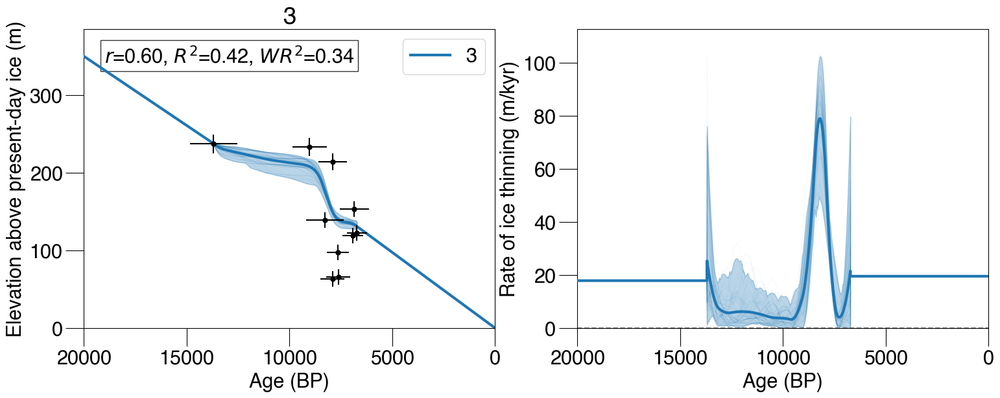

=== Running site 4 with test C1c ===
1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71 72 75 76 78 79 80 81 82 83 84 85 86 87 88 89 90 91 92 93 94 95 96 97 98 99 100 101 102 103 104 105 106 107 108 109 110 111 112 113 114 116 117 118 119 120 121 122 123 124 125 126 127 128 129 130 131 132 133 134 135 136 137 142 143 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161 162 163 164 165 166 167 168 169 concordant,concordant,concordant,1,1,1,1,1,concordant,concordant,concordant,concordant,concordant,Be,concordant,concordant,concordant,1,1,concordant,concordant,1,concordant,concordant,concordant,1,1,Be,concordant,concordant,Be,concordant,1,1,concordant,concordant,concordant,concordant,concordant,1,1,1,concordant,concordant,1,concordant,1,concordant,1,1,concordant,1,concordant,1,1,1,concordant,concordant,1,concordant,concord

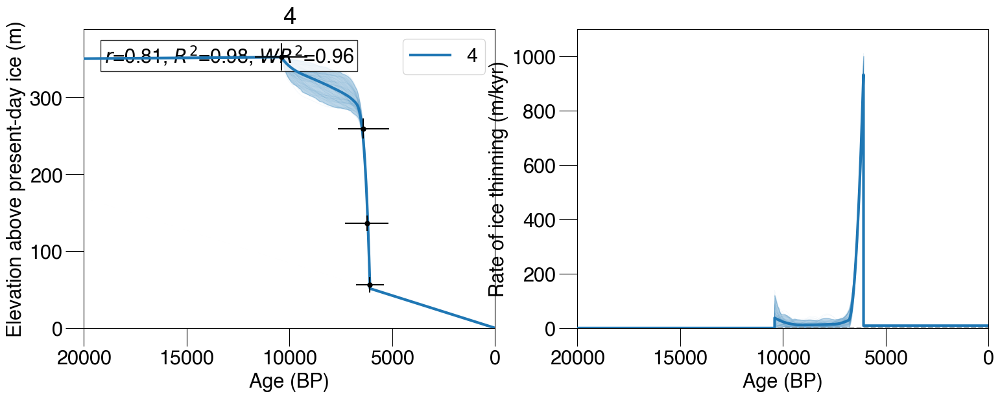

=== Running site 7 with test C3a ===
1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71 72 75 76 78 79 80 81 82 83 84 85 86 87 88 89 90 91 92 93 94 95 96 97 98 99 100 101 102 103 104 105 106 107 108 109 110 111 112 113 114 116 117 118 119 120 121 122 123 124 125 126 127 128 129 130 131 132 133 134 135 136 137 142 143 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161 162 163 164 165 166 167 168 169 concordant,concordant,concordant,1,1,1,1,1,concordant,concordant,concordant,concordant,concordant,Be,concordant,concordant,concordant,1,1,concordant,concordant,1,concordant,concordant,concordant,1,1,Be,concordant,concordant,Be,concordant,1,1,concordant,concordant,concordant,concordant,concordant,1,1,1,concordant,concordant,1,concordant,1,concordant,1,1,concordant,1,concordant,1,1,1,concordant,concordant,1,concordant,concord

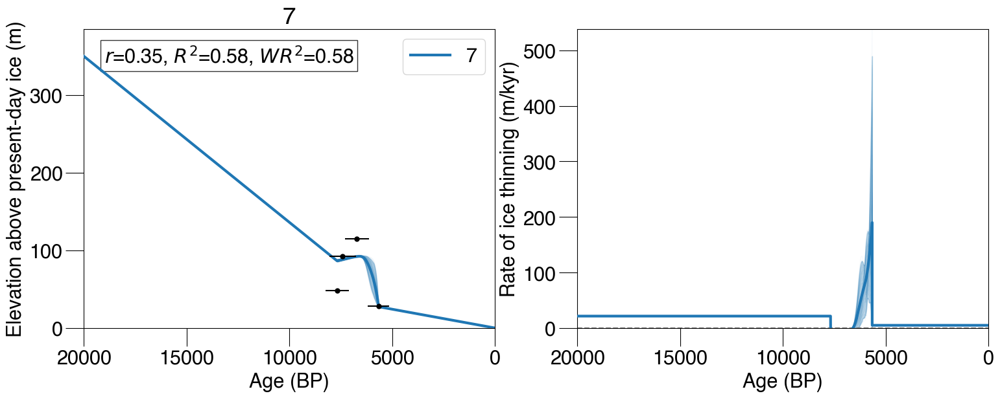

=== Running site 11 with test C8a ===
1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71 72 75 76 78 79 80 81 82 83 84 85 86 87 88 89 90 91 92 93 94 95 96 97 98 99 100 101 102 103 104 105 106 107 108 109 110 111 112 113 114 116 117 118 119 120 121 122 123 124 125 126 127 128 129 130 131 132 133 134 135 136 137 142 143 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161 162 163 164 165 166 167 168 169 concordant,concordant,concordant,1,1,1,1,1,concordant,concordant,concordant,concordant,concordant,Be,concordant,concordant,concordant,1,1,concordant,concordant,1,concordant,concordant,concordant,1,1,Be,concordant,concordant,Be,concordant,1,1,concordant,concordant,concordant,concordant,concordant,1,1,1,concordant,concordant,1,concordant,1,concordant,1,1,concordant,1,concordant,1,1,1,concordant,concordant,1,concordant,concor

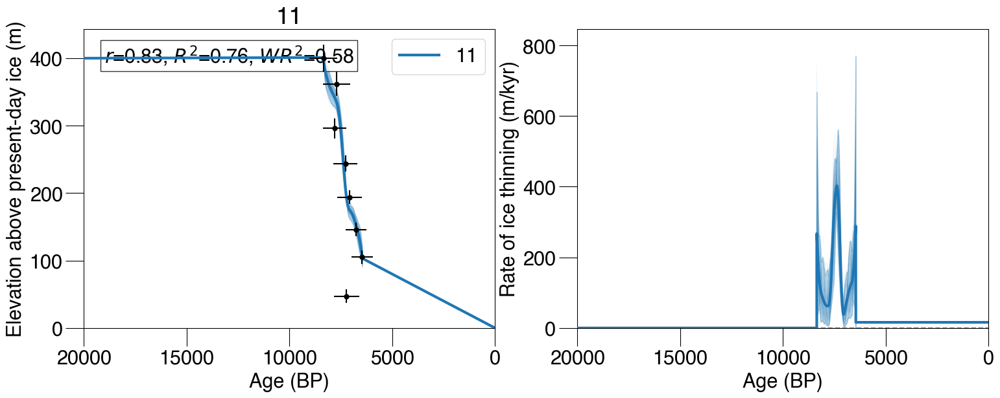

=== Running site 15 with test C3a ===
1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71 72 75 76 78 79 80 81 82 83 84 85 86 87 88 89 90 91 92 93 94 95 96 97 98 99 100 101 102 103 104 105 106 107 108 109 110 111 112 113 114 116 117 118 119 120 121 122 123 124 125 126 127 128 129 130 131 132 133 134 135 136 137 142 143 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161 162 163 164 165 166 167 168 169 concordant,concordant,concordant,1,1,1,1,1,concordant,concordant,concordant,concordant,concordant,Be,concordant,concordant,concordant,1,1,concordant,concordant,1,concordant,concordant,concordant,1,1,Be,concordant,concordant,Be,concordant,1,1,concordant,concordant,concordant,concordant,concordant,1,1,1,concordant,concordant,1,concordant,1,concordant,1,1,concordant,1,concordant,1,1,1,concordant,concordant,1,concordant,concor

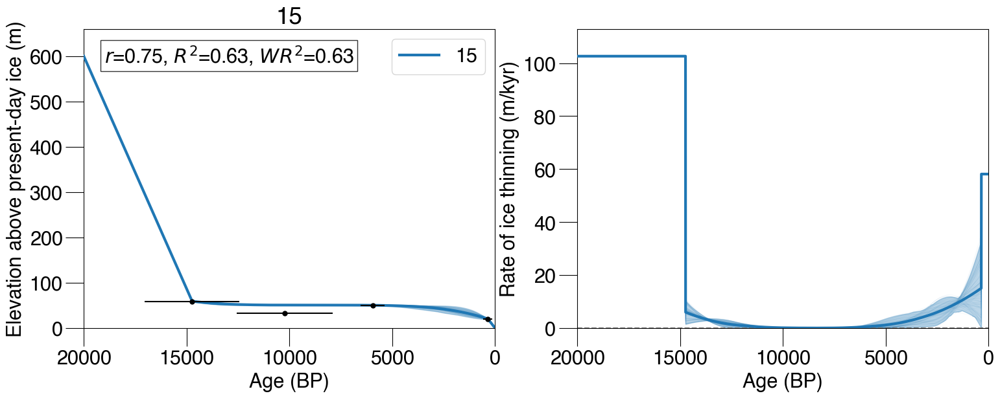

=== Running site 17 with test C3a ===
1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71 72 75 76 78 79 80 81 82 83 84 85 86 87 88 89 90 91 92 93 94 95 96 97 98 99 100 101 102 103 104 105 106 107 108 109 110 111 112 113 114 116 117 118 119 120 121 122 123 124 125 126 127 128 129 130 131 132 133 134 135 136 137 142 143 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161 162 163 164 165 166 167 168 169 concordant,concordant,concordant,1,1,1,1,1,concordant,concordant,concordant,concordant,concordant,Be,concordant,concordant,concordant,1,1,concordant,concordant,1,concordant,concordant,concordant,1,1,Be,concordant,concordant,Be,concordant,1,1,concordant,concordant,concordant,concordant,concordant,1,1,1,concordant,concordant,1,concordant,1,concordant,1,1,concordant,1,concordant,1,1,1,concordant,concordant,1,concordant,concor

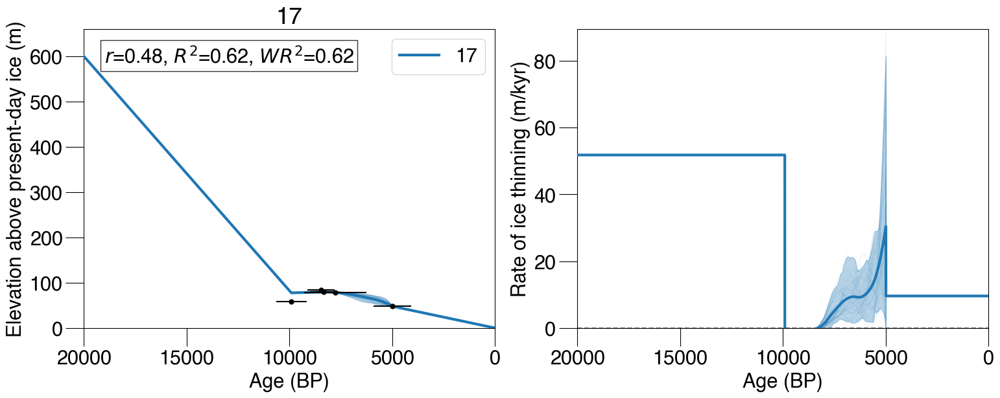

=== Running site 21 with test C3a ===
1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71 72 75 76 78 79 80 81 82 83 84 85 86 87 88 89 90 91 92 93 94 95 96 97 98 99 100 101 102 103 104 105 106 107 108 109 110 111 112 113 114 116 117 118 119 120 121 122 123 124 125 126 127 128 129 130 131 132 133 134 135 136 137 142 143 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161 162 163 164 165 166 167 168 169 concordant,concordant,concordant,1,1,1,1,1,concordant,concordant,concordant,concordant,concordant,Be,concordant,concordant,concordant,1,1,concordant,concordant,1,concordant,concordant,concordant,1,1,Be,concordant,concordant,Be,concordant,1,1,concordant,concordant,concordant,concordant,concordant,1,1,1,concordant,concordant,1,concordant,1,concordant,1,1,concordant,1,concordant,1,1,1,concordant,concordant,1,concordant,concor

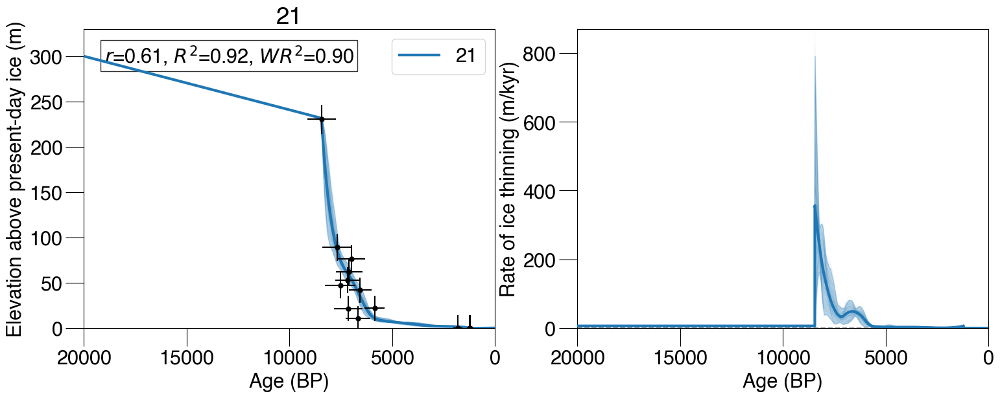

=== Running site 22 with test C3a ===
1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71 72 75 76 78 79 80 81 82 83 84 85 86 87 88 89 90 91 92 93 94 95 96 97 98 99 100 101 102 103 104 105 106 107 108 109 110 111 112 113 114 116 117 118 119 120 121 122 123 124 125 126 127 128 129 130 131 132 133 134 135 136 137 142 143 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161 162 163 164 165 166 167 168 169 concordant,concordant,concordant,1,1,1,1,1,concordant,concordant,concordant,concordant,concordant,Be,concordant,concordant,concordant,1,1,concordant,concordant,1,concordant,concordant,concordant,1,1,Be,concordant,concordant,Be,concordant,1,1,concordant,concordant,concordant,concordant,concordant,1,1,1,concordant,concordant,1,concordant,1,concordant,1,1,concordant,1,concordant,1,1,1,concordant,concordant,1,concordant,concor

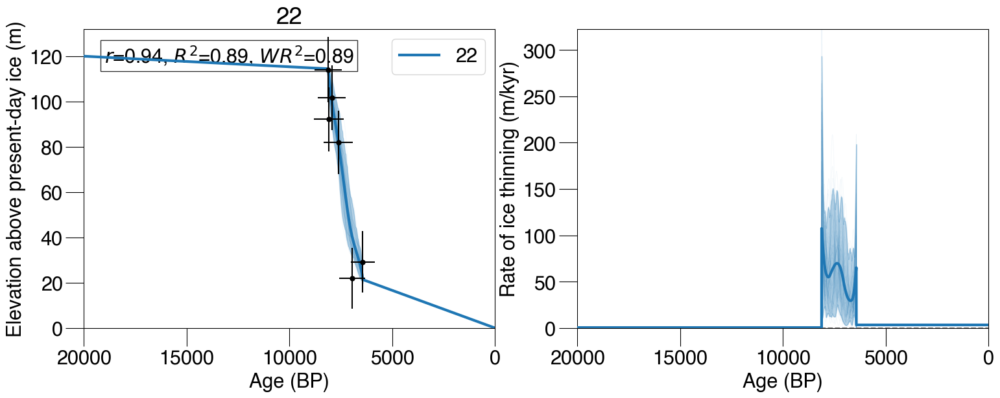

=== Running site 24 with test C3a ===
1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71 72 75 76 78 79 80 81 82 83 84 85 86 87 88 89 90 91 92 93 94 95 96 97 98 99 100 101 102 103 104 105 106 107 108 109 110 111 112 113 114 116 117 118 119 120 121 122 123 124 125 126 127 128 129 130 131 132 133 134 135 136 137 142 143 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161 162 163 164 165 166 167 168 169 concordant,concordant,concordant,1,1,1,1,1,concordant,concordant,concordant,concordant,concordant,Be,concordant,concordant,concordant,1,1,concordant,concordant,1,concordant,concordant,concordant,1,1,Be,concordant,concordant,Be,concordant,1,1,concordant,concordant,concordant,concordant,concordant,1,1,1,concordant,concordant,1,concordant,1,concordant,1,1,concordant,1,concordant,1,1,1,concordant,concordant,1,concordant,concor

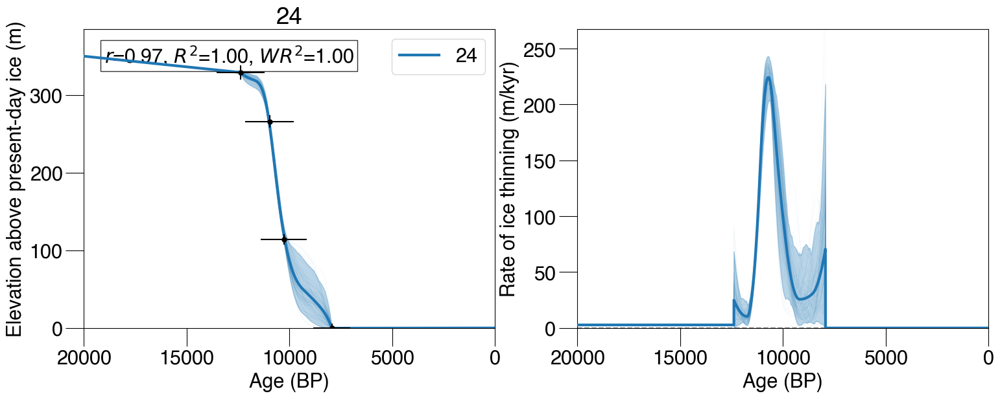

=== Running site 27 with test C3a ===
1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71 72 75 76 78 79 80 81 82 83 84 85 86 87 88 89 90 91 92 93 94 95 96 97 98 99 100 101 102 103 104 105 106 107 108 109 110 111 112 113 114 116 117 118 119 120 121 122 123 124 125 126 127 128 129 130 131 132 133 134 135 136 137 142 143 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161 162 163 164 165 166 167 168 169 concordant,concordant,concordant,1,1,1,1,1,concordant,concordant,concordant,concordant,concordant,Be,concordant,concordant,concordant,1,1,concordant,concordant,1,concordant,concordant,concordant,1,1,Be,concordant,concordant,Be,concordant,1,1,concordant,concordant,concordant,concordant,concordant,1,1,1,concordant,concordant,1,concordant,1,concordant,1,1,concordant,1,concordant,1,1,1,concordant,concordant,1,concordant,concor

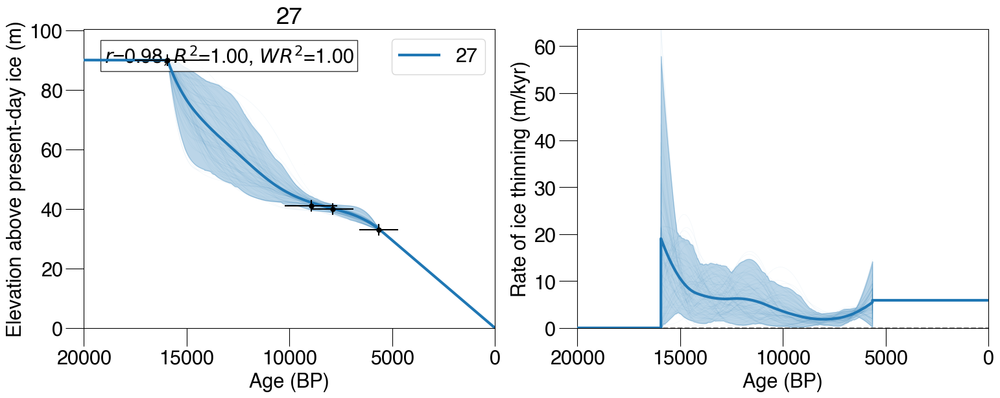

=== Running site 42 with test C3a ===
1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71 72 75 76 78 79 80 81 82 83 84 85 86 87 88 89 90 91 92 93 94 95 96 97 98 99 100 101 102 103 104 105 106 107 108 109 110 111 112 113 114 116 117 118 119 120 121 122 123 124 125 126 127 128 129 130 131 132 133 134 135 136 137 142 143 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161 162 163 164 165 166 167 168 169 concordant,concordant,concordant,1,1,1,1,1,concordant,concordant,concordant,concordant,concordant,Be,concordant,concordant,concordant,1,1,concordant,concordant,1,concordant,concordant,concordant,1,1,Be,concordant,concordant,Be,concordant,1,1,concordant,concordant,concordant,concordant,concordant,1,1,1,concordant,concordant,1,concordant,1,concordant,1,1,concordant,1,concordant,1,1,1,concordant,concordant,1,concordant,concor

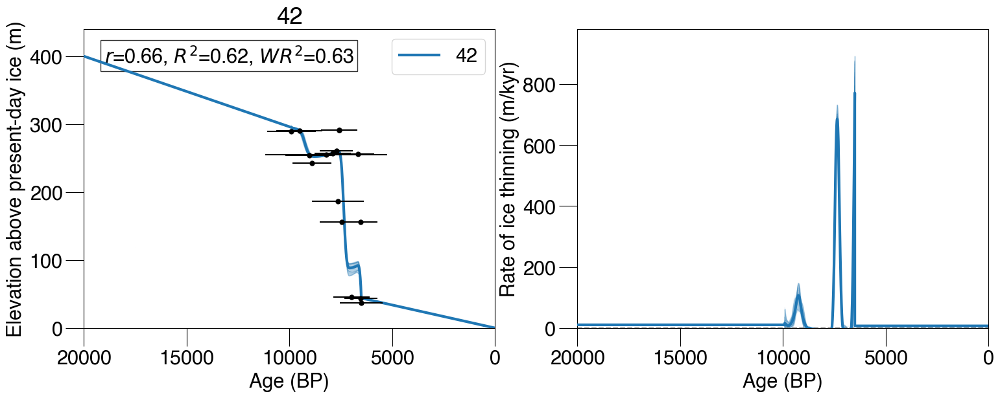

=== Running site 28 with test C7a ===
1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71 72 75 76 78 79 80 81 82 83 84 85 86 87 88 89 90 91 92 93 94 95 96 97 98 99 100 101 102 103 104 105 106 107 108 109 110 111 112 113 114 116 117 118 119 120 121 122 123 124 125 126 127 128 129 130 131 132 133 134 135 136 137 142 143 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161 162 163 164 165 166 167 168 169 concordant,concordant,concordant,1,1,1,1,1,concordant,concordant,concordant,concordant,concordant,Be,concordant,concordant,concordant,1,1,concordant,concordant,1,concordant,concordant,concordant,1,1,Be,concordant,concordant,Be,concordant,1,1,concordant,concordant,concordant,concordant,concordant,1,1,1,concordant,concordant,1,concordant,1,concordant,1,1,concordant,1,concordant,1,1,1,concordant,concordant,1,concordant,concor

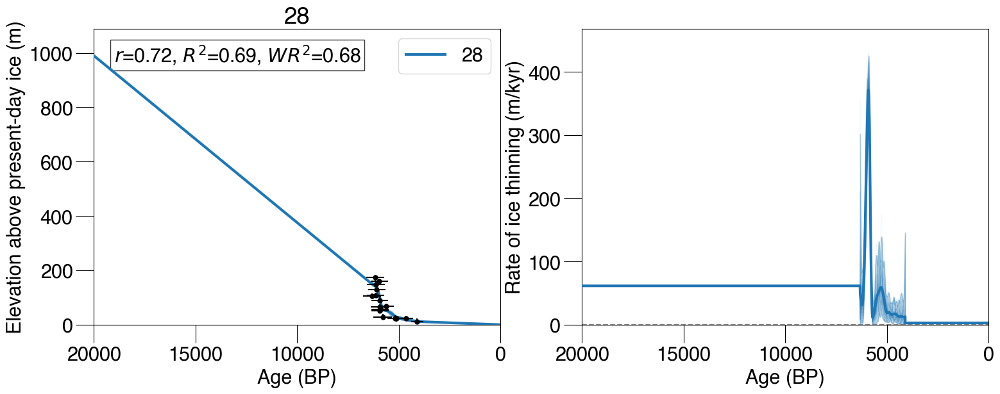

=== Running site 72 with test C3a ===
1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71 72 75 76 78 79 80 81 82 83 84 85 86 87 88 89 90 91 92 93 94 95 96 97 98 99 100 101 102 103 104 105 106 107 108 109 110 111 112 113 114 116 117 118 119 120 121 122 123 124 125 126 127 128 129 130 131 132 133 134 135 136 137 142 143 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161 162 163 164 165 166 167 168 169 concordant,concordant,concordant,1,1,1,1,1,concordant,concordant,concordant,concordant,concordant,Be,concordant,concordant,concordant,1,1,concordant,concordant,1,concordant,concordant,concordant,1,1,Be,concordant,concordant,Be,concordant,1,1,concordant,concordant,concordant,concordant,concordant,1,1,1,concordant,concordant,1,concordant,1,concordant,1,1,concordant,1,concordant,1,1,1,concordant,concordant,1,concordant,concor

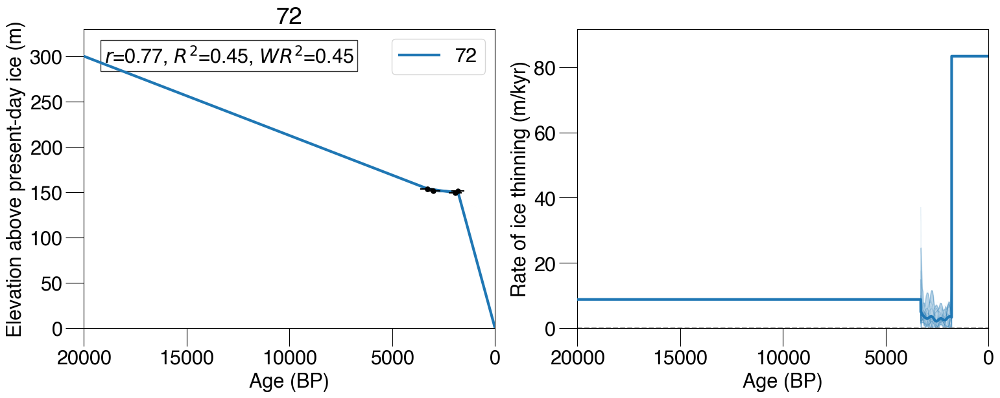

=== Running site 30 with test C3a ===
1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71 72 75 76 78 79 80 81 82 83 84 85 86 87 88 89 90 91 92 93 94 95 96 97 98 99 100 101 102 103 104 105 106 107 108 109 110 111 112 113 114 116 117 118 119 120 121 122 123 124 125 126 127 128 129 130 131 132 133 134 135 136 137 142 143 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161 162 163 164 165 166 167 168 169 concordant,concordant,concordant,1,1,1,1,1,concordant,concordant,concordant,concordant,concordant,Be,concordant,concordant,concordant,1,1,concordant,concordant,1,concordant,concordant,concordant,1,1,Be,concordant,concordant,Be,concordant,1,1,concordant,concordant,concordant,concordant,concordant,1,1,1,concordant,concordant,1,concordant,1,concordant,1,1,concordant,1,concordant,1,1,1,concordant,concordant,1,concordant,concor

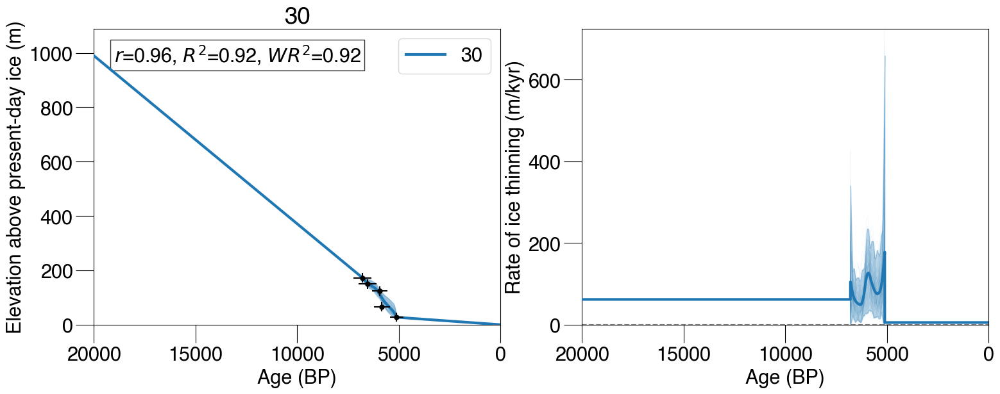

=== Running site 33 with test C5c ===
1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71 72 75 76 78 79 80 81 82 83 84 85 86 87 88 89 90 91 92 93 94 95 96 97 98 99 100 101 102 103 104 105 106 107 108 109 110 111 112 113 114 116 117 118 119 120 121 122 123 124 125 126 127 128 129 130 131 132 133 134 135 136 137 142 143 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161 162 163 164 165 166 167 168 169 concordant,concordant,concordant,1,1,1,1,1,concordant,concordant,concordant,concordant,concordant,Be,concordant,concordant,concordant,1,1,concordant,concordant,1,concordant,concordant,concordant,1,1,Be,concordant,concordant,Be,concordant,1,1,concordant,concordant,concordant,concordant,concordant,1,1,1,concordant,concordant,1,concordant,1,concordant,1,1,concordant,1,concordant,1,1,1,concordant,concordant,1,concordant,concor

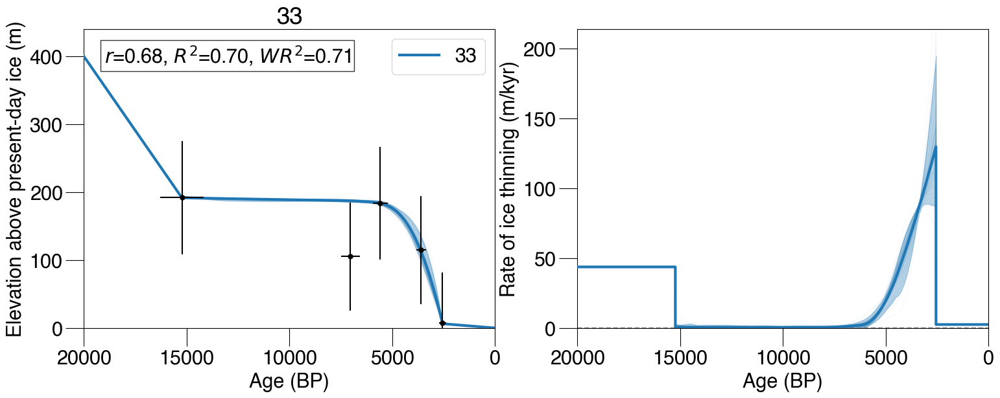

=== Running site 34 with test C3a ===
1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71 72 75 76 78 79 80 81 82 83 84 85 86 87 88 89 90 91 92 93 94 95 96 97 98 99 100 101 102 103 104 105 106 107 108 109 110 111 112 113 114 116 117 118 119 120 121 122 123 124 125 126 127 128 129 130 131 132 133 134 135 136 137 142 143 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161 162 163 164 165 166 167 168 169 concordant,concordant,concordant,1,1,1,1,1,concordant,concordant,concordant,concordant,concordant,Be,concordant,concordant,concordant,1,1,concordant,concordant,1,concordant,concordant,concordant,1,1,Be,concordant,concordant,Be,concordant,1,1,concordant,concordant,concordant,concordant,concordant,1,1,1,concordant,concordant,1,concordant,1,concordant,1,1,concordant,1,concordant,1,1,1,concordant,concordant,1,concordant,concor

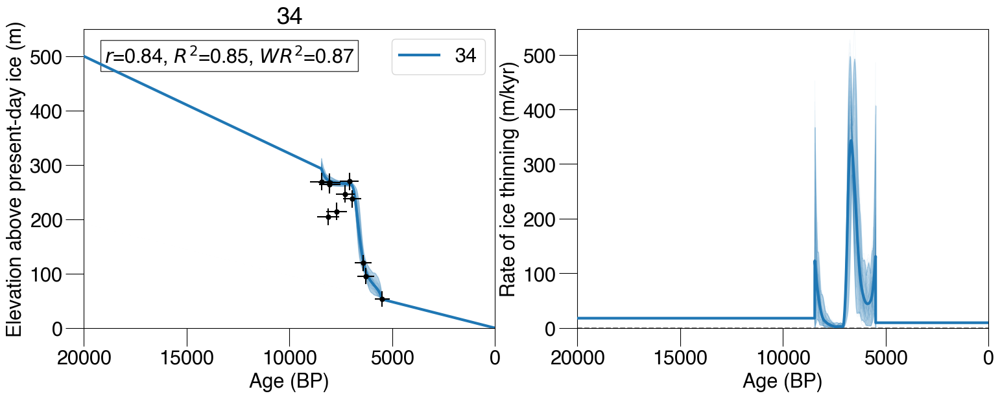

=== Running site 75 with test C11 ===
1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71 72 75 76 78 79 80 81 82 83 84 85 86 87 88 89 90 91 92 93 94 95 96 97 98 99 100 101 102 103 104 105 106 107 108 109 110 111 112 113 114 116 117 118 119 120 121 122 123 124 125 126 127 128 129 130 131 132 133 134 135 136 137 142 143 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161 162 163 164 165 166 167 168 169 concordant,concordant,concordant,1,1,1,1,1,concordant,concordant,concordant,concordant,concordant,Be,concordant,concordant,concordant,1,1,concordant,concordant,1,concordant,concordant,concordant,1,1,Be,concordant,concordant,Be,concordant,1,1,concordant,concordant,concordant,concordant,concordant,1,1,1,concordant,concordant,1,concordant,1,concordant,1,1,concordant,1,concordant,1,1,1,concordant,concordant,1,concordant,concor

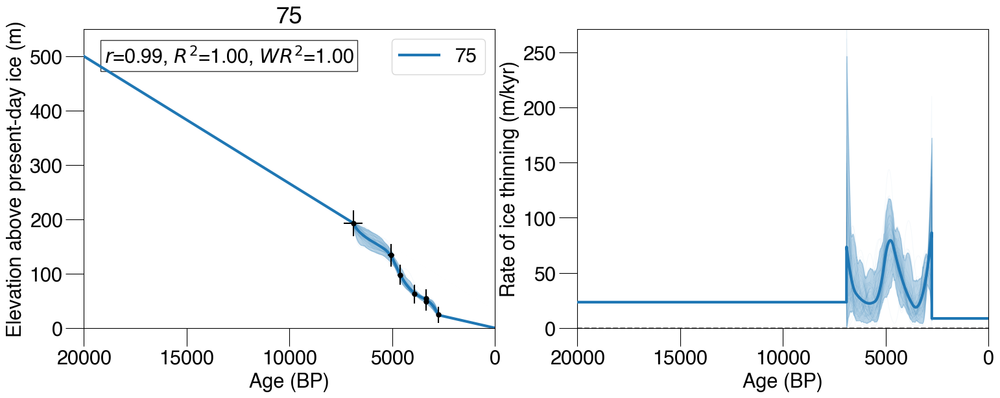

=== Running site 37 with test C3a ===
1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71 72 75 76 78 79 80 81 82 83 84 85 86 87 88 89 90 91 92 93 94 95 96 97 98 99 100 101 102 103 104 105 106 107 108 109 110 111 112 113 114 116 117 118 119 120 121 122 123 124 125 126 127 128 129 130 131 132 133 134 135 136 137 142 143 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161 162 163 164 165 166 167 168 169 concordant,concordant,concordant,1,1,1,1,1,concordant,concordant,concordant,concordant,concordant,Be,concordant,concordant,concordant,1,1,concordant,concordant,1,concordant,concordant,concordant,1,1,Be,concordant,concordant,Be,concordant,1,1,concordant,concordant,concordant,concordant,concordant,1,1,1,concordant,concordant,1,concordant,1,concordant,1,1,concordant,1,concordant,1,1,1,concordant,concordant,1,concordant,concor

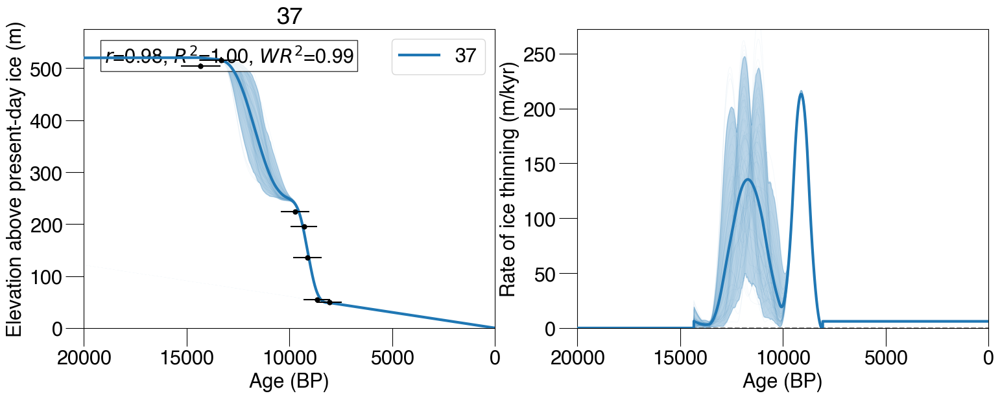

=== Running site 39 with test C4c ===
1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71 72 75 76 78 79 80 81 82 83 84 85 86 87 88 89 90 91 92 93 94 95 96 97 98 99 100 101 102 103 104 105 106 107 108 109 110 111 112 113 114 116 117 118 119 120 121 122 123 124 125 126 127 128 129 130 131 132 133 134 135 136 137 142 143 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161 162 163 164 165 166 167 168 169 concordant,concordant,concordant,1,1,1,1,1,concordant,concordant,concordant,concordant,concordant,Be,concordant,concordant,concordant,1,1,concordant,concordant,1,concordant,concordant,concordant,1,1,Be,concordant,concordant,Be,concordant,1,1,concordant,concordant,concordant,concordant,concordant,1,1,1,concordant,concordant,1,concordant,1,concordant,1,1,concordant,1,concordant,1,1,1,concordant,concordant,1,concordant,concor

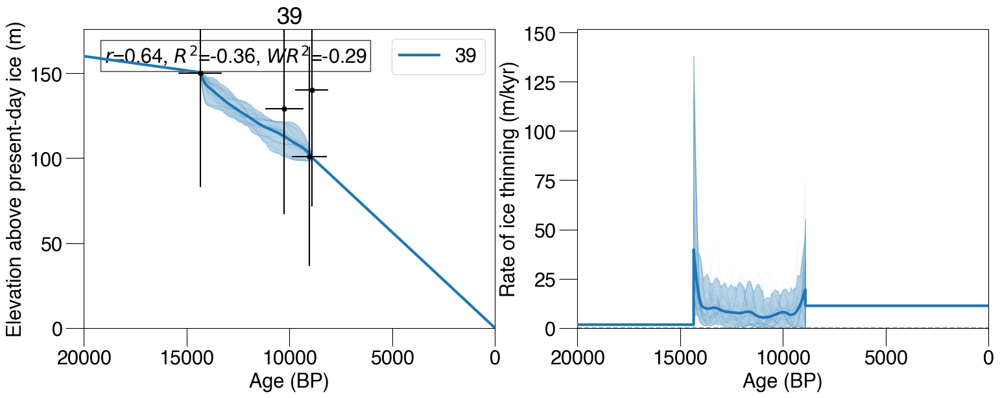

=== Running site 40 with test C3a ===
1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71 72 75 76 78 79 80 81 82 83 84 85 86 87 88 89 90 91 92 93 94 95 96 97 98 99 100 101 102 103 104 105 106 107 108 109 110 111 112 113 114 116 117 118 119 120 121 122 123 124 125 126 127 128 129 130 131 132 133 134 135 136 137 142 143 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161 162 163 164 165 166 167 168 169 concordant,concordant,concordant,1,1,1,1,1,concordant,concordant,concordant,concordant,concordant,Be,concordant,concordant,concordant,1,1,concordant,concordant,1,concordant,concordant,concordant,1,1,Be,concordant,concordant,Be,concordant,1,1,concordant,concordant,concordant,concordant,concordant,1,1,1,concordant,concordant,1,concordant,1,concordant,1,1,concordant,1,concordant,1,1,1,concordant,concordant,1,concordant,concor

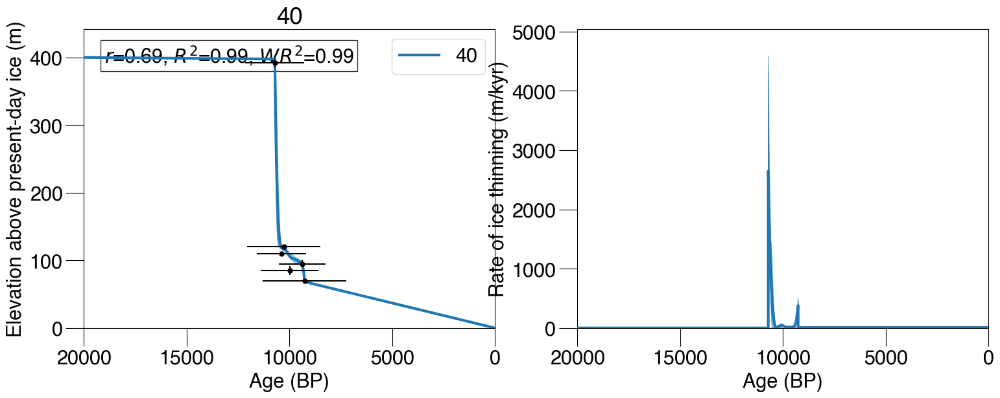

=== Running site 45 with test C3a ===
1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71 72 75 76 78 79 80 81 82 83 84 85 86 87 88 89 90 91 92 93 94 95 96 97 98 99 100 101 102 103 104 105 106 107 108 109 110 111 112 113 114 116 117 118 119 120 121 122 123 124 125 126 127 128 129 130 131 132 133 134 135 136 137 142 143 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161 162 163 164 165 166 167 168 169 concordant,concordant,concordant,1,1,1,1,1,concordant,concordant,concordant,concordant,concordant,Be,concordant,concordant,concordant,1,1,concordant,concordant,1,concordant,concordant,concordant,1,1,Be,concordant,concordant,Be,concordant,1,1,concordant,concordant,concordant,concordant,concordant,1,1,1,concordant,concordant,1,concordant,1,concordant,1,1,concordant,1,concordant,1,1,1,concordant,concordant,1,concordant,concor

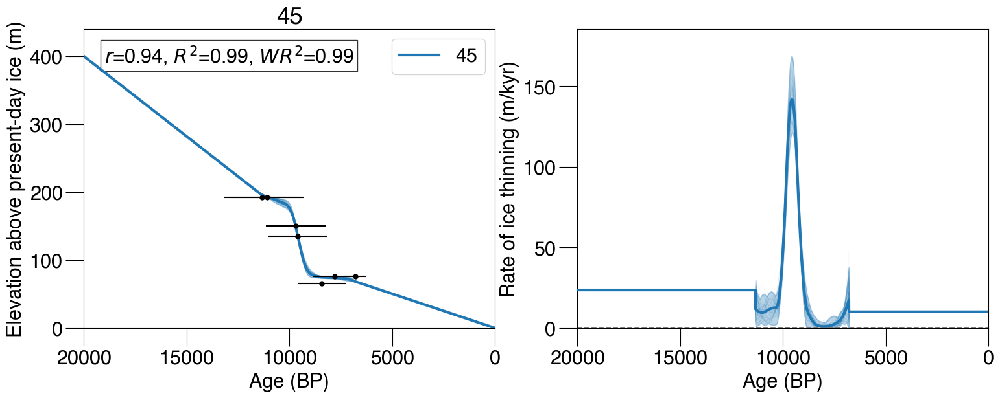

=== Running site 46 with test C3a ===
1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71 72 75 76 78 79 80 81 82 83 84 85 86 87 88 89 90 91 92 93 94 95 96 97 98 99 100 101 102 103 104 105 106 107 108 109 110 111 112 113 114 116 117 118 119 120 121 122 123 124 125 126 127 128 129 130 131 132 133 134 135 136 137 142 143 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161 162 163 164 165 166 167 168 169 concordant,concordant,concordant,1,1,1,1,1,concordant,concordant,concordant,concordant,concordant,Be,concordant,concordant,concordant,1,1,concordant,concordant,1,concordant,concordant,concordant,1,1,Be,concordant,concordant,Be,concordant,1,1,concordant,concordant,concordant,concordant,concordant,1,1,1,concordant,concordant,1,concordant,1,concordant,1,1,concordant,1,concordant,1,1,1,concordant,concordant,1,concordant,concor

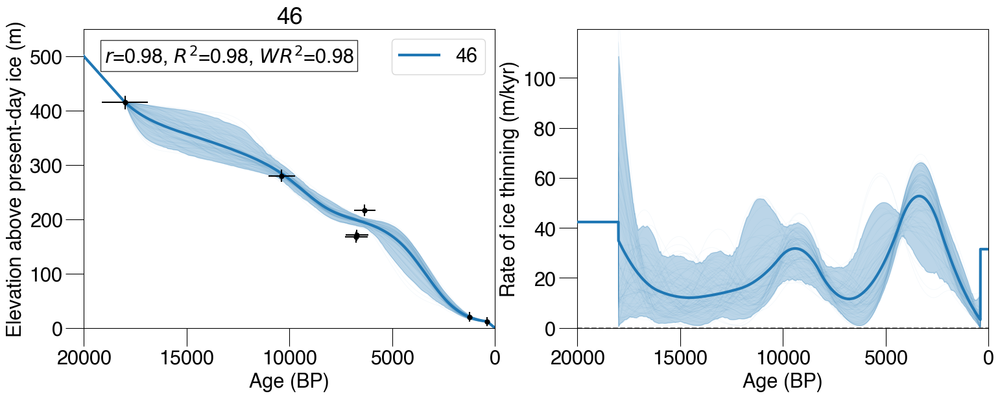

=== Running site 47 with test C3a ===
1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71 72 75 76 78 79 80 81 82 83 84 85 86 87 88 89 90 91 92 93 94 95 96 97 98 99 100 101 102 103 104 105 106 107 108 109 110 111 112 113 114 116 117 118 119 120 121 122 123 124 125 126 127 128 129 130 131 132 133 134 135 136 137 142 143 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161 162 163 164 165 166 167 168 169 concordant,concordant,concordant,1,1,1,1,1,concordant,concordant,concordant,concordant,concordant,Be,concordant,concordant,concordant,1,1,concordant,concordant,1,concordant,concordant,concordant,1,1,Be,concordant,concordant,Be,concordant,1,1,concordant,concordant,concordant,concordant,concordant,1,1,1,concordant,concordant,1,concordant,1,concordant,1,1,concordant,1,concordant,1,1,1,concordant,concordant,1,concordant,concor

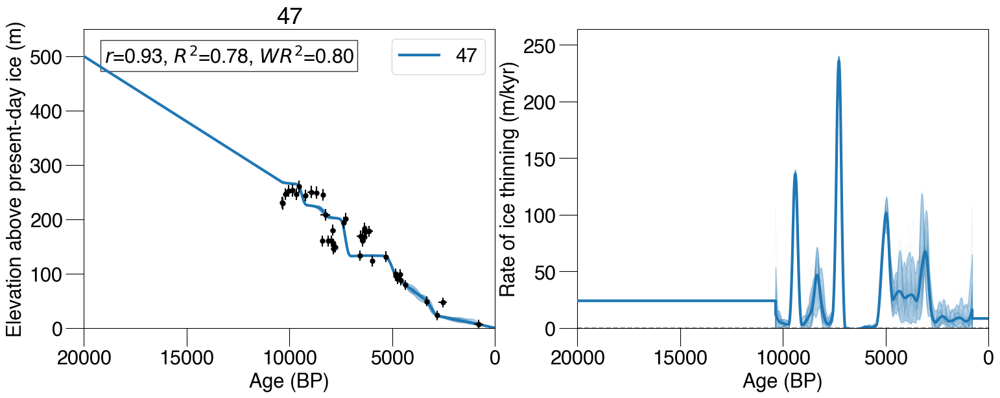

=== Running site 78 with test C3a ===
1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71 72 75 76 78 79 80 81 82 83 84 85 86 87 88 89 90 91 92 93 94 95 96 97 98 99 100 101 102 103 104 105 106 107 108 109 110 111 112 113 114 116 117 118 119 120 121 122 123 124 125 126 127 128 129 130 131 132 133 134 135 136 137 142 143 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161 162 163 164 165 166 167 168 169 concordant,concordant,concordant,1,1,1,1,1,concordant,concordant,concordant,concordant,concordant,Be,concordant,concordant,concordant,1,1,concordant,concordant,1,concordant,concordant,concordant,1,1,Be,concordant,concordant,Be,concordant,1,1,concordant,concordant,concordant,concordant,concordant,1,1,1,concordant,concordant,1,concordant,1,concordant,1,1,concordant,1,concordant,1,1,1,concordant,concordant,1,concordant,concor

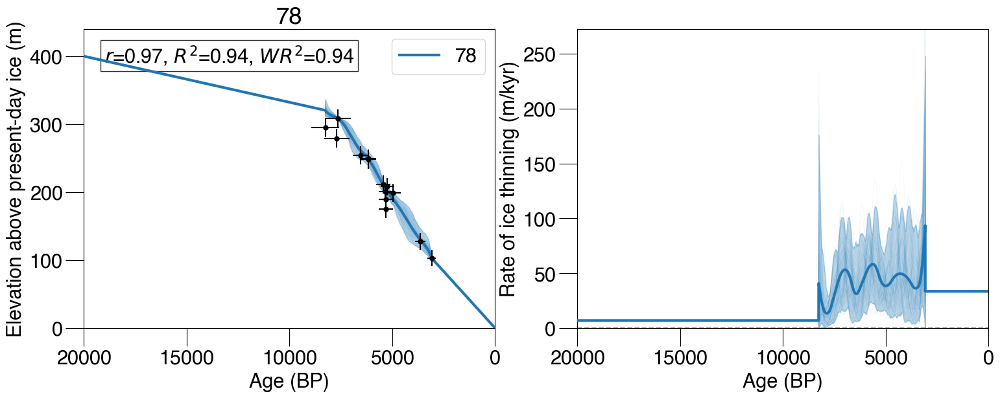

=== Running site 79 with test C3a ===
1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71 72 75 76 78 79 80 81 82 83 84 85 86 87 88 89 90 91 92 93 94 95 96 97 98 99 100 101 102 103 104 105 106 107 108 109 110 111 112 113 114 116 117 118 119 120 121 122 123 124 125 126 127 128 129 130 131 132 133 134 135 136 137 142 143 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161 162 163 164 165 166 167 168 169 concordant,concordant,concordant,1,1,1,1,1,concordant,concordant,concordant,concordant,concordant,Be,concordant,concordant,concordant,1,1,concordant,concordant,1,concordant,concordant,concordant,1,1,Be,concordant,concordant,Be,concordant,1,1,concordant,concordant,concordant,concordant,concordant,1,1,1,concordant,concordant,1,concordant,1,concordant,1,1,concordant,1,concordant,1,1,1,concordant,concordant,1,concordant,concor

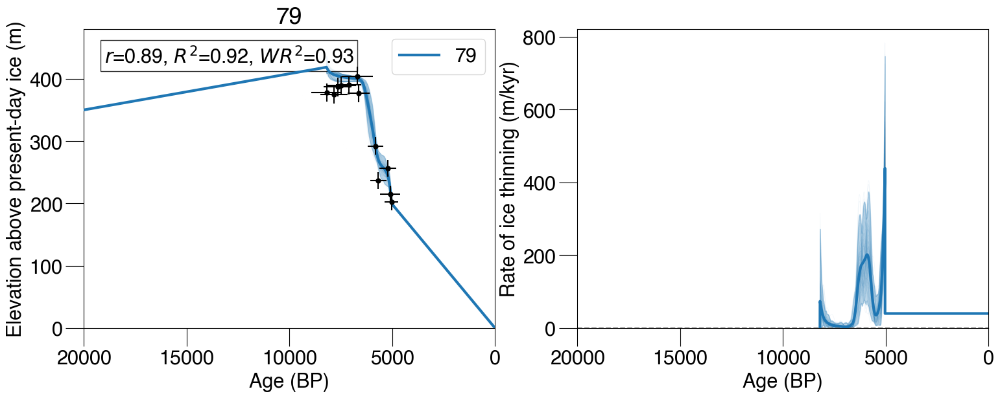

=== Running site 80 with test C3a ===
1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71 72 75 76 78 79 80 81 82 83 84 85 86 87 88 89 90 91 92 93 94 95 96 97 98 99 100 101 102 103 104 105 106 107 108 109 110 111 112 113 114 116 117 118 119 120 121 122 123 124 125 126 127 128 129 130 131 132 133 134 135 136 137 142 143 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161 162 163 164 165 166 167 168 169 concordant,concordant,concordant,1,1,1,1,1,concordant,concordant,concordant,concordant,concordant,Be,concordant,concordant,concordant,1,1,concordant,concordant,1,concordant,concordant,concordant,1,1,Be,concordant,concordant,Be,concordant,1,1,concordant,concordant,concordant,concordant,concordant,1,1,1,concordant,concordant,1,concordant,1,concordant,1,1,concordant,1,concordant,1,1,1,concordant,concordant,1,concordant,concor

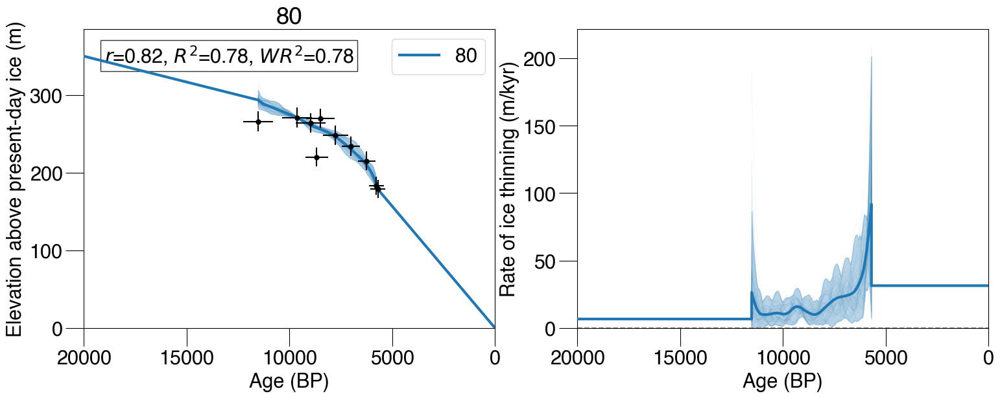

=== Running site 48 with test C6a ===
1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71 72 75 76 78 79 80 81 82 83 84 85 86 87 88 89 90 91 92 93 94 95 96 97 98 99 100 101 102 103 104 105 106 107 108 109 110 111 112 113 114 116 117 118 119 120 121 122 123 124 125 126 127 128 129 130 131 132 133 134 135 136 137 142 143 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161 162 163 164 165 166 167 168 169 concordant,concordant,concordant,1,1,1,1,1,concordant,concordant,concordant,concordant,concordant,Be,concordant,concordant,concordant,1,1,concordant,concordant,1,concordant,concordant,concordant,1,1,Be,concordant,concordant,Be,concordant,1,1,concordant,concordant,concordant,concordant,concordant,1,1,1,concordant,concordant,1,concordant,1,concordant,1,1,concordant,1,concordant,1,1,1,concordant,concordant,1,concordant,concor

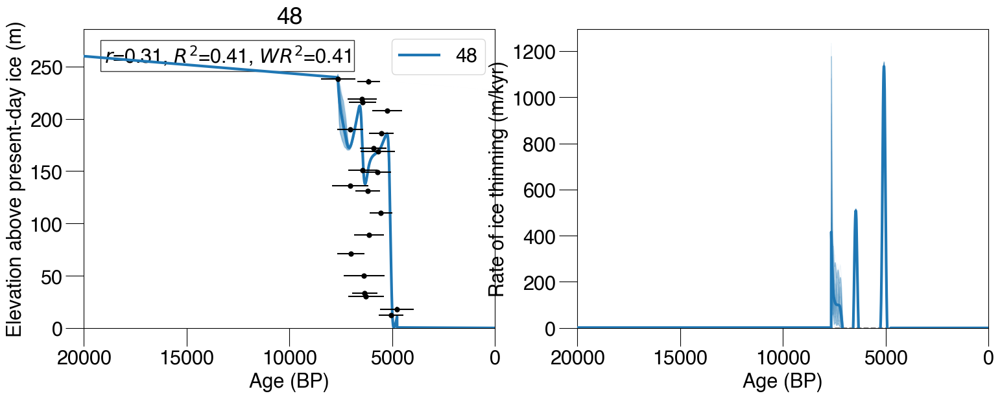

=== Running site 49 with test C4c ===
1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71 72 75 76 78 79 80 81 82 83 84 85 86 87 88 89 90 91 92 93 94 95 96 97 98 99 100 101 102 103 104 105 106 107 108 109 110 111 112 113 114 116 117 118 119 120 121 122 123 124 125 126 127 128 129 130 131 132 133 134 135 136 137 142 143 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161 162 163 164 165 166 167 168 169 concordant,concordant,concordant,1,1,1,1,1,concordant,concordant,concordant,concordant,concordant,Be,concordant,concordant,concordant,1,1,concordant,concordant,1,concordant,concordant,concordant,1,1,Be,concordant,concordant,Be,concordant,1,1,concordant,concordant,concordant,concordant,concordant,1,1,1,concordant,concordant,1,concordant,1,concordant,1,1,concordant,1,concordant,1,1,1,concordant,concordant,1,concordant,concor

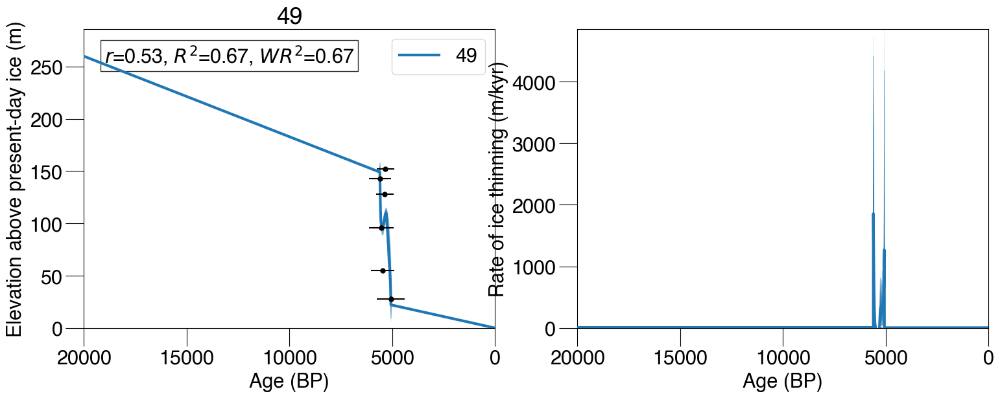

=== Running site 50 with test C6a ===
1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71 72 75 76 78 79 80 81 82 83 84 85 86 87 88 89 90 91 92 93 94 95 96 97 98 99 100 101 102 103 104 105 106 107 108 109 110 111 112 113 114 116 117 118 119 120 121 122 123 124 125 126 127 128 129 130 131 132 133 134 135 136 137 142 143 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161 162 163 164 165 166 167 168 169 concordant,concordant,concordant,1,1,1,1,1,concordant,concordant,concordant,concordant,concordant,Be,concordant,concordant,concordant,1,1,concordant,concordant,1,concordant,concordant,concordant,1,1,Be,concordant,concordant,Be,concordant,1,1,concordant,concordant,concordant,concordant,concordant,1,1,1,concordant,concordant,1,concordant,1,concordant,1,1,concordant,1,concordant,1,1,1,concordant,concordant,1,concordant,concor

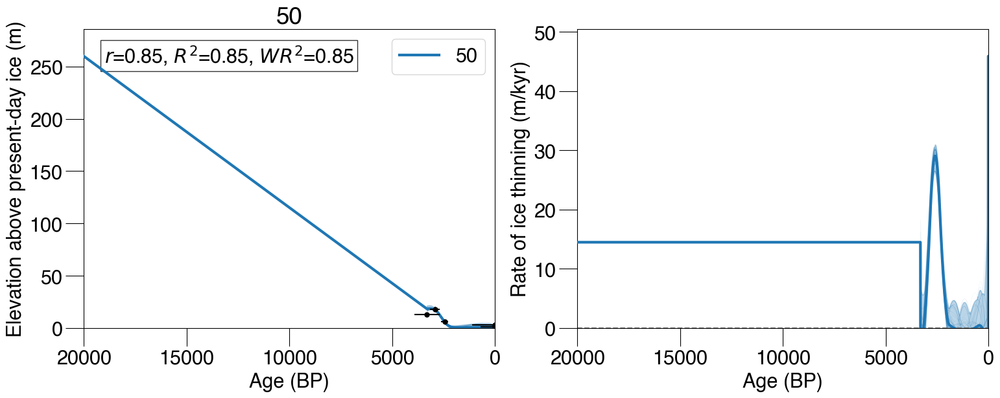

=== Running site 52 with test C3a ===
1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71 72 75 76 78 79 80 81 82 83 84 85 86 87 88 89 90 91 92 93 94 95 96 97 98 99 100 101 102 103 104 105 106 107 108 109 110 111 112 113 114 116 117 118 119 120 121 122 123 124 125 126 127 128 129 130 131 132 133 134 135 136 137 142 143 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161 162 163 164 165 166 167 168 169 concordant,concordant,concordant,1,1,1,1,1,concordant,concordant,concordant,concordant,concordant,Be,concordant,concordant,concordant,1,1,concordant,concordant,1,concordant,concordant,concordant,1,1,Be,concordant,concordant,Be,concordant,1,1,concordant,concordant,concordant,concordant,concordant,1,1,1,concordant,concordant,1,concordant,1,concordant,1,1,concordant,1,concordant,1,1,1,concordant,concordant,1,concordant,concor

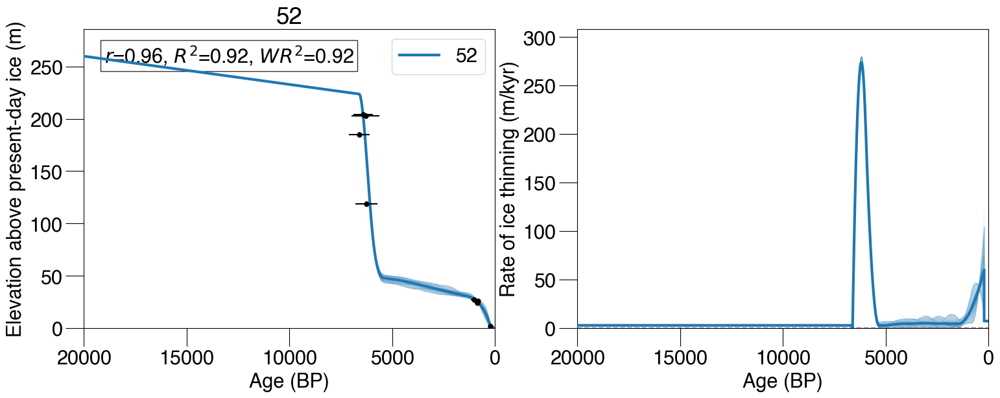

=== Running site 53 with test C3a ===
1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71 72 75 76 78 79 80 81 82 83 84 85 86 87 88 89 90 91 92 93 94 95 96 97 98 99 100 101 102 103 104 105 106 107 108 109 110 111 112 113 114 116 117 118 119 120 121 122 123 124 125 126 127 128 129 130 131 132 133 134 135 136 137 142 143 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161 162 163 164 165 166 167 168 169 concordant,concordant,concordant,1,1,1,1,1,concordant,concordant,concordant,concordant,concordant,Be,concordant,concordant,concordant,1,1,concordant,concordant,1,concordant,concordant,concordant,1,1,Be,concordant,concordant,Be,concordant,1,1,concordant,concordant,concordant,concordant,concordant,1,1,1,concordant,concordant,1,concordant,1,concordant,1,1,concordant,1,concordant,1,1,1,concordant,concordant,1,concordant,concor

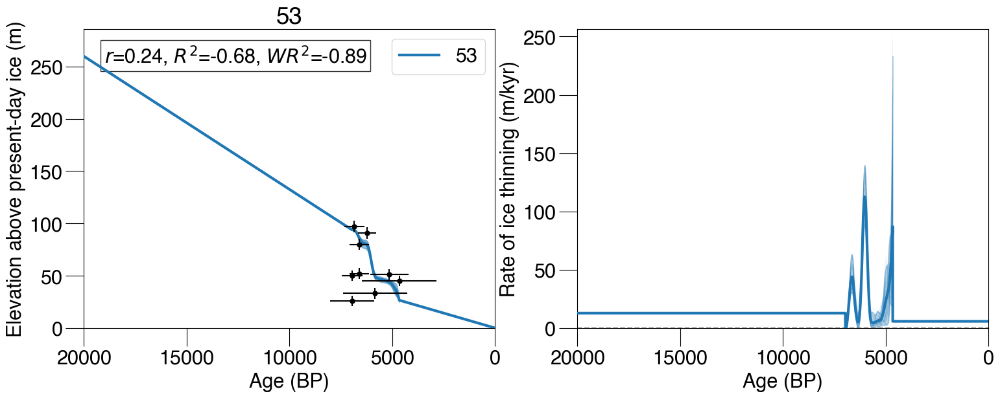

=== Running site 54 with test C4b ===
1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71 72 75 76 78 79 80 81 82 83 84 85 86 87 88 89 90 91 92 93 94 95 96 97 98 99 100 101 102 103 104 105 106 107 108 109 110 111 112 113 114 116 117 118 119 120 121 122 123 124 125 126 127 128 129 130 131 132 133 134 135 136 137 142 143 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161 162 163 164 165 166 167 168 169 concordant,concordant,concordant,1,1,1,1,1,concordant,concordant,concordant,concordant,concordant,Be,concordant,concordant,concordant,1,1,concordant,concordant,1,concordant,concordant,concordant,1,1,Be,concordant,concordant,Be,concordant,1,1,concordant,concordant,concordant,concordant,concordant,1,1,1,concordant,concordant,1,concordant,1,concordant,1,1,concordant,1,concordant,1,1,1,concordant,concordant,1,concordant,concor

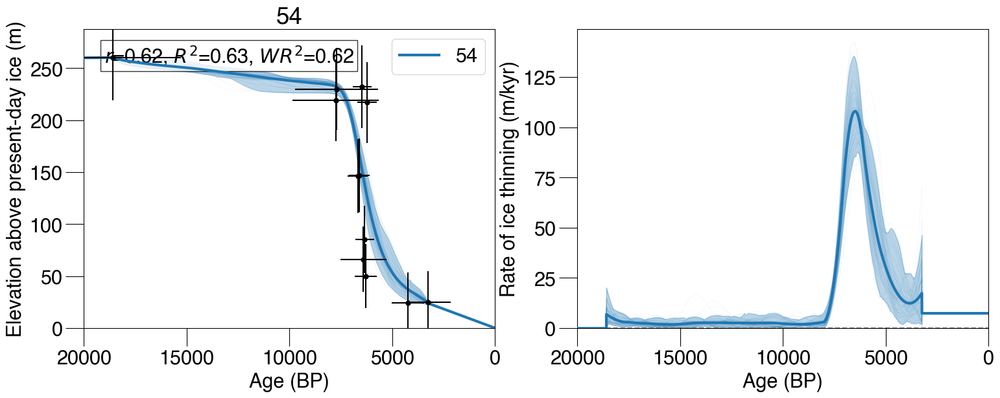

=== Running site 55 with test C3a ===
1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71 72 75 76 78 79 80 81 82 83 84 85 86 87 88 89 90 91 92 93 94 95 96 97 98 99 100 101 102 103 104 105 106 107 108 109 110 111 112 113 114 116 117 118 119 120 121 122 123 124 125 126 127 128 129 130 131 132 133 134 135 136 137 142 143 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161 162 163 164 165 166 167 168 169 concordant,concordant,concordant,1,1,1,1,1,concordant,concordant,concordant,concordant,concordant,Be,concordant,concordant,concordant,1,1,concordant,concordant,1,concordant,concordant,concordant,1,1,Be,concordant,concordant,Be,concordant,1,1,concordant,concordant,concordant,concordant,concordant,1,1,1,concordant,concordant,1,concordant,1,concordant,1,1,concordant,1,concordant,1,1,1,concordant,concordant,1,concordant,concor

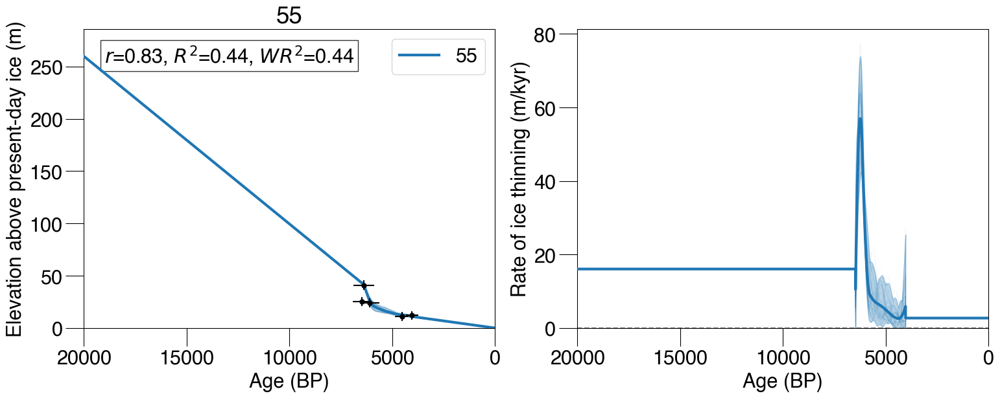

=== Running site 56 with test C3a ===
1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71 72 75 76 78 79 80 81 82 83 84 85 86 87 88 89 90 91 92 93 94 95 96 97 98 99 100 101 102 103 104 105 106 107 108 109 110 111 112 113 114 116 117 118 119 120 121 122 123 124 125 126 127 128 129 130 131 132 133 134 135 136 137 142 143 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161 162 163 164 165 166 167 168 169 concordant,concordant,concordant,1,1,1,1,1,concordant,concordant,concordant,concordant,concordant,Be,concordant,concordant,concordant,1,1,concordant,concordant,1,concordant,concordant,concordant,1,1,Be,concordant,concordant,Be,concordant,1,1,concordant,concordant,concordant,concordant,concordant,1,1,1,concordant,concordant,1,concordant,1,concordant,1,1,concordant,1,concordant,1,1,1,concordant,concordant,1,concordant,concor

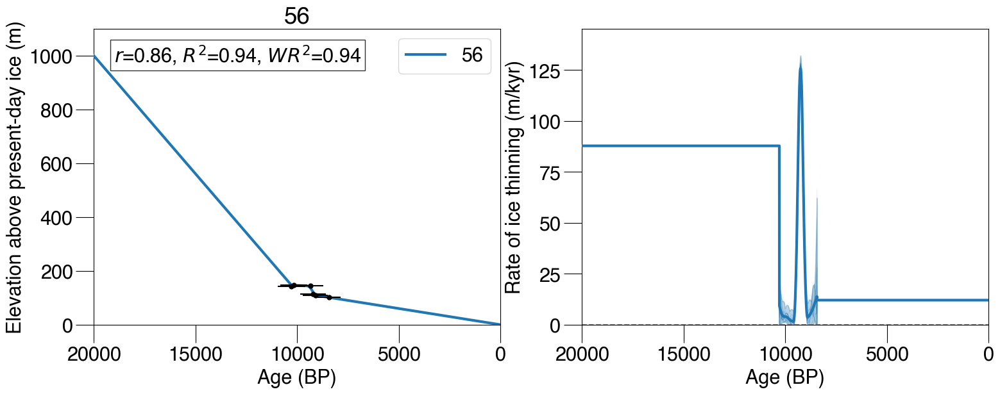

=== Running site 57 with test C4c ===
1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71 72 75 76 78 79 80 81 82 83 84 85 86 87 88 89 90 91 92 93 94 95 96 97 98 99 100 101 102 103 104 105 106 107 108 109 110 111 112 113 114 116 117 118 119 120 121 122 123 124 125 126 127 128 129 130 131 132 133 134 135 136 137 142 143 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161 162 163 164 165 166 167 168 169 concordant,concordant,concordant,1,1,1,1,1,concordant,concordant,concordant,concordant,concordant,Be,concordant,concordant,concordant,1,1,concordant,concordant,1,concordant,concordant,concordant,1,1,Be,concordant,concordant,Be,concordant,1,1,concordant,concordant,concordant,concordant,concordant,1,1,1,concordant,concordant,1,concordant,1,concordant,1,1,concordant,1,concordant,1,1,1,concordant,concordant,1,concordant,concor

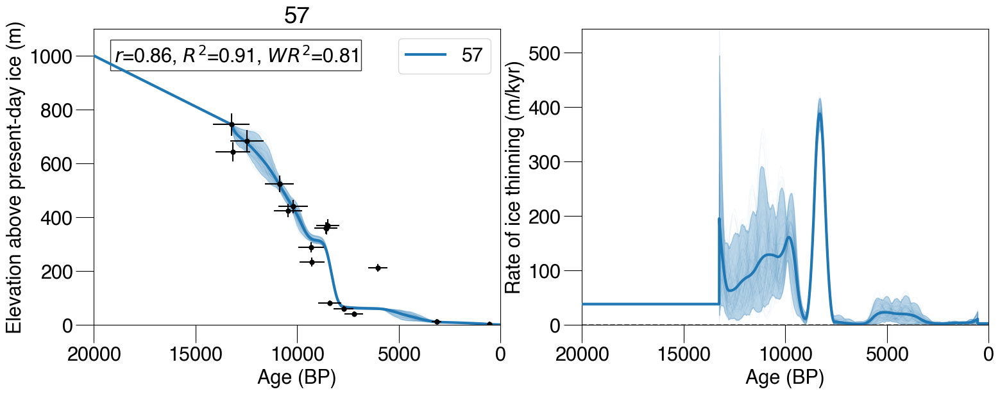

=== Running site 59 with test C3a ===
1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71 72 75 76 78 79 80 81 82 83 84 85 86 87 88 89 90 91 92 93 94 95 96 97 98 99 100 101 102 103 104 105 106 107 108 109 110 111 112 113 114 116 117 118 119 120 121 122 123 124 125 126 127 128 129 130 131 132 133 134 135 136 137 142 143 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161 162 163 164 165 166 167 168 169 concordant,concordant,concordant,1,1,1,1,1,concordant,concordant,concordant,concordant,concordant,Be,concordant,concordant,concordant,1,1,concordant,concordant,1,concordant,concordant,concordant,1,1,Be,concordant,concordant,Be,concordant,1,1,concordant,concordant,concordant,concordant,concordant,1,1,1,concordant,concordant,1,concordant,1,concordant,1,1,concordant,1,concordant,1,1,1,concordant,concordant,1,concordant,concor

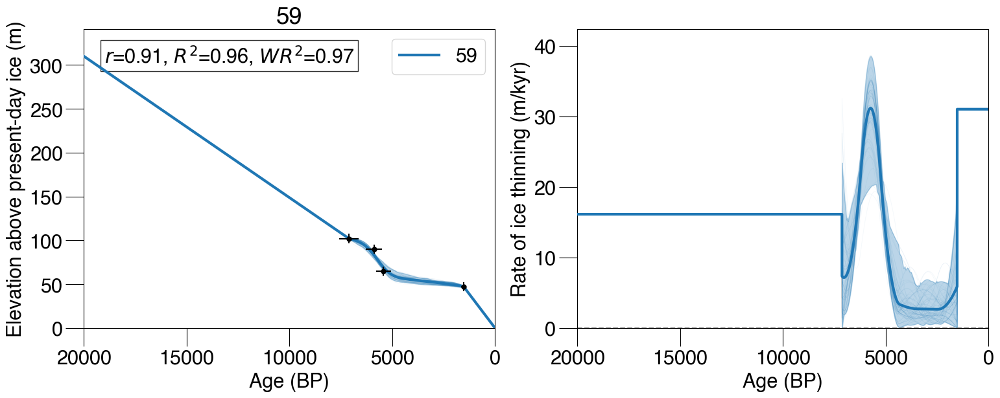

=== Running site 60 with test C6c ===
1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71 72 75 76 78 79 80 81 82 83 84 85 86 87 88 89 90 91 92 93 94 95 96 97 98 99 100 101 102 103 104 105 106 107 108 109 110 111 112 113 114 116 117 118 119 120 121 122 123 124 125 126 127 128 129 130 131 132 133 134 135 136 137 142 143 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161 162 163 164 165 166 167 168 169 concordant,concordant,concordant,1,1,1,1,1,concordant,concordant,concordant,concordant,concordant,Be,concordant,concordant,concordant,1,1,concordant,concordant,1,concordant,concordant,concordant,1,1,Be,concordant,concordant,Be,concordant,1,1,concordant,concordant,concordant,concordant,concordant,1,1,1,concordant,concordant,1,concordant,1,concordant,1,1,concordant,1,concordant,1,1,1,concordant,concordant,1,concordant,concor

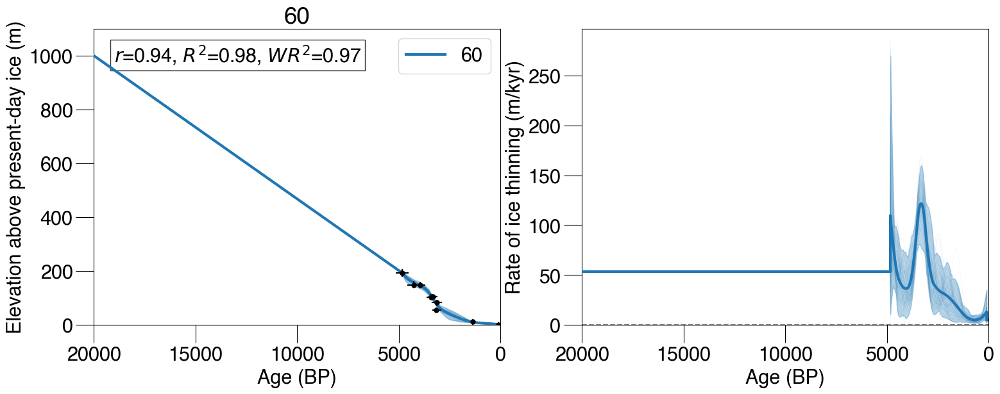

=== Running site 61 with test C11 ===
1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71 72 75 76 78 79 80 81 82 83 84 85 86 87 88 89 90 91 92 93 94 95 96 97 98 99 100 101 102 103 104 105 106 107 108 109 110 111 112 113 114 116 117 118 119 120 121 122 123 124 125 126 127 128 129 130 131 132 133 134 135 136 137 142 143 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161 162 163 164 165 166 167 168 169 concordant,concordant,concordant,1,1,1,1,1,concordant,concordant,concordant,concordant,concordant,Be,concordant,concordant,concordant,1,1,concordant,concordant,1,concordant,concordant,concordant,1,1,Be,concordant,concordant,Be,concordant,1,1,concordant,concordant,concordant,concordant,concordant,1,1,1,concordant,concordant,1,concordant,1,concordant,1,1,concordant,1,concordant,1,1,1,concordant,concordant,1,concordant,concor

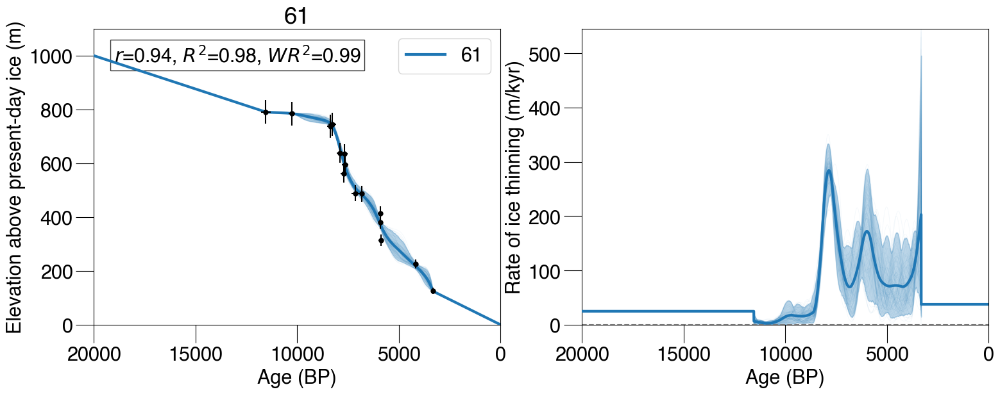

=== Running site 62 with test C3a ===
1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71 72 75 76 78 79 80 81 82 83 84 85 86 87 88 89 90 91 92 93 94 95 96 97 98 99 100 101 102 103 104 105 106 107 108 109 110 111 112 113 114 116 117 118 119 120 121 122 123 124 125 126 127 128 129 130 131 132 133 134 135 136 137 142 143 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161 162 163 164 165 166 167 168 169 concordant,concordant,concordant,1,1,1,1,1,concordant,concordant,concordant,concordant,concordant,Be,concordant,concordant,concordant,1,1,concordant,concordant,1,concordant,concordant,concordant,1,1,Be,concordant,concordant,Be,concordant,1,1,concordant,concordant,concordant,concordant,concordant,1,1,1,concordant,concordant,1,concordant,1,concordant,1,1,concordant,1,concordant,1,1,1,concordant,concordant,1,concordant,concor

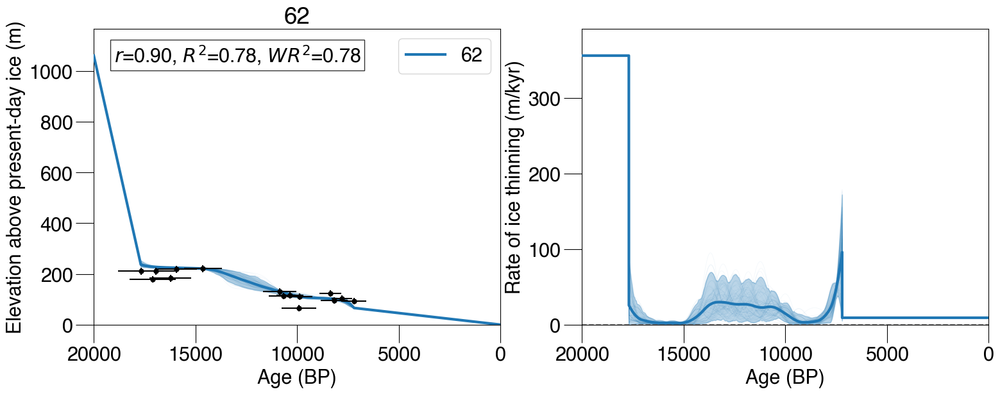

=== Running site 63 with test C3a ===
1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71 72 75 76 78 79 80 81 82 83 84 85 86 87 88 89 90 91 92 93 94 95 96 97 98 99 100 101 102 103 104 105 106 107 108 109 110 111 112 113 114 116 117 118 119 120 121 122 123 124 125 126 127 128 129 130 131 132 133 134 135 136 137 142 143 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161 162 163 164 165 166 167 168 169 concordant,concordant,concordant,1,1,1,1,1,concordant,concordant,concordant,concordant,concordant,Be,concordant,concordant,concordant,1,1,concordant,concordant,1,concordant,concordant,concordant,1,1,Be,concordant,concordant,Be,concordant,1,1,concordant,concordant,concordant,concordant,concordant,1,1,1,concordant,concordant,1,concordant,1,concordant,1,1,concordant,1,concordant,1,1,1,concordant,concordant,1,concordant,concor

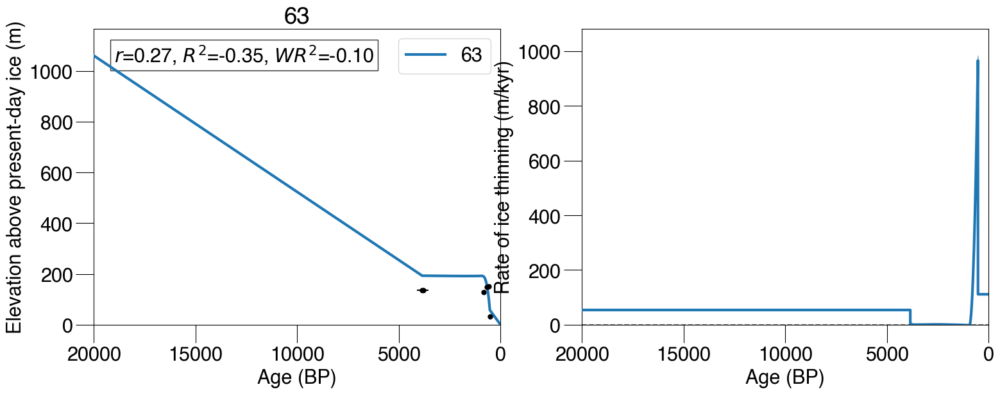

=== Running site 64 with test C11 ===
1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71 72 75 76 78 79 80 81 82 83 84 85 86 87 88 89 90 91 92 93 94 95 96 97 98 99 100 101 102 103 104 105 106 107 108 109 110 111 112 113 114 116 117 118 119 120 121 122 123 124 125 126 127 128 129 130 131 132 133 134 135 136 137 142 143 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161 162 163 164 165 166 167 168 169 concordant,concordant,concordant,1,1,1,1,1,concordant,concordant,concordant,concordant,concordant,Be,concordant,concordant,concordant,1,1,concordant,concordant,1,concordant,concordant,concordant,1,1,Be,concordant,concordant,Be,concordant,1,1,concordant,concordant,concordant,concordant,concordant,1,1,1,concordant,concordant,1,concordant,1,concordant,1,1,concordant,1,concordant,1,1,1,concordant,concordant,1,concordant,concor

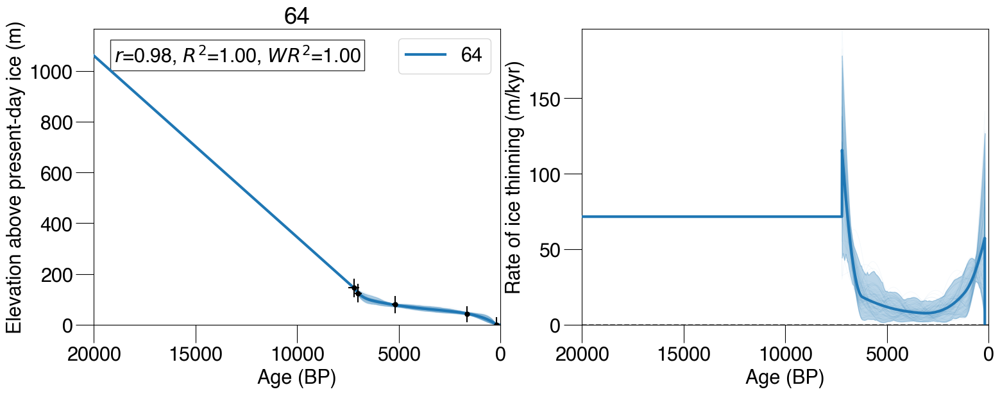

=== Running site 66 with test C3a ===
1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71 72 75 76 78 79 80 81 82 83 84 85 86 87 88 89 90 91 92 93 94 95 96 97 98 99 100 101 102 103 104 105 106 107 108 109 110 111 112 113 114 116 117 118 119 120 121 122 123 124 125 126 127 128 129 130 131 132 133 134 135 136 137 142 143 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161 162 163 164 165 166 167 168 169 concordant,concordant,concordant,1,1,1,1,1,concordant,concordant,concordant,concordant,concordant,Be,concordant,concordant,concordant,1,1,concordant,concordant,1,concordant,concordant,concordant,1,1,Be,concordant,concordant,Be,concordant,1,1,concordant,concordant,concordant,concordant,concordant,1,1,1,concordant,concordant,1,concordant,1,concordant,1,1,concordant,1,concordant,1,1,1,concordant,concordant,1,concordant,concor

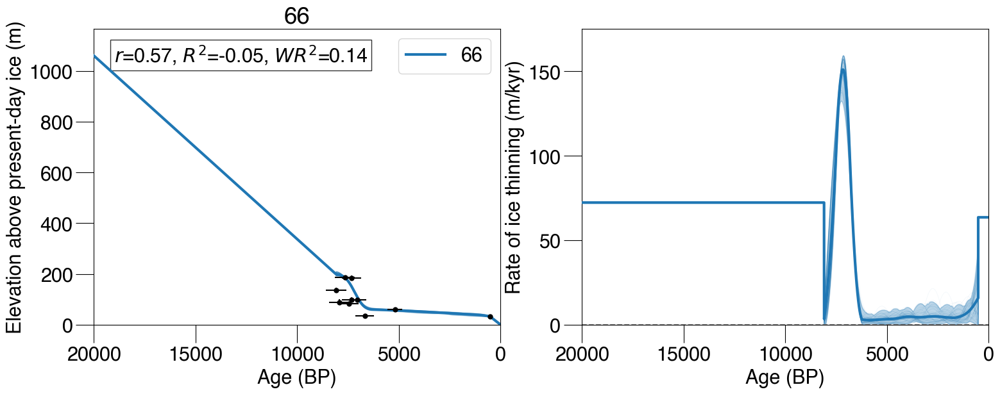

=== Running site 67 with test C3a ===
1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71 72 75 76 78 79 80 81 82 83 84 85 86 87 88 89 90 91 92 93 94 95 96 97 98 99 100 101 102 103 104 105 106 107 108 109 110 111 112 113 114 116 117 118 119 120 121 122 123 124 125 126 127 128 129 130 131 132 133 134 135 136 137 142 143 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161 162 163 164 165 166 167 168 169 concordant,concordant,concordant,1,1,1,1,1,concordant,concordant,concordant,concordant,concordant,Be,concordant,concordant,concordant,1,1,concordant,concordant,1,concordant,concordant,concordant,1,1,Be,concordant,concordant,Be,concordant,1,1,concordant,concordant,concordant,concordant,concordant,1,1,1,concordant,concordant,1,concordant,1,concordant,1,1,concordant,1,concordant,1,1,1,concordant,concordant,1,concordant,concor

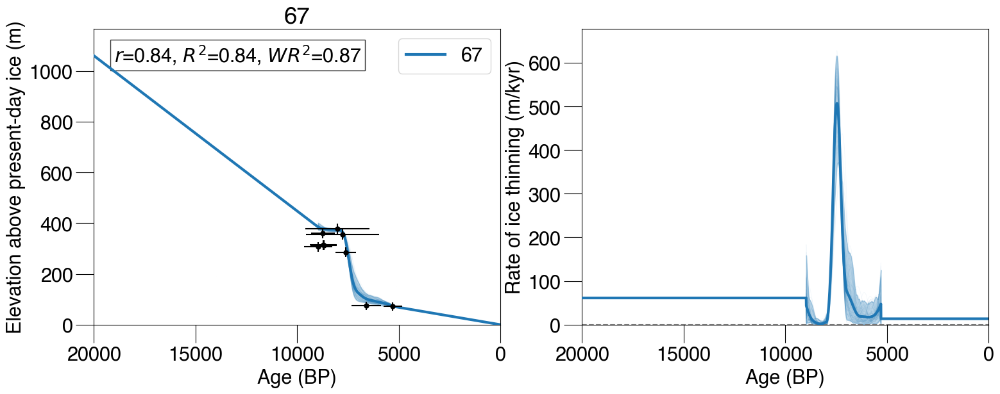

=== Running site 68 with test C5a ===
1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71 72 75 76 78 79 80 81 82 83 84 85 86 87 88 89 90 91 92 93 94 95 96 97 98 99 100 101 102 103 104 105 106 107 108 109 110 111 112 113 114 116 117 118 119 120 121 122 123 124 125 126 127 128 129 130 131 132 133 134 135 136 137 142 143 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161 162 163 164 165 166 167 168 169 concordant,concordant,concordant,1,1,1,1,1,concordant,concordant,concordant,concordant,concordant,Be,concordant,concordant,concordant,1,1,concordant,concordant,1,concordant,concordant,concordant,1,1,Be,concordant,concordant,Be,concordant,1,1,concordant,concordant,concordant,concordant,concordant,1,1,1,concordant,concordant,1,concordant,1,concordant,1,1,concordant,1,concordant,1,1,1,concordant,concordant,1,concordant,concor

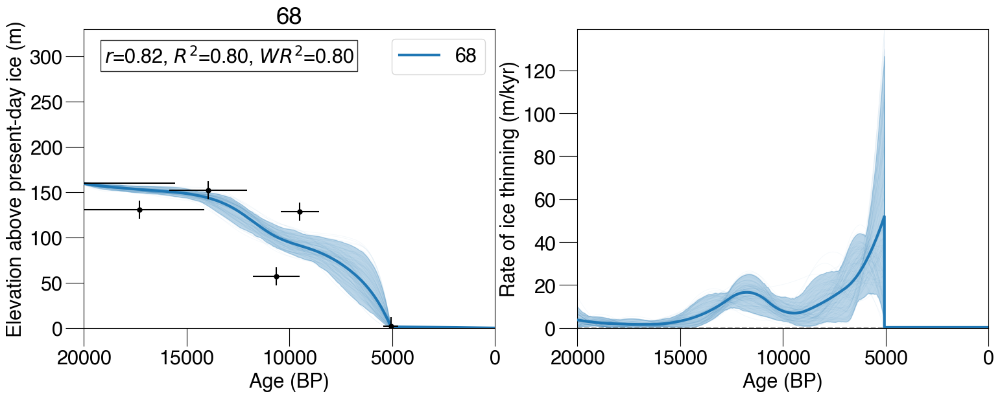

=== Running site 70 with test C3a ===
1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71 72 75 76 78 79 80 81 82 83 84 85 86 87 88 89 90 91 92 93 94 95 96 97 98 99 100 101 102 103 104 105 106 107 108 109 110 111 112 113 114 116 117 118 119 120 121 122 123 124 125 126 127 128 129 130 131 132 133 134 135 136 137 142 143 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161 162 163 164 165 166 167 168 169 concordant,concordant,concordant,1,1,1,1,1,concordant,concordant,concordant,concordant,concordant,Be,concordant,concordant,concordant,1,1,concordant,concordant,1,concordant,concordant,concordant,1,1,Be,concordant,concordant,Be,concordant,1,1,concordant,concordant,concordant,concordant,concordant,1,1,1,concordant,concordant,1,concordant,1,concordant,1,1,concordant,1,concordant,1,1,1,concordant,concordant,1,concordant,concor

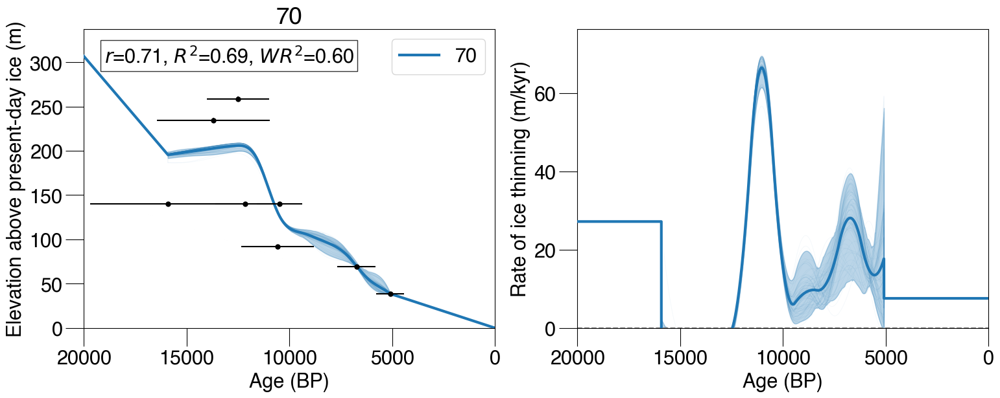

=== Running site 85 with test C4a ===
1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71 72 75 76 78 79 80 81 82 83 84 85 86 87 88 89 90 91 92 93 94 95 96 97 98 99 100 101 102 103 104 105 106 107 108 109 110 111 112 113 114 116 117 118 119 120 121 122 123 124 125 126 127 128 129 130 131 132 133 134 135 136 137 142 143 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161 162 163 164 165 166 167 168 169 concordant,concordant,concordant,1,1,1,1,1,concordant,concordant,concordant,concordant,concordant,Be,concordant,concordant,concordant,1,1,concordant,concordant,1,concordant,concordant,concordant,1,1,Be,concordant,concordant,Be,concordant,1,1,concordant,concordant,concordant,concordant,concordant,1,1,1,concordant,concordant,1,concordant,1,concordant,1,1,concordant,1,concordant,1,1,1,concordant,concordant,1,concordant,concor

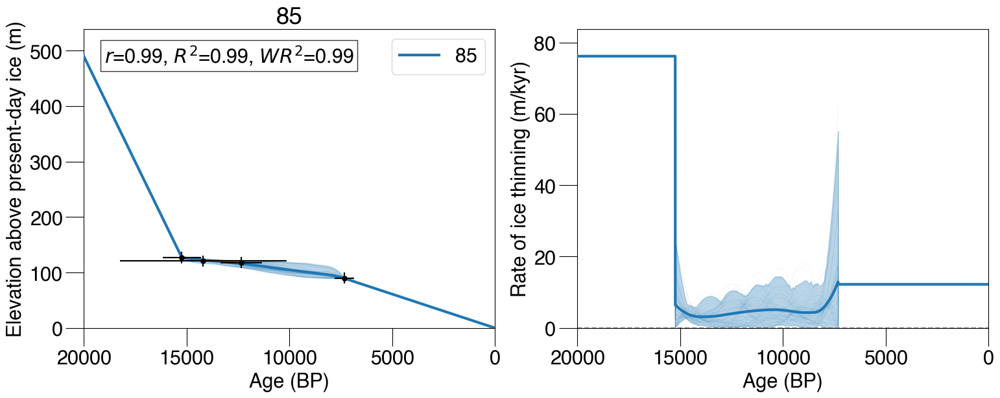

=== Running site 87 with test C3a ===
1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71 72 75 76 78 79 80 81 82 83 84 85 86 87 88 89 90 91 92 93 94 95 96 97 98 99 100 101 102 103 104 105 106 107 108 109 110 111 112 113 114 116 117 118 119 120 121 122 123 124 125 126 127 128 129 130 131 132 133 134 135 136 137 142 143 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161 162 163 164 165 166 167 168 169 concordant,concordant,concordant,1,1,1,1,1,concordant,concordant,concordant,concordant,concordant,Be,concordant,concordant,concordant,1,1,concordant,concordant,1,concordant,concordant,concordant,1,1,Be,concordant,concordant,Be,concordant,1,1,concordant,concordant,concordant,concordant,concordant,1,1,1,concordant,concordant,1,concordant,1,concordant,1,1,concordant,1,concordant,1,1,1,concordant,concordant,1,concordant,concor

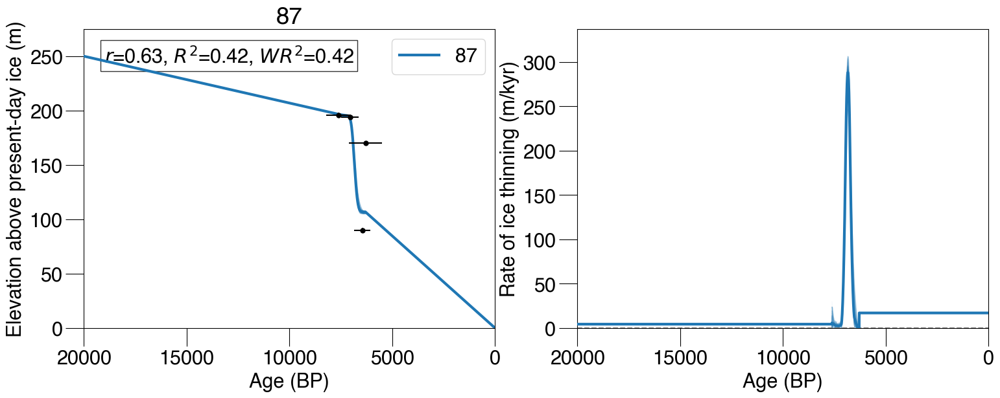

=== Running site 88 with test C6a ===
1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71 72 75 76 78 79 80 81 82 83 84 85 86 87 88 89 90 91 92 93 94 95 96 97 98 99 100 101 102 103 104 105 106 107 108 109 110 111 112 113 114 116 117 118 119 120 121 122 123 124 125 126 127 128 129 130 131 132 133 134 135 136 137 142 143 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161 162 163 164 165 166 167 168 169 concordant,concordant,concordant,1,1,1,1,1,concordant,concordant,concordant,concordant,concordant,Be,concordant,concordant,concordant,1,1,concordant,concordant,1,concordant,concordant,concordant,1,1,Be,concordant,concordant,Be,concordant,1,1,concordant,concordant,concordant,concordant,concordant,1,1,1,concordant,concordant,1,concordant,1,concordant,1,1,concordant,1,concordant,1,1,1,concordant,concordant,1,concordant,concor

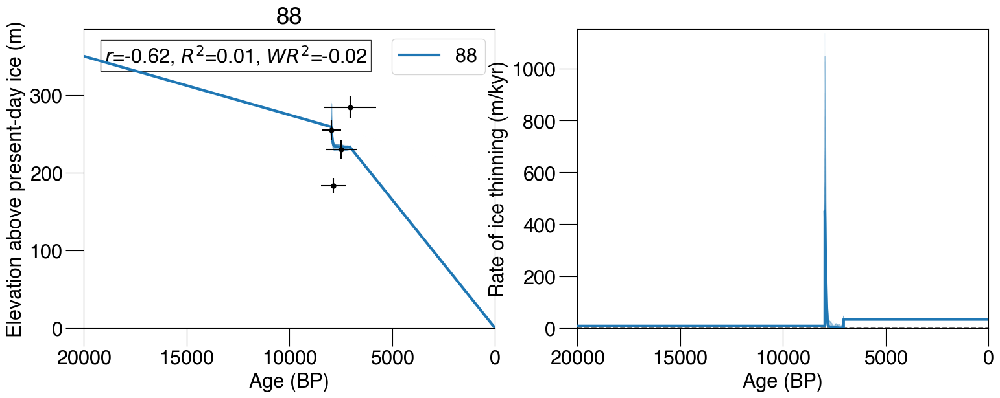

=== Running site 90 with test C3a ===
1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71 72 75 76 78 79 80 81 82 83 84 85 86 87 88 89 90 91 92 93 94 95 96 97 98 99 100 101 102 103 104 105 106 107 108 109 110 111 112 113 114 116 117 118 119 120 121 122 123 124 125 126 127 128 129 130 131 132 133 134 135 136 137 142 143 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161 162 163 164 165 166 167 168 169 concordant,concordant,concordant,1,1,1,1,1,concordant,concordant,concordant,concordant,concordant,Be,concordant,concordant,concordant,1,1,concordant,concordant,1,concordant,concordant,concordant,1,1,Be,concordant,concordant,Be,concordant,1,1,concordant,concordant,concordant,concordant,concordant,1,1,1,concordant,concordant,1,concordant,1,concordant,1,1,concordant,1,concordant,1,1,1,concordant,concordant,1,concordant,concor

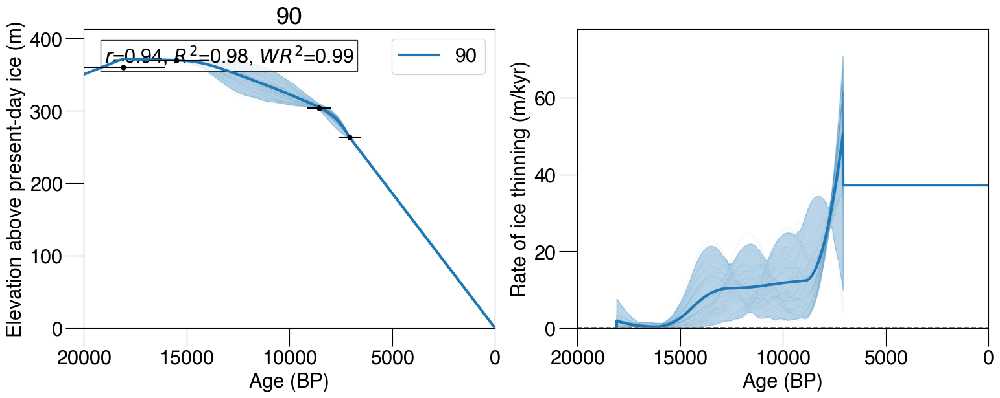

=== Running site 91 with test C3b ===
1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71 72 75 76 78 79 80 81 82 83 84 85 86 87 88 89 90 91 92 93 94 95 96 97 98 99 100 101 102 103 104 105 106 107 108 109 110 111 112 113 114 116 117 118 119 120 121 122 123 124 125 126 127 128 129 130 131 132 133 134 135 136 137 142 143 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161 162 163 164 165 166 167 168 169 concordant,concordant,concordant,1,1,1,1,1,concordant,concordant,concordant,concordant,concordant,Be,concordant,concordant,concordant,1,1,concordant,concordant,1,concordant,concordant,concordant,1,1,Be,concordant,concordant,Be,concordant,1,1,concordant,concordant,concordant,concordant,concordant,1,1,1,concordant,concordant,1,concordant,1,concordant,1,1,concordant,1,concordant,1,1,1,concordant,concordant,1,concordant,concor

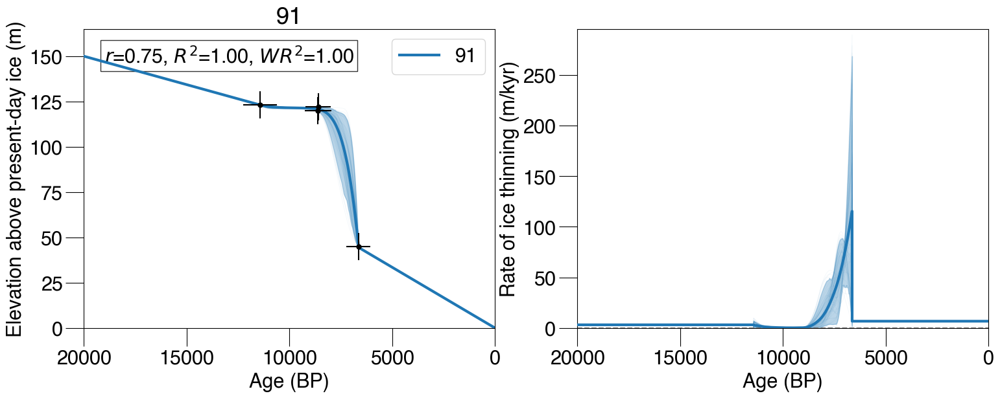

=== Running site 95 with test C8a ===
1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71 72 75 76 78 79 80 81 82 83 84 85 86 87 88 89 90 91 92 93 94 95 96 97 98 99 100 101 102 103 104 105 106 107 108 109 110 111 112 113 114 116 117 118 119 120 121 122 123 124 125 126 127 128 129 130 131 132 133 134 135 136 137 142 143 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161 162 163 164 165 166 167 168 169 concordant,concordant,concordant,1,1,1,1,1,concordant,concordant,concordant,concordant,concordant,Be,concordant,concordant,concordant,1,1,concordant,concordant,1,concordant,concordant,concordant,1,1,Be,concordant,concordant,Be,concordant,1,1,concordant,concordant,concordant,concordant,concordant,1,1,1,concordant,concordant,1,concordant,1,concordant,1,1,concordant,1,concordant,1,1,1,concordant,concordant,1,concordant,concor

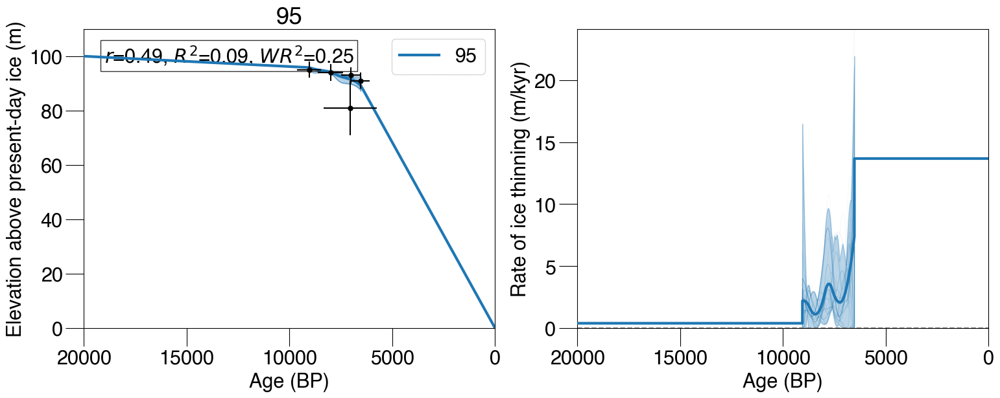

=== Running site 97 with test C3a ===
1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71 72 75 76 78 79 80 81 82 83 84 85 86 87 88 89 90 91 92 93 94 95 96 97 98 99 100 101 102 103 104 105 106 107 108 109 110 111 112 113 114 116 117 118 119 120 121 122 123 124 125 126 127 128 129 130 131 132 133 134 135 136 137 142 143 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161 162 163 164 165 166 167 168 169 concordant,concordant,concordant,1,1,1,1,1,concordant,concordant,concordant,concordant,concordant,Be,concordant,concordant,concordant,1,1,concordant,concordant,1,concordant,concordant,concordant,1,1,Be,concordant,concordant,Be,concordant,1,1,concordant,concordant,concordant,concordant,concordant,1,1,1,concordant,concordant,1,concordant,1,concordant,1,1,concordant,1,concordant,1,1,1,concordant,concordant,1,concordant,concor

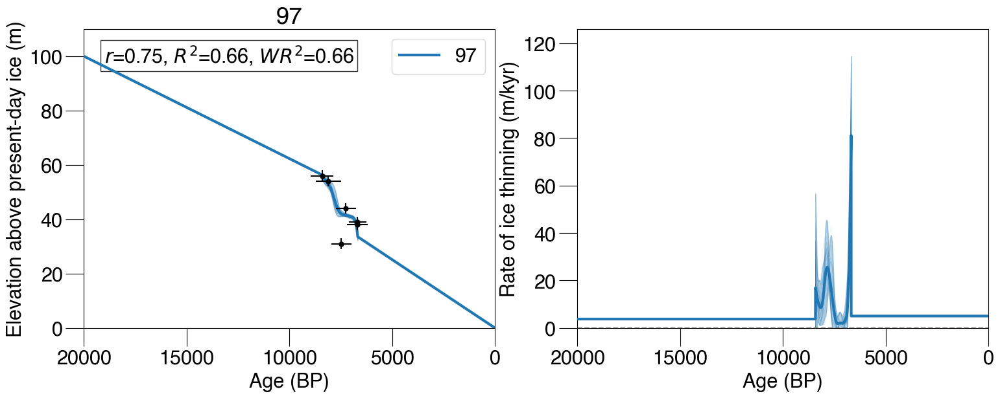

=== Running site 111 with test C5a ===
1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71 72 75 76 78 79 80 81 82 83 84 85 86 87 88 89 90 91 92 93 94 95 96 97 98 99 100 101 102 103 104 105 106 107 108 109 110 111 112 113 114 116 117 118 119 120 121 122 123 124 125 126 127 128 129 130 131 132 133 134 135 136 137 142 143 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161 162 163 164 165 166 167 168 169 concordant,concordant,concordant,1,1,1,1,1,concordant,concordant,concordant,concordant,concordant,Be,concordant,concordant,concordant,1,1,concordant,concordant,1,concordant,concordant,concordant,1,1,Be,concordant,concordant,Be,concordant,1,1,concordant,concordant,concordant,concordant,concordant,1,1,1,concordant,concordant,1,concordant,1,concordant,1,1,concordant,1,concordant,1,1,1,concordant,concordant,1,concordant,conco

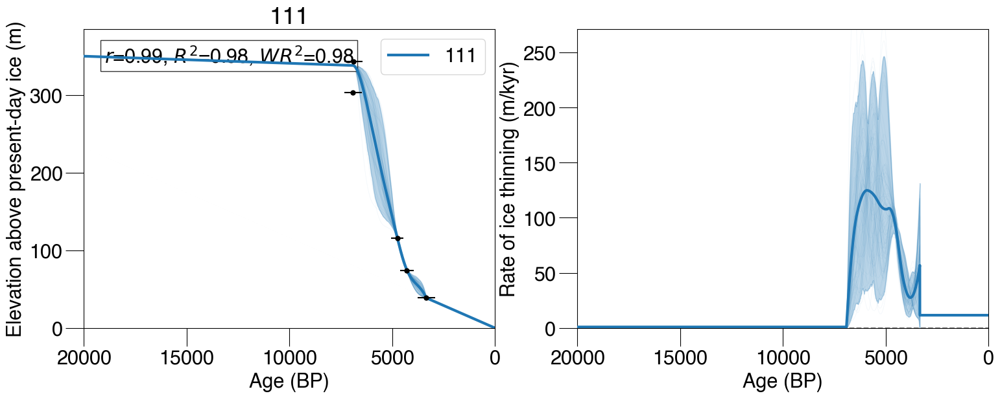

=== Running site 103 with test C3a ===
1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71 72 75 76 78 79 80 81 82 83 84 85 86 87 88 89 90 91 92 93 94 95 96 97 98 99 100 101 102 103 104 105 106 107 108 109 110 111 112 113 114 116 117 118 119 120 121 122 123 124 125 126 127 128 129 130 131 132 133 134 135 136 137 142 143 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161 162 163 164 165 166 167 168 169 concordant,concordant,concordant,1,1,1,1,1,concordant,concordant,concordant,concordant,concordant,Be,concordant,concordant,concordant,1,1,concordant,concordant,1,concordant,concordant,concordant,1,1,Be,concordant,concordant,Be,concordant,1,1,concordant,concordant,concordant,concordant,concordant,1,1,1,concordant,concordant,1,concordant,1,concordant,1,1,concordant,1,concordant,1,1,1,concordant,concordant,1,concordant,conco

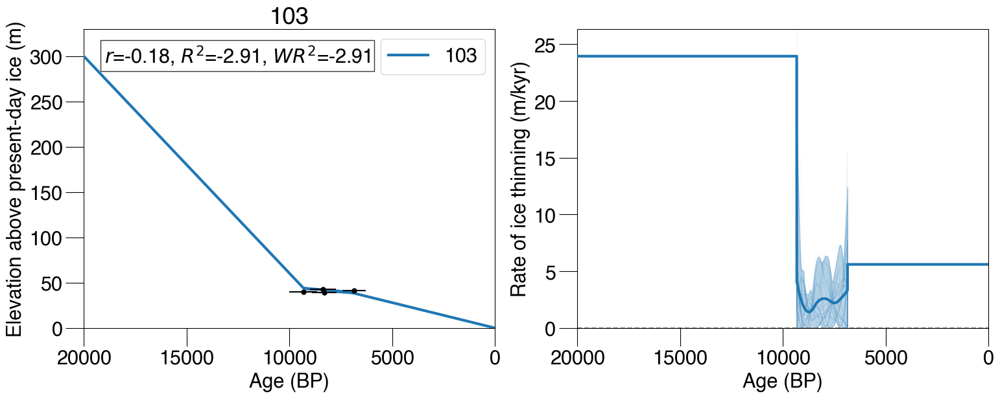

=== Running site 114 with test C7a ===
1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71 72 75 76 78 79 80 81 82 83 84 85 86 87 88 89 90 91 92 93 94 95 96 97 98 99 100 101 102 103 104 105 106 107 108 109 110 111 112 113 114 116 117 118 119 120 121 122 123 124 125 126 127 128 129 130 131 132 133 134 135 136 137 142 143 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161 162 163 164 165 166 167 168 169 concordant,concordant,concordant,1,1,1,1,1,concordant,concordant,concordant,concordant,concordant,Be,concordant,concordant,concordant,1,1,concordant,concordant,1,concordant,concordant,concordant,1,1,Be,concordant,concordant,Be,concordant,1,1,concordant,concordant,concordant,concordant,concordant,1,1,1,concordant,concordant,1,concordant,1,concordant,1,1,concordant,1,concordant,1,1,1,concordant,concordant,1,concordant,conco

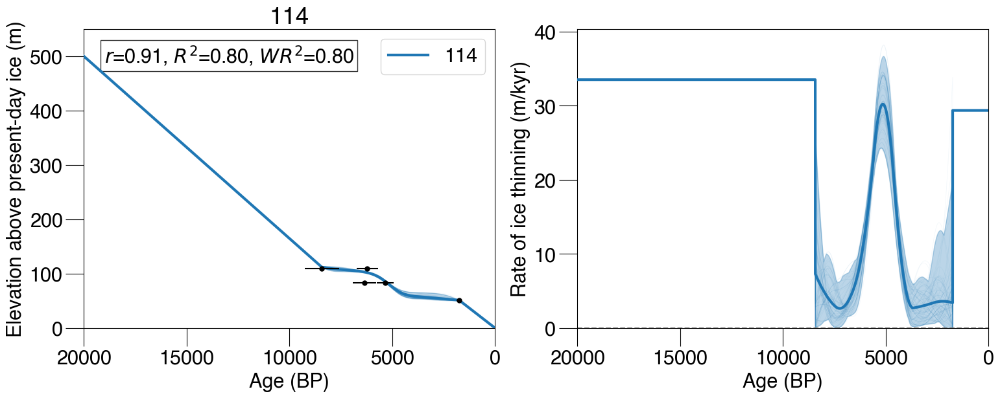

=== Running site 105 with test C3a ===
1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71 72 75 76 78 79 80 81 82 83 84 85 86 87 88 89 90 91 92 93 94 95 96 97 98 99 100 101 102 103 104 105 106 107 108 109 110 111 112 113 114 116 117 118 119 120 121 122 123 124 125 126 127 128 129 130 131 132 133 134 135 136 137 142 143 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161 162 163 164 165 166 167 168 169 concordant,concordant,concordant,1,1,1,1,1,concordant,concordant,concordant,concordant,concordant,Be,concordant,concordant,concordant,1,1,concordant,concordant,1,concordant,concordant,concordant,1,1,Be,concordant,concordant,Be,concordant,1,1,concordant,concordant,concordant,concordant,concordant,1,1,1,concordant,concordant,1,concordant,1,concordant,1,1,concordant,1,concordant,1,1,1,concordant,concordant,1,concordant,conco

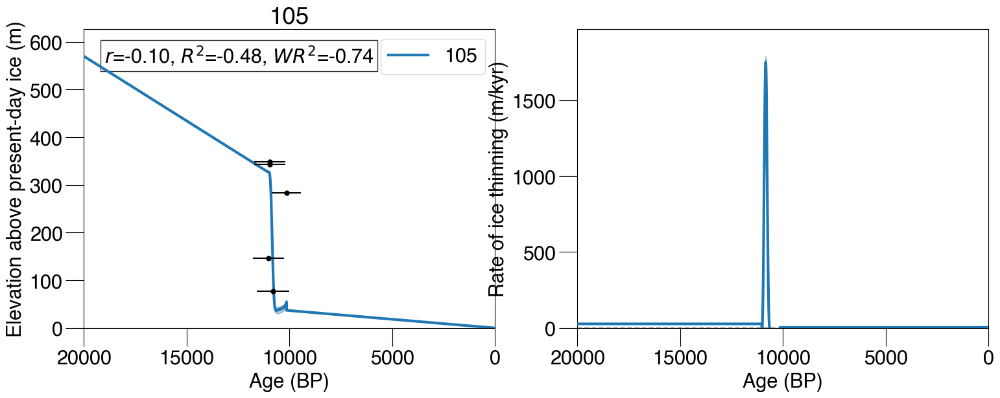

=== Running site 116 with test C3a ===
1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71 72 75 76 78 79 80 81 82 83 84 85 86 87 88 89 90 91 92 93 94 95 96 97 98 99 100 101 102 103 104 105 106 107 108 109 110 111 112 113 114 116 117 118 119 120 121 122 123 124 125 126 127 128 129 130 131 132 133 134 135 136 137 142 143 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161 162 163 164 165 166 167 168 169 concordant,concordant,concordant,1,1,1,1,1,concordant,concordant,concordant,concordant,concordant,Be,concordant,concordant,concordant,1,1,concordant,concordant,1,concordant,concordant,concordant,1,1,Be,concordant,concordant,Be,concordant,1,1,concordant,concordant,concordant,concordant,concordant,1,1,1,concordant,concordant,1,concordant,1,concordant,1,1,concordant,1,concordant,1,1,1,concordant,concordant,1,concordant,conco

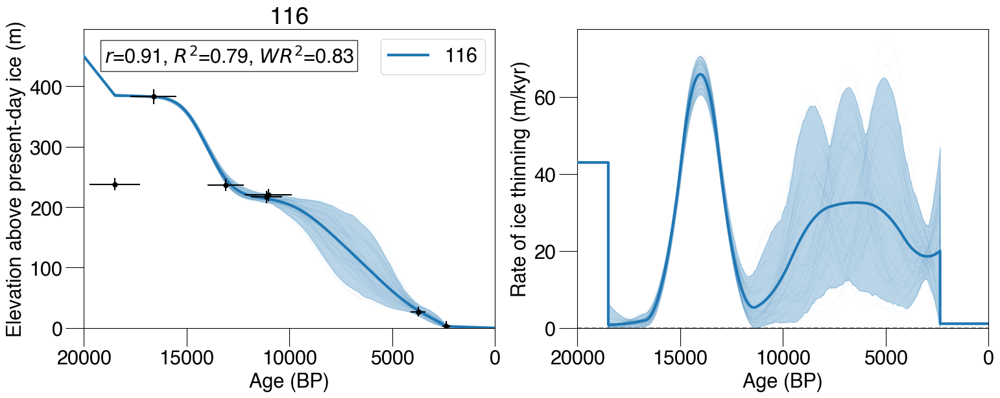

=== Running site 144 with test C4b ===
1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71 72 75 76 78 79 80 81 82 83 84 85 86 87 88 89 90 91 92 93 94 95 96 97 98 99 100 101 102 103 104 105 106 107 108 109 110 111 112 113 114 116 117 118 119 120 121 122 123 124 125 126 127 128 129 130 131 132 133 134 135 136 137 142 143 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161 162 163 164 165 166 167 168 169 concordant,concordant,concordant,1,1,1,1,1,concordant,concordant,concordant,concordant,concordant,Be,concordant,concordant,concordant,1,1,concordant,concordant,1,concordant,concordant,concordant,1,1,Be,concordant,concordant,Be,concordant,1,1,concordant,concordant,concordant,concordant,concordant,1,1,1,concordant,concordant,1,concordant,1,concordant,1,1,concordant,1,concordant,1,1,1,concordant,concordant,1,concordant,conco

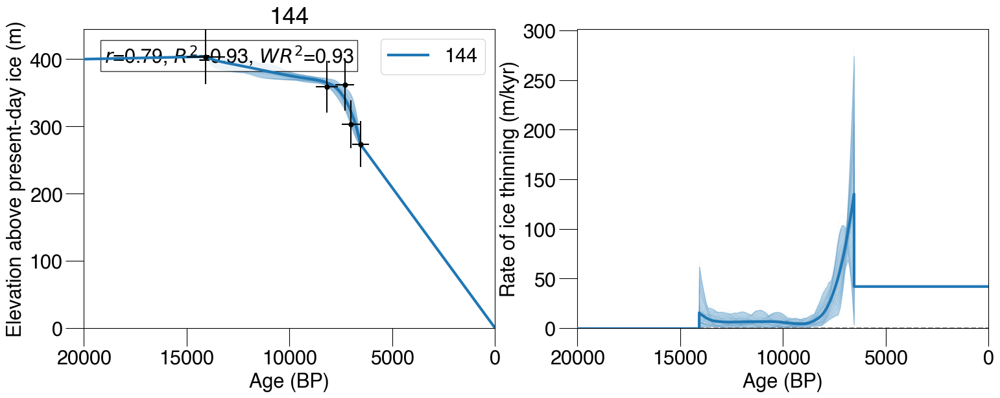

=== Running site 121 with test C3a ===
1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71 72 75 76 78 79 80 81 82 83 84 85 86 87 88 89 90 91 92 93 94 95 96 97 98 99 100 101 102 103 104 105 106 107 108 109 110 111 112 113 114 116 117 118 119 120 121 122 123 124 125 126 127 128 129 130 131 132 133 134 135 136 137 142 143 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161 162 163 164 165 166 167 168 169 concordant,concordant,concordant,1,1,1,1,1,concordant,concordant,concordant,concordant,concordant,Be,concordant,concordant,concordant,1,1,concordant,concordant,1,concordant,concordant,concordant,1,1,Be,concordant,concordant,Be,concordant,1,1,concordant,concordant,concordant,concordant,concordant,1,1,1,concordant,concordant,1,concordant,1,concordant,1,1,concordant,1,concordant,1,1,1,concordant,concordant,1,concordant,conco

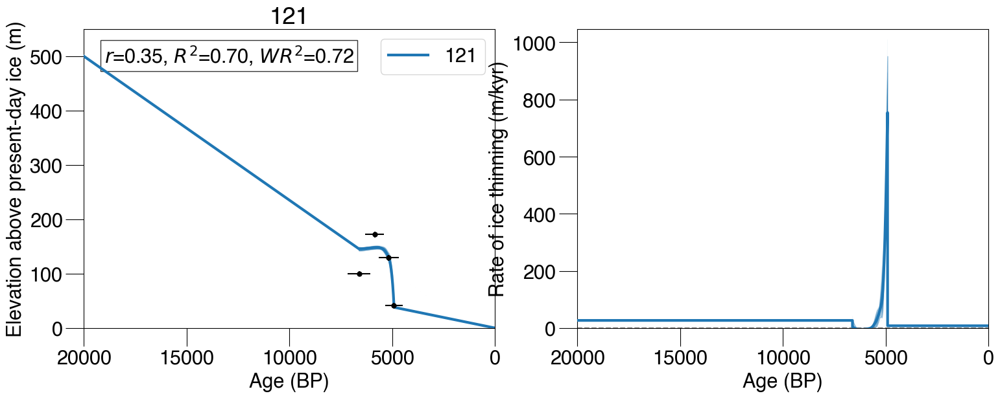

=== Running site 122 with test C3a ===
1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71 72 75 76 78 79 80 81 82 83 84 85 86 87 88 89 90 91 92 93 94 95 96 97 98 99 100 101 102 103 104 105 106 107 108 109 110 111 112 113 114 116 117 118 119 120 121 122 123 124 125 126 127 128 129 130 131 132 133 134 135 136 137 142 143 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161 162 163 164 165 166 167 168 169 concordant,concordant,concordant,1,1,1,1,1,concordant,concordant,concordant,concordant,concordant,Be,concordant,concordant,concordant,1,1,concordant,concordant,1,concordant,concordant,concordant,1,1,Be,concordant,concordant,Be,concordant,1,1,concordant,concordant,concordant,concordant,concordant,1,1,1,concordant,concordant,1,concordant,1,concordant,1,1,concordant,1,concordant,1,1,1,concordant,concordant,1,concordant,conco

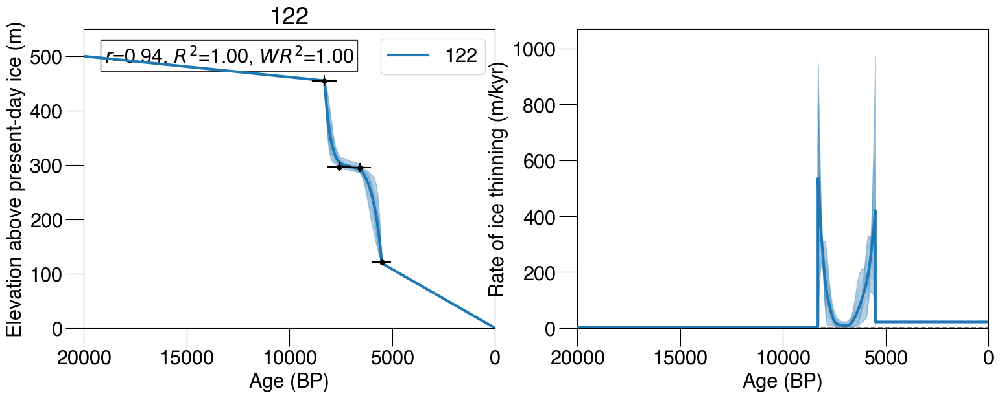

=== Running site 123 with test C3a ===
1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71 72 75 76 78 79 80 81 82 83 84 85 86 87 88 89 90 91 92 93 94 95 96 97 98 99 100 101 102 103 104 105 106 107 108 109 110 111 112 113 114 116 117 118 119 120 121 122 123 124 125 126 127 128 129 130 131 132 133 134 135 136 137 142 143 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161 162 163 164 165 166 167 168 169 concordant,concordant,concordant,1,1,1,1,1,concordant,concordant,concordant,concordant,concordant,Be,concordant,concordant,concordant,1,1,concordant,concordant,1,concordant,concordant,concordant,1,1,Be,concordant,concordant,Be,concordant,1,1,concordant,concordant,concordant,concordant,concordant,1,1,1,concordant,concordant,1,concordant,1,concordant,1,1,concordant,1,concordant,1,1,1,concordant,concordant,1,concordant,conco

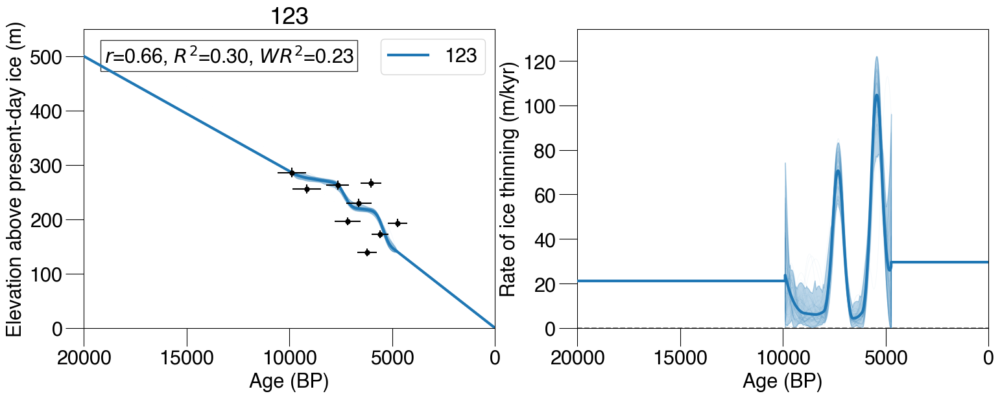

=== Running site 142 with test C3a ===
1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71 72 75 76 78 79 80 81 82 83 84 85 86 87 88 89 90 91 92 93 94 95 96 97 98 99 100 101 102 103 104 105 106 107 108 109 110 111 112 113 114 116 117 118 119 120 121 122 123 124 125 126 127 128 129 130 131 132 133 134 135 136 137 142 143 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161 162 163 164 165 166 167 168 169 concordant,concordant,concordant,1,1,1,1,1,concordant,concordant,concordant,concordant,concordant,Be,concordant,concordant,concordant,1,1,concordant,concordant,1,concordant,concordant,concordant,1,1,Be,concordant,concordant,Be,concordant,1,1,concordant,concordant,concordant,concordant,concordant,1,1,1,concordant,concordant,1,concordant,1,concordant,1,1,concordant,1,concordant,1,1,1,concordant,concordant,1,concordant,conco

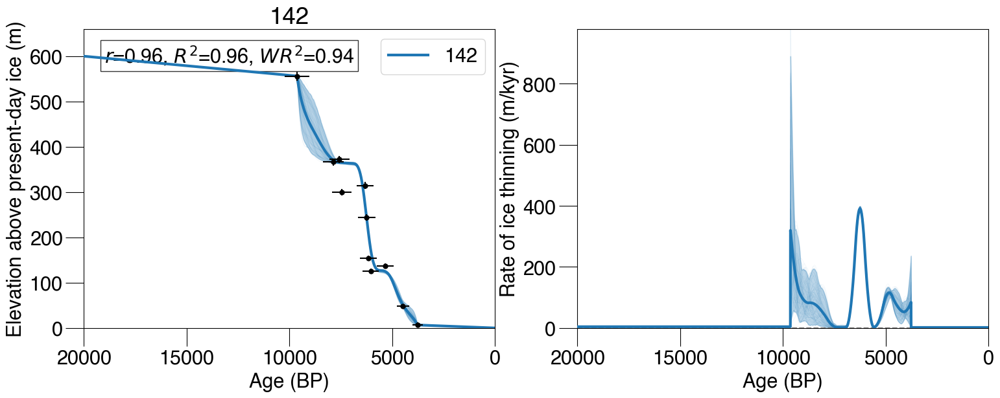

=== Running site 124 with test C7a ===
1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71 72 75 76 78 79 80 81 82 83 84 85 86 87 88 89 90 91 92 93 94 95 96 97 98 99 100 101 102 103 104 105 106 107 108 109 110 111 112 113 114 116 117 118 119 120 121 122 123 124 125 126 127 128 129 130 131 132 133 134 135 136 137 142 143 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161 162 163 164 165 166 167 168 169 concordant,concordant,concordant,1,1,1,1,1,concordant,concordant,concordant,concordant,concordant,Be,concordant,concordant,concordant,1,1,concordant,concordant,1,concordant,concordant,concordant,1,1,Be,concordant,concordant,Be,concordant,1,1,concordant,concordant,concordant,concordant,concordant,1,1,1,concordant,concordant,1,concordant,1,concordant,1,1,concordant,1,concordant,1,1,1,concordant,concordant,1,concordant,conco

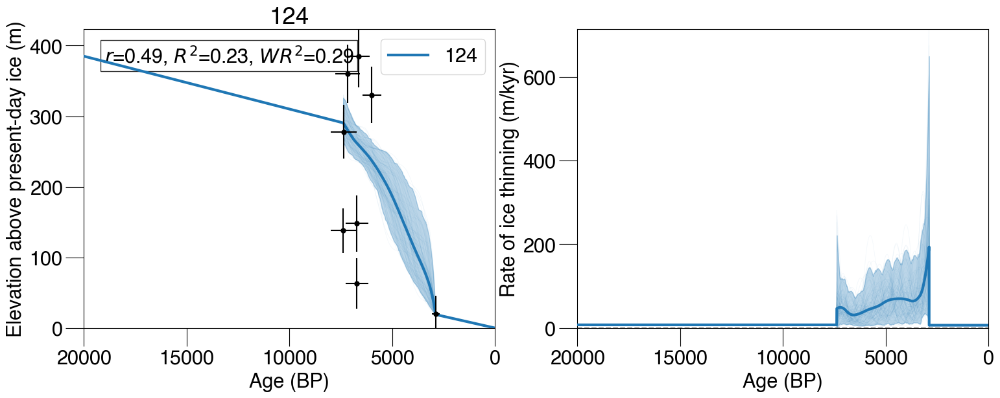

=== Running site 125 with test C3a ===
1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71 72 75 76 78 79 80 81 82 83 84 85 86 87 88 89 90 91 92 93 94 95 96 97 98 99 100 101 102 103 104 105 106 107 108 109 110 111 112 113 114 116 117 118 119 120 121 122 123 124 125 126 127 128 129 130 131 132 133 134 135 136 137 142 143 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161 162 163 164 165 166 167 168 169 concordant,concordant,concordant,1,1,1,1,1,concordant,concordant,concordant,concordant,concordant,Be,concordant,concordant,concordant,1,1,concordant,concordant,1,concordant,concordant,concordant,1,1,Be,concordant,concordant,Be,concordant,1,1,concordant,concordant,concordant,concordant,concordant,1,1,1,concordant,concordant,1,concordant,1,concordant,1,1,concordant,1,concordant,1,1,1,concordant,concordant,1,concordant,conco

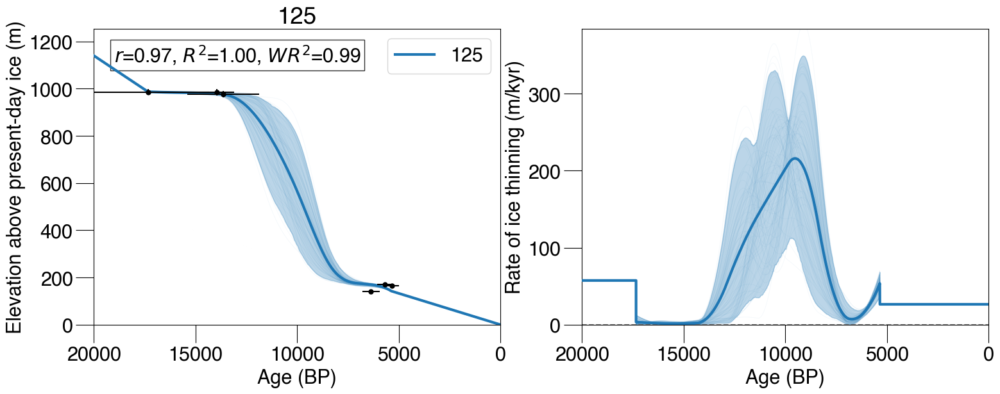

=== Running site 128 with test C3a ===
1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71 72 75 76 78 79 80 81 82 83 84 85 86 87 88 89 90 91 92 93 94 95 96 97 98 99 100 101 102 103 104 105 106 107 108 109 110 111 112 113 114 116 117 118 119 120 121 122 123 124 125 126 127 128 129 130 131 132 133 134 135 136 137 142 143 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161 162 163 164 165 166 167 168 169 concordant,concordant,concordant,1,1,1,1,1,concordant,concordant,concordant,concordant,concordant,Be,concordant,concordant,concordant,1,1,concordant,concordant,1,concordant,concordant,concordant,1,1,Be,concordant,concordant,Be,concordant,1,1,concordant,concordant,concordant,concordant,concordant,1,1,1,concordant,concordant,1,concordant,1,concordant,1,1,concordant,1,concordant,1,1,1,concordant,concordant,1,concordant,conco

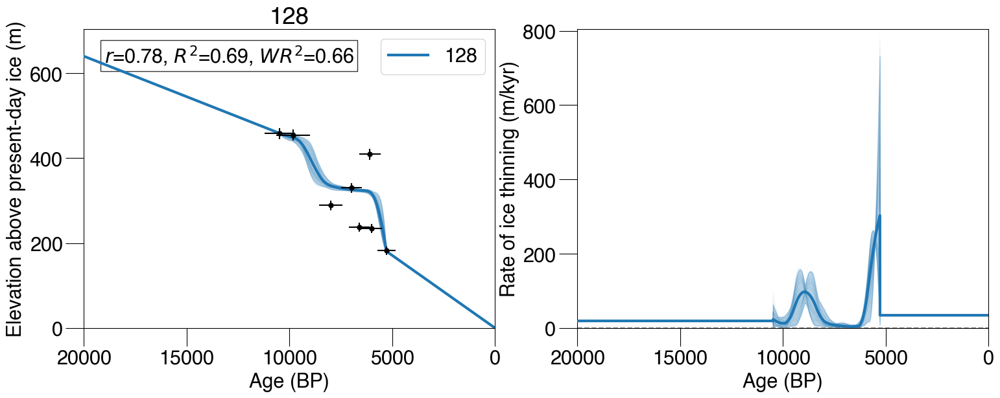

=== Running site 129 with test C3a ===
1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71 72 75 76 78 79 80 81 82 83 84 85 86 87 88 89 90 91 92 93 94 95 96 97 98 99 100 101 102 103 104 105 106 107 108 109 110 111 112 113 114 116 117 118 119 120 121 122 123 124 125 126 127 128 129 130 131 132 133 134 135 136 137 142 143 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161 162 163 164 165 166 167 168 169 concordant,concordant,concordant,1,1,1,1,1,concordant,concordant,concordant,concordant,concordant,Be,concordant,concordant,concordant,1,1,concordant,concordant,1,concordant,concordant,concordant,1,1,Be,concordant,concordant,Be,concordant,1,1,concordant,concordant,concordant,concordant,concordant,1,1,1,concordant,concordant,1,concordant,1,concordant,1,1,concordant,1,concordant,1,1,1,concordant,concordant,1,concordant,conco

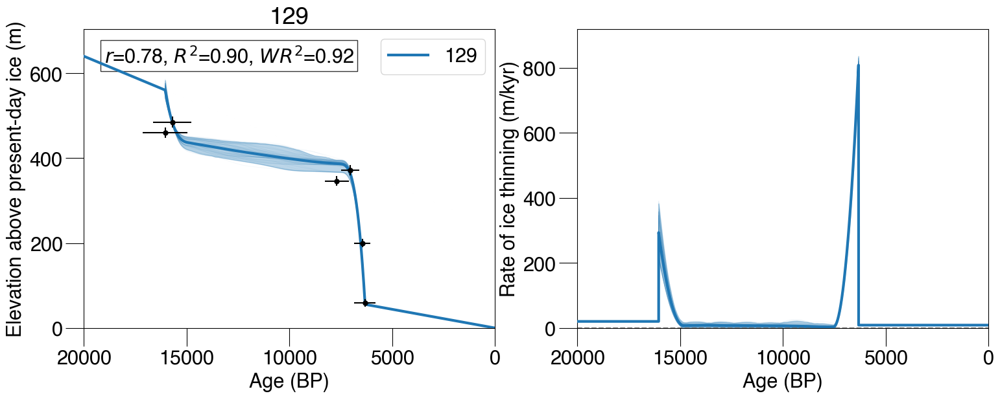

=== Running site 135 with test C3a ===
1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71 72 75 76 78 79 80 81 82 83 84 85 86 87 88 89 90 91 92 93 94 95 96 97 98 99 100 101 102 103 104 105 106 107 108 109 110 111 112 113 114 116 117 118 119 120 121 122 123 124 125 126 127 128 129 130 131 132 133 134 135 136 137 142 143 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161 162 163 164 165 166 167 168 169 concordant,concordant,concordant,1,1,1,1,1,concordant,concordant,concordant,concordant,concordant,Be,concordant,concordant,concordant,1,1,concordant,concordant,1,concordant,concordant,concordant,1,1,Be,concordant,concordant,Be,concordant,1,1,concordant,concordant,concordant,concordant,concordant,1,1,1,concordant,concordant,1,concordant,1,concordant,1,1,concordant,1,concordant,1,1,1,concordant,concordant,1,concordant,conco

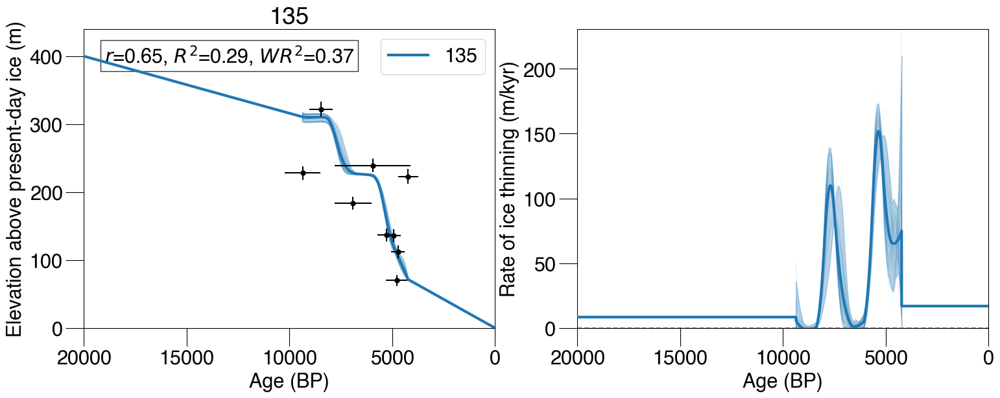

=== Running site 145 with test C3a ===
1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71 72 75 76 78 79 80 81 82 83 84 85 86 87 88 89 90 91 92 93 94 95 96 97 98 99 100 101 102 103 104 105 106 107 108 109 110 111 112 113 114 116 117 118 119 120 121 122 123 124 125 126 127 128 129 130 131 132 133 134 135 136 137 142 143 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161 162 163 164 165 166 167 168 169 concordant,concordant,concordant,1,1,1,1,1,concordant,concordant,concordant,concordant,concordant,Be,concordant,concordant,concordant,1,1,concordant,concordant,1,concordant,concordant,concordant,1,1,Be,concordant,concordant,Be,concordant,1,1,concordant,concordant,concordant,concordant,concordant,1,1,1,concordant,concordant,1,concordant,1,concordant,1,1,concordant,1,concordant,1,1,1,concordant,concordant,1,concordant,conco

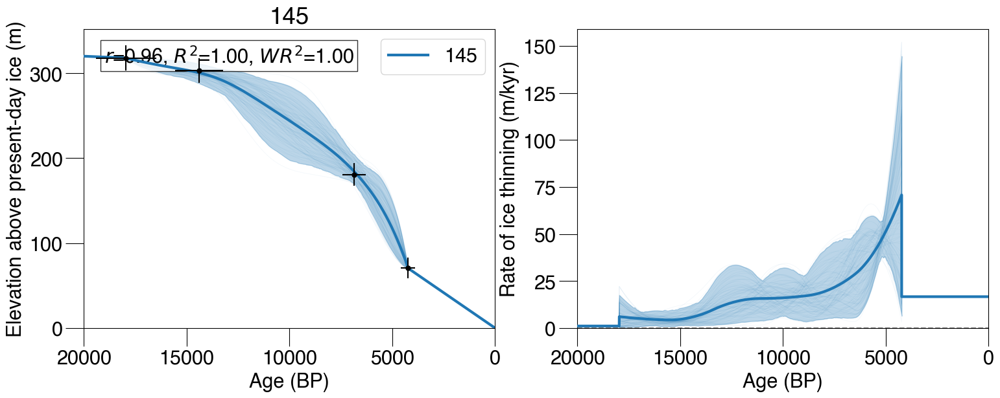

=== Running site 148 with test C3b ===
1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71 72 75 76 78 79 80 81 82 83 84 85 86 87 88 89 90 91 92 93 94 95 96 97 98 99 100 101 102 103 104 105 106 107 108 109 110 111 112 113 114 116 117 118 119 120 121 122 123 124 125 126 127 128 129 130 131 132 133 134 135 136 137 142 143 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161 162 163 164 165 166 167 168 169 concordant,concordant,concordant,1,1,1,1,1,concordant,concordant,concordant,concordant,concordant,Be,concordant,concordant,concordant,1,1,concordant,concordant,1,concordant,concordant,concordant,1,1,Be,concordant,concordant,Be,concordant,1,1,concordant,concordant,concordant,concordant,concordant,1,1,1,concordant,concordant,1,concordant,1,concordant,1,1,concordant,1,concordant,1,1,1,concordant,concordant,1,concordant,conco

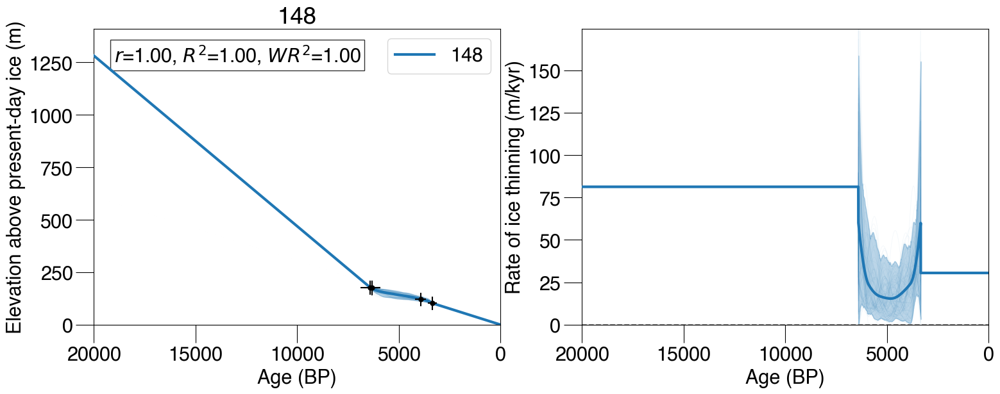

=== Running site 149 with test C4c ===
1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71 72 75 76 78 79 80 81 82 83 84 85 86 87 88 89 90 91 92 93 94 95 96 97 98 99 100 101 102 103 104 105 106 107 108 109 110 111 112 113 114 116 117 118 119 120 121 122 123 124 125 126 127 128 129 130 131 132 133 134 135 136 137 142 143 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161 162 163 164 165 166 167 168 169 concordant,concordant,concordant,1,1,1,1,1,concordant,concordant,concordant,concordant,concordant,Be,concordant,concordant,concordant,1,1,concordant,concordant,1,concordant,concordant,concordant,1,1,Be,concordant,concordant,Be,concordant,1,1,concordant,concordant,concordant,concordant,concordant,1,1,1,concordant,concordant,1,concordant,1,concordant,1,1,concordant,1,concordant,1,1,1,concordant,concordant,1,concordant,conco

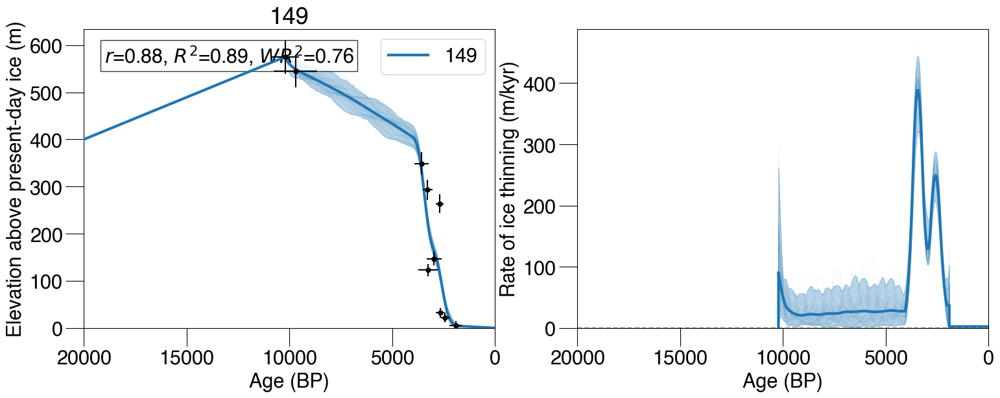

=== Running site 151 with test C5c ===
1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71 72 75 76 78 79 80 81 82 83 84 85 86 87 88 89 90 91 92 93 94 95 96 97 98 99 100 101 102 103 104 105 106 107 108 109 110 111 112 113 114 116 117 118 119 120 121 122 123 124 125 126 127 128 129 130 131 132 133 134 135 136 137 142 143 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161 162 163 164 165 166 167 168 169 concordant,concordant,concordant,1,1,1,1,1,concordant,concordant,concordant,concordant,concordant,Be,concordant,concordant,concordant,1,1,concordant,concordant,1,concordant,concordant,concordant,1,1,Be,concordant,concordant,Be,concordant,1,1,concordant,concordant,concordant,concordant,concordant,1,1,1,concordant,concordant,1,concordant,1,concordant,1,1,concordant,1,concordant,1,1,1,concordant,concordant,1,concordant,conco

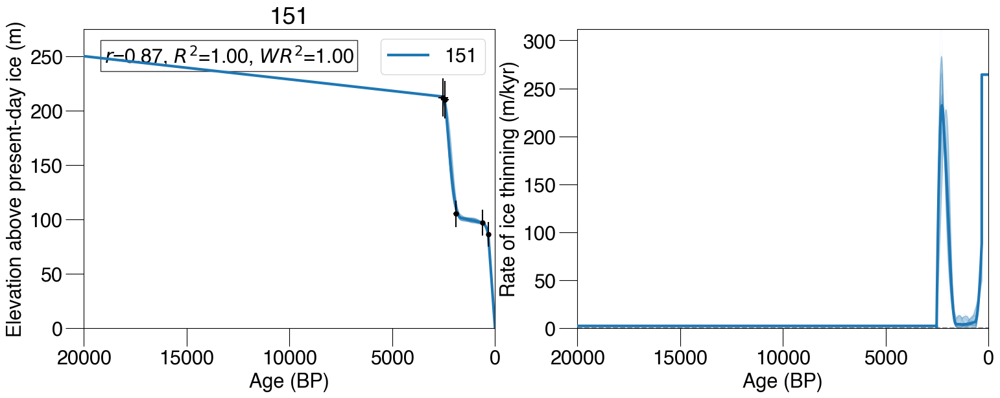

=== Running site 152 with test C3a ===
1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71 72 75 76 78 79 80 81 82 83 84 85 86 87 88 89 90 91 92 93 94 95 96 97 98 99 100 101 102 103 104 105 106 107 108 109 110 111 112 113 114 116 117 118 119 120 121 122 123 124 125 126 127 128 129 130 131 132 133 134 135 136 137 142 143 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161 162 163 164 165 166 167 168 169 concordant,concordant,concordant,1,1,1,1,1,concordant,concordant,concordant,concordant,concordant,Be,concordant,concordant,concordant,1,1,concordant,concordant,1,concordant,concordant,concordant,1,1,Be,concordant,concordant,Be,concordant,1,1,concordant,concordant,concordant,concordant,concordant,1,1,1,concordant,concordant,1,concordant,1,concordant,1,1,concordant,1,concordant,1,1,1,concordant,concordant,1,concordant,conco

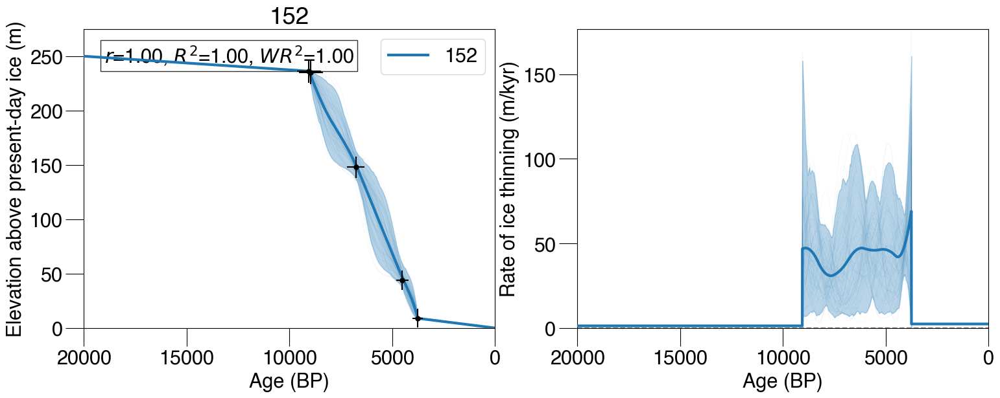

=== Running site 156 with test C3a ===
1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71 72 75 76 78 79 80 81 82 83 84 85 86 87 88 89 90 91 92 93 94 95 96 97 98 99 100 101 102 103 104 105 106 107 108 109 110 111 112 113 114 116 117 118 119 120 121 122 123 124 125 126 127 128 129 130 131 132 133 134 135 136 137 142 143 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161 162 163 164 165 166 167 168 169 concordant,concordant,concordant,1,1,1,1,1,concordant,concordant,concordant,concordant,concordant,Be,concordant,concordant,concordant,1,1,concordant,concordant,1,concordant,concordant,concordant,1,1,Be,concordant,concordant,Be,concordant,1,1,concordant,concordant,concordant,concordant,concordant,1,1,1,concordant,concordant,1,concordant,1,concordant,1,1,concordant,1,concordant,1,1,1,concordant,concordant,1,concordant,conco

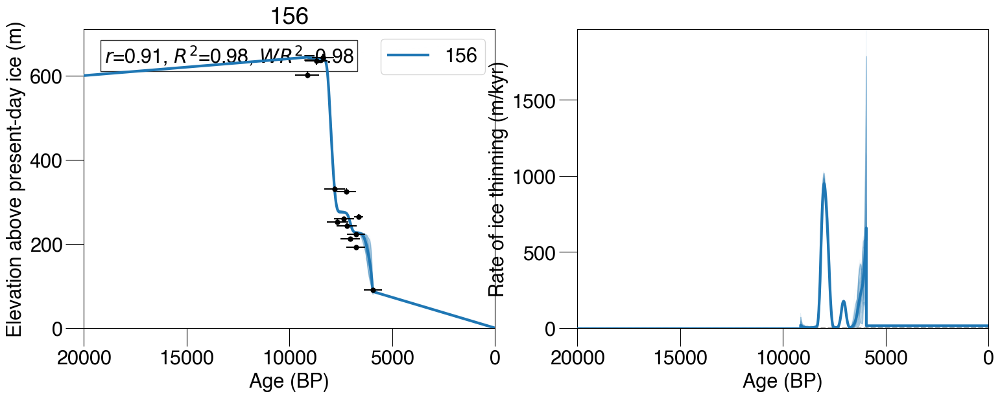

=== Running site 163 with test C3a ===
1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71 72 75 76 78 79 80 81 82 83 84 85 86 87 88 89 90 91 92 93 94 95 96 97 98 99 100 101 102 103 104 105 106 107 108 109 110 111 112 113 114 116 117 118 119 120 121 122 123 124 125 126 127 128 129 130 131 132 133 134 135 136 137 142 143 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161 162 163 164 165 166 167 168 169 concordant,concordant,concordant,1,1,1,1,1,concordant,concordant,concordant,concordant,concordant,Be,concordant,concordant,concordant,1,1,concordant,concordant,1,concordant,concordant,concordant,1,1,Be,concordant,concordant,Be,concordant,1,1,concordant,concordant,concordant,concordant,concordant,1,1,1,concordant,concordant,1,concordant,1,concordant,1,1,concordant,1,concordant,1,1,1,concordant,concordant,1,concordant,conco

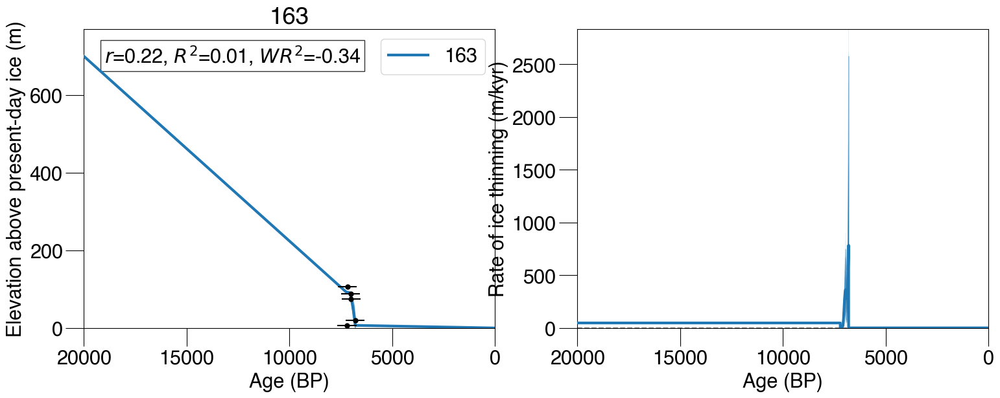

=== Running site 164 with test C7a ===
1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71 72 75 76 78 79 80 81 82 83 84 85 86 87 88 89 90 91 92 93 94 95 96 97 98 99 100 101 102 103 104 105 106 107 108 109 110 111 112 113 114 116 117 118 119 120 121 122 123 124 125 126 127 128 129 130 131 132 133 134 135 136 137 142 143 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161 162 163 164 165 166 167 168 169 concordant,concordant,concordant,1,1,1,1,1,concordant,concordant,concordant,concordant,concordant,Be,concordant,concordant,concordant,1,1,concordant,concordant,1,concordant,concordant,concordant,1,1,Be,concordant,concordant,Be,concordant,1,1,concordant,concordant,concordant,concordant,concordant,1,1,1,concordant,concordant,1,concordant,1,concordant,1,1,concordant,1,concordant,1,1,1,concordant,concordant,1,concordant,conco

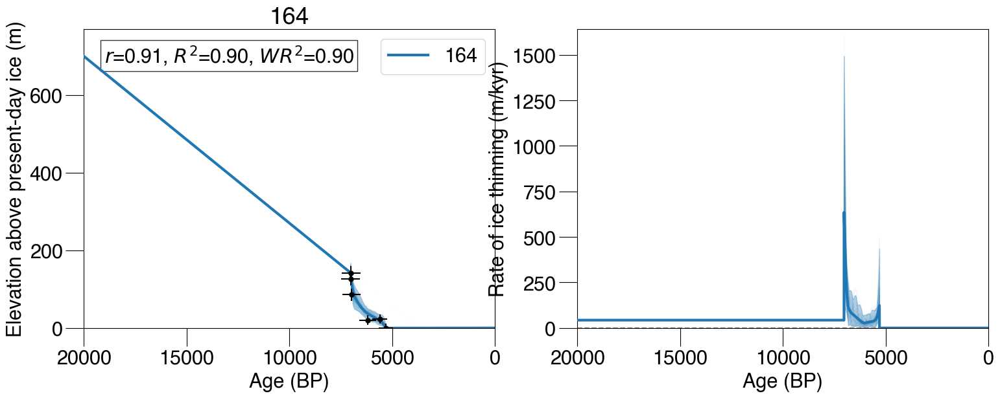

=== Running site 165 with test C3a ===
1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71 72 75 76 78 79 80 81 82 83 84 85 86 87 88 89 90 91 92 93 94 95 96 97 98 99 100 101 102 103 104 105 106 107 108 109 110 111 112 113 114 116 117 118 119 120 121 122 123 124 125 126 127 128 129 130 131 132 133 134 135 136 137 142 143 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161 162 163 164 165 166 167 168 169 concordant,concordant,concordant,1,1,1,1,1,concordant,concordant,concordant,concordant,concordant,Be,concordant,concordant,concordant,1,1,concordant,concordant,1,concordant,concordant,concordant,1,1,Be,concordant,concordant,Be,concordant,1,1,concordant,concordant,concordant,concordant,concordant,1,1,1,concordant,concordant,1,concordant,1,concordant,1,1,concordant,1,concordant,1,1,1,concordant,concordant,1,concordant,conco

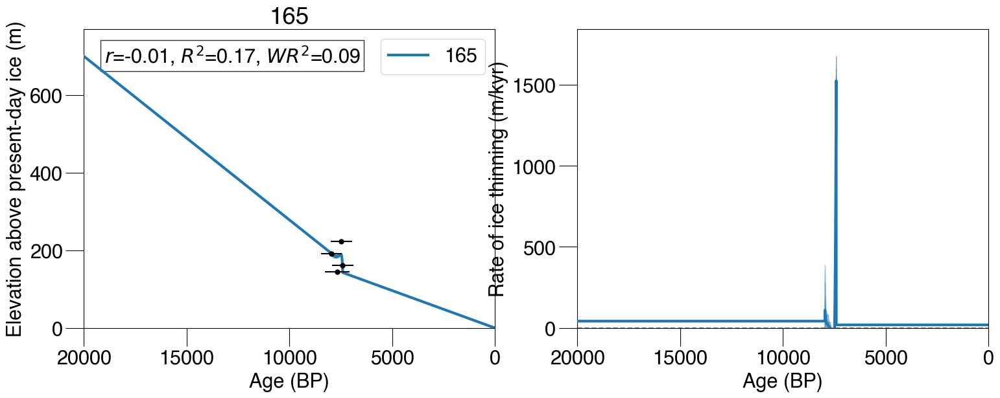

=== Running site 166 with test C3a ===
1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71 72 75 76 78 79 80 81 82 83 84 85 86 87 88 89 90 91 92 93 94 95 96 97 98 99 100 101 102 103 104 105 106 107 108 109 110 111 112 113 114 116 117 118 119 120 121 122 123 124 125 126 127 128 129 130 131 132 133 134 135 136 137 142 143 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161 162 163 164 165 166 167 168 169 concordant,concordant,concordant,1,1,1,1,1,concordant,concordant,concordant,concordant,concordant,Be,concordant,concordant,concordant,1,1,concordant,concordant,1,concordant,concordant,concordant,1,1,Be,concordant,concordant,Be,concordant,1,1,concordant,concordant,concordant,concordant,concordant,1,1,1,concordant,concordant,1,concordant,1,concordant,1,1,concordant,1,concordant,1,1,1,concordant,concordant,1,concordant,conco

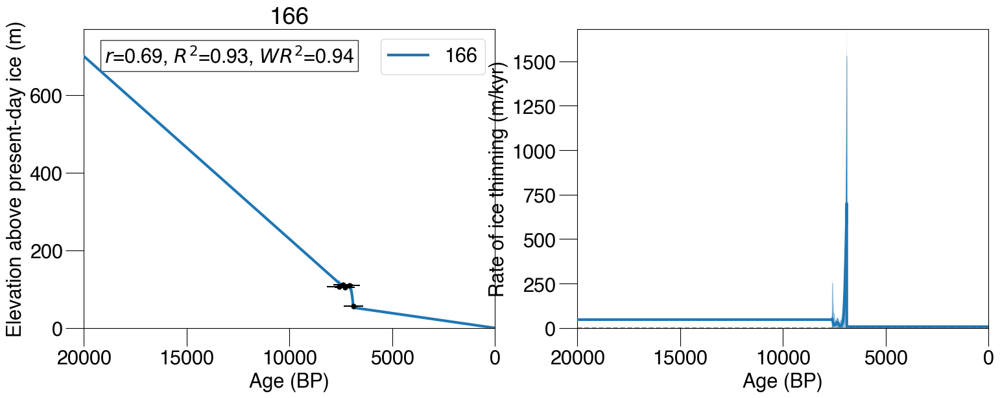

=== Running site 168 with test C3a ===
1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71 72 75 76 78 79 80 81 82 83 84 85 86 87 88 89 90 91 92 93 94 95 96 97 98 99 100 101 102 103 104 105 106 107 108 109 110 111 112 113 114 116 117 118 119 120 121 122 123 124 125 126 127 128 129 130 131 132 133 134 135 136 137 142 143 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161 162 163 164 165 166 167 168 169 concordant,concordant,concordant,1,1,1,1,1,concordant,concordant,concordant,concordant,concordant,Be,concordant,concordant,concordant,1,1,concordant,concordant,1,concordant,concordant,concordant,1,1,Be,concordant,concordant,Be,concordant,1,1,concordant,concordant,concordant,concordant,concordant,1,1,1,concordant,concordant,1,concordant,1,concordant,1,1,concordant,1,concordant,1,1,1,concordant,concordant,1,concordant,conco

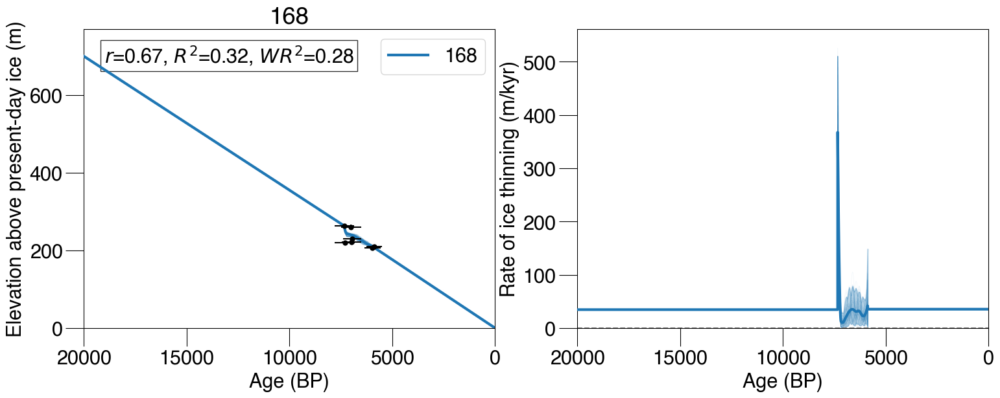

=== Running site 169 with test C3a ===
1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71 72 75 76 78 79 80 81 82 83 84 85 86 87 88 89 90 91 92 93 94 95 96 97 98 99 100 101 102 103 104 105 106 107 108 109 110 111 112 113 114 116 117 118 119 120 121 122 123 124 125 126 127 128 129 130 131 132 133 134 135 136 137 142 143 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161 162 163 164 165 166 167 168 169 concordant,concordant,concordant,1,1,1,1,1,concordant,concordant,concordant,concordant,concordant,Be,concordant,concordant,concordant,1,1,concordant,concordant,1,concordant,concordant,concordant,1,1,Be,concordant,concordant,Be,concordant,1,1,concordant,concordant,concordant,concordant,concordant,1,1,1,concordant,concordant,1,concordant,1,concordant,1,1,concordant,1,concordant,1,1,1,concordant,concordant,1,concordant,conco

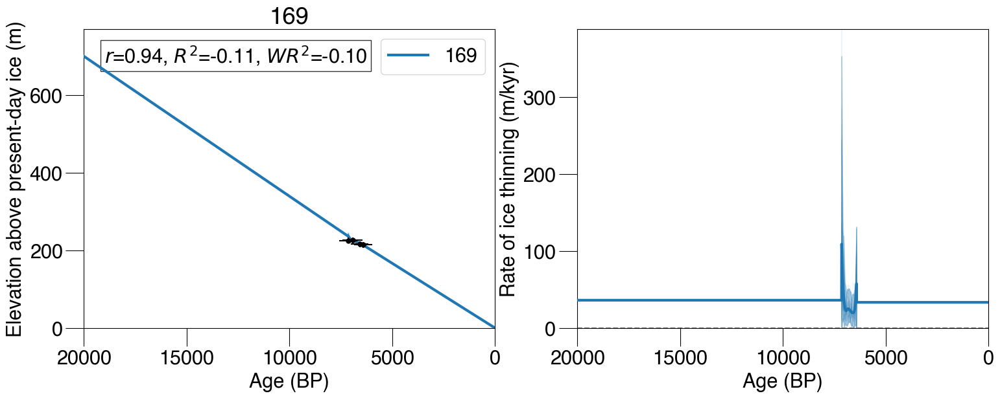

=== Running site 161 with test C4a ===
1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71 72 75 76 78 79 80 81 82 83 84 85 86 87 88 89 90 91 92 93 94 95 96 97 98 99 100 101 102 103 104 105 106 107 108 109 110 111 112 113 114 116 117 118 119 120 121 122 123 124 125 126 127 128 129 130 131 132 133 134 135 136 137 142 143 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161 162 163 164 165 166 167 168 169 concordant,concordant,concordant,1,1,1,1,1,concordant,concordant,concordant,concordant,concordant,Be,concordant,concordant,concordant,1,1,concordant,concordant,1,concordant,concordant,concordant,1,1,Be,concordant,concordant,Be,concordant,1,1,concordant,concordant,concordant,concordant,concordant,1,1,1,concordant,concordant,1,concordant,1,concordant,1,1,concordant,1,concordant,1,1,1,concordant,concordant,1,concordant,conco

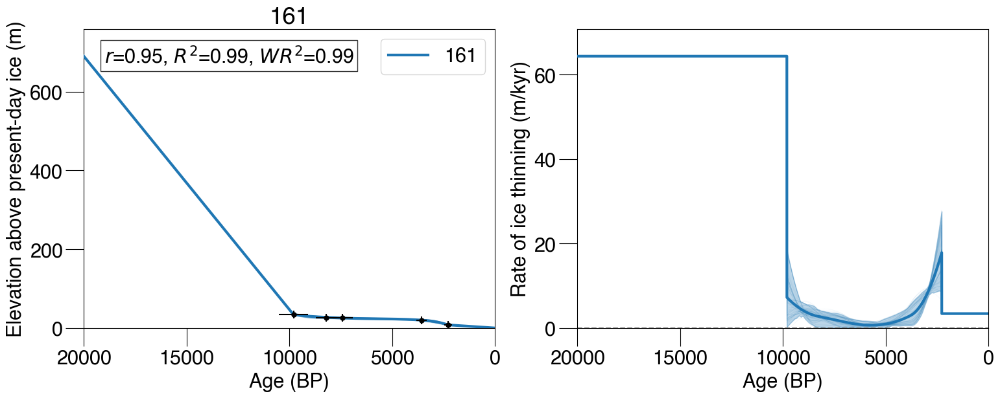

In [15]:
# Full Bayesian spline processing and plotting (LGM INCLUDED + STATS)
import re
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import xarray as xr
from sklearn.metrics import r2_score

ncolors = [
    'tab:blue',
    'tab:orange',
    'tab:green',
    'tab:red',
    'tab:purple',
    'tab:brown',
    'tab:pink',
    'tab:gray',
    'tab:olive',
    'tab:cyan'
]
# Function to plot elevation-time regression
def plot_tem_regression(
    x, y, xerrs, yerrs,
    ages_post, elv_post, elv_lo_bound, elv_hi_bound,
    elv_rate_post, elv_rate_lo_bound, elv_rate_hi_bound,
    title, color, fig=None, axes=None, placename=None,
    yhi=None, xhi=20000, LGM_lim=None,
    elv_post_samples=None, elv_post_rate_samples=None
):
    
    # this is sorting everything by age
    sort_idx = np.argsort(ages_post)
    ages_post         = ages_post[sort_idx]
    elv_post          = elv_post[sort_idx]
    elv_lo_bound      = elv_lo_bound[sort_idx]
    elv_hi_bound      = elv_hi_bound[sort_idx]
    elv_rate_post     = elv_rate_post[sort_idx]
    elv_rate_lo_bound = elv_rate_lo_bound[sort_idx]
    elv_rate_hi_bound = elv_rate_hi_bound[sort_idx]

    if elv_post_samples is not None:
        elv_post_samples = elv_post_samples[sort_idx, :]
    if elv_post_rate_samples is not None:
        elv_post_rate_samples = elv_post_rate_samples[sort_idx, :]

    if fig is None or axes is None:
        fig, axes = plt.subplots(1, 2, figsize=(18, 6))


    # LEFT PANEL — Elevation
    ax0 = axes[0]
    ax0.grid(False)

    # Observations
    ax0.errorbar(
        x, y, xerr=xerrs, yerr=yerrs,
        fmt='o', color='black', markersize=5, zorder=5
    )

    # Stats for the spline performance based on the selected sensitivities (computed ONLY on observed domain)
    pred = np.interp(x, ages_post, elv_post)
    mask = np.isfinite(pred) & np.isfinite(y)

    if np.sum(mask) >= 2:
        r = np.corrcoef(x[mask], y[mask])[0, 1]
        r2 = r2_score(y[mask], pred[mask])

        w = 1.0 / np.clip(yerrs[mask], 1e-6, None)**2
        wrss = np.sum(w * (y[mask] - pred[mask])**2)
        ybar = np.average(y[mask], weights=w)
        wr2 = 1 - wrss / np.sum(w * (y[mask] - ybar)**2)
    else:
        r = r2 = wr2 = wrss = np.nan

    ax0.text(
        0.05, 0.95,
        f'$r$={r:.2f}, $R^2$={r2:.2f}, $WR^2$={wr2:.2f}',
        transform=ax0.transAxes,
        ha='left', va='top',
        bbox=dict(facecolor='white', alpha=0.8)
    )

    # Bootstrap samples
    if elv_post_samples is not None:
        for i in range(0, elv_post_samples.shape[1], 10):
            ax0.plot(
                ages_post, elv_post_samples[:, i],
                color=color, alpha=0.05, linewidth=0.6, zorder=1
            )

    # CI envelope
    ax0.fill_between(
        ages_post, elv_lo_bound, elv_hi_bound,
        color=color, alpha=0.3, zorder=2
    )

    # Mean spline (now includes LGM extension)
    ax0.plot(
        ages_post, elv_post,
        color=color, linewidth=3,
        label=placename, zorder=4
    )

    ymax = max(
        np.nanmax(elv_hi_bound) * 1.1,
        LGM_lim * 1.1 if LGM_lim is not None else 0
    )

    ax0.set_xlim(xhi, 0)
    ax0.set_ylim(0, ymax)
    ax0.set_xlabel('Age (BP)')
    ax0.set_ylabel('Elevation above present-day ice (m)')
    ax0.set_title(title)
    ax0.legend()

    # RIGHT PANEL — Thinning Rate
    ax1 = axes[1]
    ax1.grid(False)

    if elv_post_rate_samples is not None:
        for i in range(0, elv_post_rate_samples.shape[1], 10):
            ax1.plot(
                ages_post, elv_post_rate_samples[:, i],
                color=color, alpha=0.05, linewidth=0.6, zorder=1
            )

    ax1.fill_between(
        ages_post, elv_rate_lo_bound, elv_rate_hi_bound,
        color=color, alpha=0.3, zorder=2
    )

    ax1.plot(
        ages_post, elv_rate_post,
        color=color, linewidth=3, zorder=4
    )

    ax1.axhline(0, color='gray', linestyle='dashed')
    ax1.set_xlim(xhi, 0)
    ax1.set_ylim(0, np.nanmax(elv_rate_hi_bound) * 1.1)
    ax1.set_xlabel('Age (BP)')
    ax1.set_ylabel('Rate of ice thinning (m/kyr)')

    return fig, axes, r, r2, wr2, wrss


# Loop over all sites & sensitivity tests
all_dses = []
all_metrics = []

for site_id, SENSITIVITY_TEST in best_tests_map.items():
    print(f"=== Running site {site_id} with test {SENSITIVITY_TEST} ===")

    data_in, data_all, data_rejected = load_data(
        'icedcurrent_v14_EM.xlsx',
        SENSITIVITY_TEST=SENSITIVITY_TEST
    )

    data = data_all[data_all['Group'] == site_id]

    for clustername, cluster in data.groupby('cluster'):
        for i, (name, grp) in enumerate(cluster.groupby('Group')):

            if len(grp) < 4:
                continue

            x, y, xerrs, yerrs = make_data_xy(grp)

            outputs = run_bayesian_spline(
                x, xerrs, y, yerrs,
                n_samples=1000,
                SENSITIVITY_TEST=SENSITIVITY_TEST
            )

            x_fine, y_fine, lower_bound, upper_bound, bootstrap_samples = outputs[:5]
            mean_rate, rate_upper, rate_lower, rate_samples = outputs[5:]

            # Convert rates to m/kyr
            mean_rate *= 1000
            rate_upper *= 1000
            rate_lower *= 1000
            rate_samples *= 1000

            # ---------------- FULL TIME AXIS ----------------
            fulltime = np.arange(0, 20001, 5)
            lo = fulltime[fulltime < x_fine.min()]
            hi = fulltime[fulltime > x_fine.max()]

            # ---------------- PRE-DATA EXTENSION ----------------
            loz = np.linspace(0, y_fine.min(), len(lo))
            loz_rate = np.gradient(loz) * (1000 / 5) if len(lo) > 1 else np.zeros(len(lo))

            # ---------------- LGM EXTENSION ----------------
            last_age = x_fine.max()
            last_elv = y_fine[x_fine.argmax()]

            lgm_age = 20000.0
            lgm_elv = grp['rel_elv_LGM_m'].mean()

            hiz = np.interp(hi, [last_age, lgm_age], [last_elv, lgm_elv])

            slope_m_per_yr = (lgm_elv - last_elv) / (lgm_age - last_age)
            hiz_rate = np.full(len(hi), slope_m_per_yr * 1000)

            # Concatenate full spline
            ages_post         = np.concatenate([lo, x_fine, hi])
            elv_post          = np.concatenate([loz, y_fine, hiz])
            elv_lo_bound      = np.concatenate([loz, lower_bound, hiz])
            elv_hi_bound      = np.concatenate([loz, upper_bound, hiz])
            elv_rate_post     = np.concatenate([loz_rate, mean_rate, hiz_rate])
            elv_rate_lo_bound = np.concatenate([loz_rate, rate_lower, hiz_rate])
            elv_rate_hi_bound = np.concatenate([loz_rate, rate_upper, hiz_rate])

            # Bootstrap
            nsamp = bootstrap_samples.shape[1]

            elv_post_samples = np.concatenate([
                np.tile(loz[:, None], (1, nsamp)),
                bootstrap_samples,
                np.tile(hiz[:, None], (1, nsamp))
            ])

            elv_post_rate_samples = np.concatenate([
                np.tile(loz_rate[:, None], (1, nsamp)),
                rate_samples,
                np.tile(hiz_rate[:, None], (1, nsamp))
            ])

            # Build dataset
            ds = xr.Dataset(
                data_vars=dict(
                    elv_post=(['age', 'site'], elv_post[:, None]),
                    elv_rate_post=(['age', 'site'], elv_rate_post[:, None]),
                    elv_post_samples=(['age', 'samples', 'site'],
                                      elv_post_samples[:, :, None]),
                    elv_post_rate_samples=(['age', 'samples', 'site'],
                                           elv_post_rate_samples[:, :, None]),
                ),
                coords=dict(
                    age=ages_post,
                    site=[name],
                    lat=[grp.lat_DD.mean()],
                    lon=[grp.lon_DD.mean()],
                    samples=np.arange(nsamp),
                ),
            ).interp(age=np.arange(0, 20001, 2))

            all_dses.append(ds)

            fig, axes, r, r2, wr2, wrss = plot_tem_regression(
                x, y, xerrs, yerrs,
                ages_post, elv_post, elv_lo_bound, elv_hi_bound,
                elv_rate_post, elv_rate_lo_bound, elv_rate_hi_bound,
                title=name,
                color=ncolors[i % len(ncolors)],
                placename=name,
                LGM_lim=lgm_elv,
                elv_post_samples=elv_post_samples,
                elv_post_rate_samples=elv_post_rate_samples
            )

            all_metrics.append({
                'Site': name,
                'r': r,
                'R2': r2,
                'WR2': wr2,
                'WRSS': wrss,
            })

            plt.show()


In [17]:
# Define sites to exclude based on R-squared values (anything below 0.5)
exclude_sites = {3, 39, 48, 53, 55, 63, 66, 72, 87, 88, 95, 103, 105, 123, 124, 135, 163, 165, 168, 169}

ds_sites = xr.concat(all_dses, dim='site')
print("Sites in ds_sites before filtering:", ds_sites['site'].values)

Sites in ds_sites before filtering: [  3   4   7  11  15  17  21  22  24  27  42  28  72  30  33  34  75  37
  39  40  45  46  47  78  79  80  48  49  50  52  53  54  55  56  57  59
  60  61  62  63  64  66  67  68  70  85  87  88  90  91  95  97 111 103
 114 105 116 144 121 122 123 142 124 125 128 129 135 145 148 149 151 152
 156 163 164 165 166 168 169 161]


In [ ]:
_site_metadata_raw = """
Lutzlow-Holm Bay
3	Skarvsnes	-69.484	39.67368	>350
4	Skarvsnes	-69.485	39.6975	>350
7	Skallen	-69.654625	39.4503	>350
11	Skarvsnes	-69.429812	39.609162	>350
Rauer Group
15	Mosquito Island, Hop Island	-68.836282	77.791297	>600
Vestfold Hills
17	Vestfold Hills	-68.53284	78.5078	600-700
Gjelsvikfjella
21	Grjotfjellet	-72.042282	2.496523	300-800
22	Rabben	-71.857369	2.8234	120-250
Framnes Mountains
24	North Masson Range	-67.783904	62.80639	350-400
Terra Nova Bay
27	Jang Bogo Hills	-74.617553	164.228172	90
David Glacier
28	Hughes Bluff	-75.394024	162.214225	990-1000
30	Mount Kring	-74.991042	157.919722	990-1000
Byrd Glacier
33	Lonewolf Nunataks, GPS Nunatak, LW2 Nunatak, Tiger Nunatak	-81.349025	152.731284	400-700
34	Lonewolf Nunataks, LW1 Nunatak	-81.283368	153.227567	400-700
McMurdo Ice Shelf
37	Mt. Discovery	-78.304526	165.56273	520
Prince Charles Mountains
40	Mt. Stinear	-73.0406	66.46165	250-800
Terra Nova Bay
42	Inexpressible Island	-74.874092	163.65919	>400
Aviator Glacier
45	Ridge F	-73.961663	165.076669	400
Darwin and Hatherton Glaciers
46	Lake Wellman	-79.915794	156.836147	500
47	Lake Wellman	-79.89833	156.805004	500
Mawson Glacier
49	Mt. Murray	-76.186183	161.994257	260
50	Mt. Murray	-76.192064	161.947923	260
Mackay Glacier
52	Low Ridge	-76.989388	162.277412	260-340
53	Gondola Ridge	-77.004156	161.7613	260-340
54	Mt. Suess	-77.035708	161.640075	260-340
Beardmore Glacier
56	Mt. Hope	-83.5085	171.423683	1000-1100
57	Mt. Hope	-83.516961	171.394867	1000-1100
Shackleton Glacier
59	Gemini Nunataks	-84.707625	-176.6065	310-655
Scott Glacier
60	Karo Hills	-85.493427	-154.549361	1000-1100
61	Mt. Rigby	-85.530855	-154.534622	1000-1100
Reedy Glacier
62	Quartz Hills	-85.900171	-132.607072	1060-1400
63	Bedrock Candy Mountain, Joni G. Nunatak, Striated Knoll	-85.404547	-135.942578	1060-1400
64	Cohen Nunatak	-85.402436	-136.210922	1060-1400
67	Polygon Spur, Mim's Spur	-86.03592	-125.848673	1060-1400
Tucker Glacier
68	Shark Fin	-72.689562	169.547459	300-350
70	Crater Cirque	-72.603591	169.351579	300-350
Darwin and Hatherton Glaciers
75	Diamond Hill	-79.898193	159.117459	500
78	Bibra Valley, Britannia 1 deposits	-79.984697	155.501427	<300
79	Danum Platform, Britannia 1 deposits, Updog Mountain	-79.974659	155.525177	300-350
80	Magnis Valley	-80.076999	156.164209	300-350
Northeastern Antarctic Peninsula
85	Cape Framnes, Jason Peninsula	-66.015519	-60.56418	490
James Ross Island
90	Lachman Mesa, Johnson Mesa	-63.83215	-57.89082	100-350
91	Cape Lachman	-63.78984	-57.795797	100-350
97	Lagrelius Peninsula	-63.919397	-58.302663	100-350
Northeastern Antarctic Peninsula
111	Sjogren-Boydell fjord, unnamed nunatak C	-64.224496	-59.018726	300-570
114	Drygalski Glacier, unnamed nunatak E	-64.700728	-60.613598	>500
Neptune Range
116	Mt. Bragg	-84.099559	-56.782103	>380
Williams Hills
121	Camp Rocks	-83.636175	-59.014835	>500
122	Last Nunatak	-83.746	-58.99211	>500
Ellsworth Mountains
125	Flowers Hills 3, Flowers Hills 2, Flowers Hills 1	-78.470717	-84.08554	1140
128	Marble Hills	-80.263287	-82.114664	>640
129	Marble Hills	-80.258655	-82.13678	>640
Williams Hills
142	Camp Rocks, Itsy Bitsy Rock, Mt. Hobbs, Last Nunatak, Mt. Warnke massif, Clapperton Ridge	-83.699664	-58.965295	>500
Thomas Hills
144	South Mainland	-84.432697	-66.128816	>400
Pirrit Hills
145	Mount Axtell, Mt. Tidd	-81.13952	-85.355735	>320
Clark Mountains
148	Mt. Van Valkenburg	-77.312075	-142.11098	1282
Sarnoff Mountains
149	Mt. Rea - The Billboard massif	-77.06856	-145.57896	200-400
151	Mt. Rea - The Billboard massif	-77.08276	-145.54864	200-400
Allegheny Mountains
152	Mt. Spencer, Mt. Darling	-77.26504	-143.3305	200-400
Mt. Murphy Massif
156	Dorrel Rock, Icefall Nunatak, Notebook Cliffs, Kay Peak, Turtle Rock	-75.380198	-111.2009	300-600
Pine Island Bay
161	Lindsey Islands, Edwards Islands	-73.702577	-103.003563	>690
Hudson Mountains
163	Maish Nunatak	-74.592516	-99.449306	>700
164	Mt. Moses	-74.552285	-99.195232	>700
166	Winkie Nunatak	-74.861108	-99.780244	>700
""".strip()

In [41]:
# Extract mean thickness over time from all the sites with an R-squared >0.5
import pandas as pd

def _parse_site_metadata(raw_text):
    rows = []
    current_region = None

    for line in raw_text.splitlines():
        line = line.strip()
        if not line:
            continue

        parts = line.split('\t')

        if parts[0].isdigit():
            if len(parts) != 5:
                raise ValueError(f"Unexpected site metadata row: {line!r}")
            site_id, sub_region, lat, lon, thickness = parts
            rows.append({
                'Site': int(site_id),
                'Region': current_region,
                'Subregion': sub_region.strip(),
                'Latm': float(lat),
                'Lonm': float(lon),
                'LGM_Ice_Thickness_m': thickness.strip()
            })
        else:
            current_region = line
    return pd.DataFrame(rows)

site_meta = (
    _parse_site_metadata(_site_metadata_raw)
    .drop_duplicates(subset='Site')
    .set_index('Site')
)

# Loop through sites, skipping excluded ones
records = []

for sid in ds_sites['site'].values:

    if sid in exclude_sites:
        continue

    elv  = ds_sites['elv_post'].sel(site=sid)
    ages = elv['age'].values
    vals = elv.values

    if sid not in site_meta.index:
        raise KeyError(
            f"Site {sid} has no entry in the Table 2.1 metadata -- "
            f"add it there, or drop this site via exclude_sites"
        )

    meta = site_meta.loc[sid]

    records.append(pd.DataFrame({
        'Site':                sid,
        'Region':              meta['Region'],
        'Subregion':           meta['Subregion'],
        'Age':                 ages,
        'Thickness':           vals,
        'Latm':                meta['Latm'],
        'Lonm':                meta['Lonm'],
        'LGM_Ice_Thickness_m': meta['LGM_Ice_Thickness_m']
    }))

th_df = pd.concat(records, ignore_index=True)


# Pad endpoints so each site has Age = 20000 and Age = 0
def pad_endpoints(df):
    out = []
    const_cols = ['Region', 'Subregion', 'Latm', 'Lonm', 'LGM_Ice_Thickness_m']

    for sid, grp in df.groupby('Site'):
        grp = grp.copy()
        min_age, max_age = grp['Age'].min(), grp['Age'].max()
        const_vals = grp[const_cols].iloc[0].to_dict()

        if 20000 not in grp['Age'].values:
            t0 = grp.loc[grp['Age'] == min_age, 'Thickness'].iloc[0]
            grp = pd.concat([grp, pd.DataFrame([{
                'Site': sid, 'Age': 20000, 'Thickness': t0, **const_vals
            }])], ignore_index=True)

        if 0 not in grp['Age'].values:
            t1 = grp.loc[grp['Age'] == max_age, 'Thickness'].iloc[0]
            grp = pd.concat([grp, pd.DataFrame([{
                'Site': sid, 'Age': 0, 'Thickness': t1, **const_vals
            }])], ignore_index=True)

        out.append(grp)

    full = pd.concat(out, ignore_index=True)
    return full.sort_values(['Site', 'Age'], ascending=[True, False]).reset_index(drop=True)


th_df = pad_endpoints(th_df)

th_df = th_df[
    [
        'Site', 'Region', 'Subregion',
        'Age', 'Thickness', 'Latm', 'Lonm',
        'LGM_Ice_Thickness_m'
    ]
]

# Save output in a CSV
output_path = "thicknesstimeseriesmeanfinal.csv"
th_df.to_csv(output_path, index=False)
print(f"Wrote: {output_path}")

Wrote: thicknesstimeseriesmeanfinal.csv


## Sampling Upper and Lower Uncertainty Bounds

In [40]:
import numpy as np
import pandas as pd

def _parse_site_metadata(raw_text):
    rows = []
    current_region = None

    for line in raw_text.splitlines():
        line = line.strip()
        if not line:
            continue

        parts = line.split('\t')

        if parts[0].isdigit():
            if len(parts) != 5:
                raise ValueError(f"Unexpected site metadata row: {line!r}")
            site_id, sub_region, lat, lon, thickness = parts
            rows.append({
                'Site': int(site_id),
                'Region': current_region,
                'Subregion': sub_region.strip(),
                'Latm': float(lat),
                'Lonm': float(lon),
                'LGM_Ice_Thickness_m': thickness.strip()
            })
        else:
            current_region = line

    return pd.DataFrame(rows)


site_meta = (
    _parse_site_metadata(_site_metadata_raw)
    .drop_duplicates(subset='Site')
    .set_index('Site')
)


# Initialize empty DataFrames
df_lower = pd.DataFrame()
df_upper = pd.DataFrame()

# Grab shared age axis (1D)
age_values = ds_sites['elv_post'].coords['age'].values

# Loop through sites, skipping excluded ones
for site in ds_sites.site.values:
    if site in exclude_sites:
        continue

    # Extract bootstrap samples for this site: shape (n_samples, n_ages)
    samples = ds_sites['elv_post_samples'].sel(site=site).values

    # If samples are transposed, fix it
    if samples.shape[1] != len(age_values):
        samples = samples.T

    # Sanity check
    assert samples.shape[1] == len(age_values), (
        f"Mismatch for site {site}: samples shape = {samples.shape}, "
        f"age_values length = {len(age_values)}"
    )

    # Compute 2.5th and 97.5th percentiles
    lower_vals = np.nanpercentile(samples, 2.5, axis=0)
    upper_vals = np.nanpercentile(samples, 97.5, axis=0)

    # Get site metadata from Table 2.1 -- NOT from ds_sites['lat']/['lon']
    if site not in site_meta.index:
        raise KeyError(
            f"Site {site} has no entry in the Table 2.1 metadata -- "
            f"add it there, or drop this site via exclude_sites"
        )

    meta = site_meta.loc[site]

    # Build DataFrame rows
    df_site_lower = pd.DataFrame({
        'Site':                site,
        'Region':              meta['Region'],
        'Subregion':           meta['Subregion'],
        'Age':                 age_values,
        'Thickness':           lower_vals,
        'Latm':                meta['Latm'],
        'Lonm':                meta['Lonm'],
        'LGM_Ice_Thickness_m': meta['LGM_Ice_Thickness_m']
    })
    df_lower = pd.concat([df_lower, df_site_lower], ignore_index=True)

    df_site_upper = pd.DataFrame({
        'Site':                site,
        'Region':              meta['Region'],
        'Subregion':           meta['Subregion'],
        'Age':                 age_values,
        'Thickness':           upper_vals,
        'Latm':                meta['Latm'],
        'Lonm':                meta['Lonm'],
        'LGM_Ice_Thickness_m': meta['LGM_Ice_Thickness_m']
    })
    df_upper = pd.concat([df_upper, df_site_upper], ignore_index=True)


# Pad endpoints so each site has Age = 20000 and Age = 0
def pad(df):
    padded = []
    const_cols = ['Region', 'Subregion', 'Latm', 'Lonm', 'LGM_Ice_Thickness_m']

    for site in df['Site'].unique():
        s_df = df[df['Site'] == site].copy()
        ages = s_df['Age'].values
        const_vals = s_df[const_cols].iloc[0].to_dict()

        if 20000 not in ages:
            first = s_df.loc[s_df['Age'].idxmin()]
            padded.append({
                'Site':      site,
                'Age':       20000,
                'Thickness': first['Thickness'],
                **const_vals
            })
        if 0 not in ages:
            last = s_df.loc[s_df['Age'].idxmax()]
            padded.append({
                'Site':      site,
                'Age':       0,
                'Thickness': last['Thickness'],
                **const_vals
            })
    if padded:
        df = pd.concat([df, pd.DataFrame(padded)], ignore_index=True)
    return df.sort_values(['Site', 'Age'], ascending=[True, False]).reset_index(drop=True)


df_lower = pad(df_lower)
df_upper = pad(df_upper)

col_order = [
    'Site', 'Region', 'Subregion',
    'Age', 'Thickness', 'Latm', 'Lonm',
    'LGM_Ice_Thickness_m'
]
df_lower = df_lower[col_order]
df_upper = df_upper[col_order]

# Save out to CSV
df_lower.to_csv("thicknesstimeserieslowerCIfinal.csv", index=False)
df_upper.to_csv("thicknesstimeseriesupperCIfinal.csv", index=False)